In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
case_oppertunity = pd.read_csv('/Users/h1zhen/Documents/UW/Capstone/0509/case_oppertunities.csv')
print(case_oppertunity.shape)
print(case_oppertunity.columns)
print(case_oppertunity['ACCOUNTKEY'].nunique())
print(case_oppertunity['CASE_NUMBER'].nunique())

(183669, 35)
Index(['Unnamed: 0', 'STATUS', 'PRIORITY', 'IMPACT', 'ORIGIN', 'PRODUCT',
       'CATEGORY', 'SUBCATEGORY', 'CREATED_DATE', 'CLOSED_DATE',
       'CASE_CLOSED_REASON', 'RECORDTYPE', 'CASE_NUMBER', 'ACCOUNTKEY',
       'ACCOUNTTYPE', 'ACCOUNTTYPEDETAIL', 'EMPLOYEECOUNT', 'THEATER',
       'SUBREGION', 'SEGMENT', 'SUBSEGMENT', 'Tenure', 'Zero.Revenue.Flag',
       'Einstein Analytics', 'Role Based - Online', 'Server', 'Saas',
       'Role Based - On Prem', 'Services', 'Desktop', 'Role Based - NonProd',
       'Other', 'CLOSEDATE', 'ISWON', 'ISPARTNERRELATED'],
      dtype='object')
28348
183669


In [190]:
recent_opp_act = case_oppertunity.sort_values('CLOSEDATE', ascending=False).drop_duplicates('ACCOUNTKEY')
recent_opp_act['total_acv'] = recent_opp_act[['Einstein Analytics', 'Role Based - Online',
                                              'Server', 'Saas', 'Role Based - On Prem',
                                              'Services', 'Desktop', 'Role Based - NonProd']].sum()
print(recent_opp_act.shape)

(28348, 36)


In [252]:
# read topic data generated with topic modeling
topics = pd.read_csv('/Users/h1zhen/Documents/UW/Capstone/0509/Topic_cohort.csv')
print(topics)

     Topic 1  Topic 2    Topic 3   Topic 4  Topic 5
0        pii     name  dashboard     error  tableau
1       user      pii        use   connect   server
2      error    email        can      data      run
3    version    pleas       show       tri   servic
4       site   licens       view      issu   upgrad
5        set    https        one   desktop      tsm
6        use    thank       like     sourc     node
7        log  tableau       user      work      log
8     instal      key       step       get     file
9       fail    activ      chang   extract    start
10  configur      can     filter  workbook   status
11    follow      url       want   refresh   instal
12       get     team        see   publish     prep
13   request  support      creat     unabl  process
14      file  product       will       abl   window
15      info     help       need    access     fail
16     https     need       tabl    attach     stop
17     login   regard     report     onlin    error
18   authent

In [172]:
# read case data
case_text = pd.read_csv('/Users/h1zhen/Downloads/support_cases_text_fact.csv')
case_text = case_text[["CASE_NUMBER", "DESCRIPTION"]]

# drop empty text boxes
case_text.dropna(subset = ["DESCRIPTION"], inplace=True)

print(case_text.shape)

(203367, 2)


In [219]:
# subest the DESCRIPTION column for text analysis
test = case_text["DESCRIPTION"].iloc[:,]

In [220]:
def assign_cohort(x):
    """
    For each case, calculate the word occurence of each topic. 
    
    :param x: list, text data
    :return: list, flags for each case
    """
    topic_flag = []
    for i in range(len(x)):
        line = x.iloc[i,]
        topic_dict = {}
        
        # loop over five topics
        for j in range(0,5):
            topic_count = 0
            
            # loop over 20 words in a topic
            for word in topics.iloc[:, j]:
                if word in line:
                        topic_count += 1
                    
            # select the topic with most words appeared in the line
            topic_index = str(j+1)
            topic_dict[topic_index] = topic_count
        # print(topic_dict)
        chosen_topic = int(max(topic_dict, key=topic_dict.get))
        topic_flag.append(chosen_topic)
            
    return(topic_flag)
            

In [221]:
# assign flags to each case
flags4context = assign_cohort(test)

{'1': 3, '2': 3, '3': 2, '4': 3, '5': 14}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 11, '5': 4}
{'1': 0, '2': 3, '3': 3, '4': 2, '5': 4}
{'1': 1, '2': 2, '3': 6, '4': 5, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 5, '3': 8, '4': 10, '5': 3}
{'1': 1, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 4, '2': 4, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 2}
{'1': 5, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 8, '5': 3}
{'1': 2, '2':

{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 7, '4': 6, '5': 1}
{'1': 4, '2': 3, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 6}
{'1': 1, '2': 4, '3': 2, '4': 0, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 10, '4': 10, '5': 3}
{'1': 1, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 7, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 4, '4': 9, '5': 3}
{'1': 8, '2': 

{'1': 5, '2': 3, '3': 4, '4': 9, '5': 10}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 4, '5': 4}
{'1': 2, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 6, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 9, '5': 4}
{'1': 2, '2': 0, '3': 5, '4': 6, '5': 1}
{'1': 6, '2': 4, '3': 4, '4': 5, '5': 10}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 1, '4': 4, '5': 6}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 12, '2': 7, '3': 11, '4': 7, '5': 10}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 8, '2': 5, '3': 5, '4': 6, '5': 11}
{'1': 1, '

{'1': 6, '2': 4, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 8}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 4, '5': 6}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 7, '3': 6, '4': 7, '5': 6}
{'1': 3, '2': 1,

{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 5, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 5, '5': 2}
{'1': 9, '2': 4, '3': 1, '4': 7, '5': 5}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 9, '5': 2}
{'1': 1, '2': 4, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 4, '3': 3, '4': 5, '5': 11}
{'1': 1, '2': 5, '3': 2, '4': 2, '5': 5}
{'1': 2, '2': 4, '3': 9, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 6, '5': 4}
{'1': 5, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 5, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 9, '4': 3, '5': 2}
{'1': 2, '2': 3

{'1': 6, '2': 3, '3': 6, '4': 5, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 4, '2': 0, '3': 1, '4': 10, '5': 4}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 3, '3': 6, '4': 11, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 4, '3': 7, '4': 6, '5': 3}
{'1': 2, '2': 7, '3': 3, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 4}
{'1': 4, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 6, '4': 5, '5': 1}
{'1': 6, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 12, '2': 0, '3': 3, '4': 13, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 2, '2'

{'1': 3, '2': 3, '3': 7, '4': 9, '5': 3}
{'1': 5, '2': 2, '3': 4, '4': 4, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 2}
{'1': 0, '2': 7, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 7, '2': 5, '3': 5, '4': 8, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 11}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 3, '2': 6, '3': 5, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 7, '2': 5, '3': 10, '4': 12, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 6, '3': 7, '4': 7, '5': 2}
{'1': 5, '2': 4, '3': 8, '4': 6, '5': 4}
{'1': 8, '2': 8, '3': 5, '4': 6, '5': 13}
{'1': 0, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 8}
{'1': 1, '2'

{'1': 6, '2': 3, '3': 6, '4': 7, '5': 11}
{'1': 5, '2': 5, '3': 8, '4': 7, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 2, '5': 4}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 5, '4': 7, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 5, '3': 7, '4': 4, '5': 2}
{'1': 5, '2': 6, '3': 4, '4': 6, '5': 10}
{'1': 1, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 5, '3': 8, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 3, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 7, '5': 4}
{'1': 0, '2': 

{'1': 0, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 6, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 6, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 9, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 5, '4': 2, '5': 0}
{'1': 9, '2': 6, '3': 4, '4': 7, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 4, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 7, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 1, '3': 4, '4': 6, '5': 5}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 0,

{'1': 4, '2': 4, '3': 4, '4': 1, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 8, '5': 4}
{'1': 0, '2': 1, '3': 6, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 6}
{'1': 4, '2': 2, '3': 7, '4': 6, '5': 3}
{'1': 4, '2': 8, '3': 8, '4': 6, '5': 6}
{'1': 9, '2': 8, '3': 9, '4': 10, '5': 9}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 5, '3': 6, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 8, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 4}
{'1': 6, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 5, '2': 1

{'1': 1, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 6, '4': 7, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 13, '5': 2}
{'1': 1, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 5}
{'1': 5, '2': 4, '3': 4, '4': 8, '5': 6}
{'1': 6, '2': 3, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 7, '2': 2, '3': 2, '4': 3, '5': 4}
{'1': 4, '2': 6, '3': 8, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 8, '5': 3}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 9, '2': 11, '3': 10, '4': 7, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 4, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 2, '3': 9, '4': 8, '5': 5}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 1, '2':

{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 4, '3': 0, '4': 1, '5': 3}
{'1': 4, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 6, '3': 7, '4': 2, '5': 7}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 5, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 7, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 7, '5': 3}
{'1': 7, '2': 3, '3': 4, '4': 10, '5': 7}
{'1': 2, '2': 3, '3': 5, '4': 2, '5': 5}
{'1': 10, '2': 2, '3': 9, '4': 8, '5': 7}
{'1': 2, '2': 1, '3': 3, '4': 7, '5': 3}
{'1': 9, '2': 6, '3': 7, '4': 10, '5': 10}
{'1': 5, '2': 0, '3': 1, '4': 7, '5': 4}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 12, '2

{'1': 2, '2': 2, '3': 6, '4': 7, '5': 5}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 8, '5': 10}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 7}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 0}
{'1': 1, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 9, '2': 5, '3': 5, '4': 13, '5': 8}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 

{'1': 1, '2': 3, '3': 4, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 6}
{'1': 2, '2': 4, '3': 2, '4': 5, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 5, '3': 3, '4': 2, '5': 3}
{'1': 7, '2': 0, '3': 2, '4': 11, '5': 7}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 9, '3': 8, '4': 4, '5': 9}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 11, '2': 8, '3': 10, '4': 7, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 5}
{'1': 6, '2': 9, '3': 6, '4': 5, '5': 7}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 3, '2':

{'1': 3, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 5, '4': 3, '5': 0}
{'1': 5, '2': 1, '3': 7, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 6}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 3, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 5, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 6, '2': 2, '3': 6, '4': 12, '5': 7}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 8, '2': 11, '3': 8, '4': 8, '5': 5}
{'1': 2, '2': 

{'1': 3, '2': 2, '3': 3, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 2, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 0}
{'1': 5, '2': 6, '3': 7, '4': 5, '5': 6}
{'1': 6, '2': 1, '3': 2, '4': 6, '5': 6}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 8, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 6, '4': 3, '5': 1}
{'1': 2, '2': 4, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 0,

{'1': 5, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 6}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 7, '2': 2, '3': 6, '4': 8, '5': 8}
{'1': 2, '2': 3, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 13, '2': 9, '3': 10, '4': 9, '5': 15}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 6, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2':

{'1': 3, '2': 0, '3': 0, '4': 3, '5': 7}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 6}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 7, '4': 6, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 2, '2': 5, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 6, '5': 5}
{'1': 4, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 2, '4': 9, '5': 6}
{'1': 1, '2': 1, '3': 7, '4': 8, '5': 3}
{'1': 4, '2': 2, '3': 4, '4': 13, '5': 4}
{'1': 5, '2': 5, '3': 9, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 5, '4': 11, '5': 4}
{'1': 2, '2': 5, '3': 5, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 5, '2': 2, '3': 1, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 

{'1': 4, '2': 1, '3': 0, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 0, '3': 4, '4': 5, '5': 1}
{'1': 7, '2': 4, '3': 2, '4': 6, '5': 6}
{'1': 5, '2': 5, '3': 0, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 5, '2': 4, '3': 8, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 6, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 2, '3': 6, '4': 5, '5': 6}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 2, '4': 2, '5': 4}
{'1': 3, '2': 1, '3': 1, '4': 8, '5': 5}
{'1': 3, '2': 1,

{'1': 3, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 9, '5': 3}
{'1': 1, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 6}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 0, '4': 1, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 5, '5': 6}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 5, '2': 2, '3': 3, '4': 9, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 4, '2': 0,

{'1': 0, '2': 3, '3': 1, '4': 0, '5': 2}
{'1': 6, '2': 1, '3': 2, '4': 11, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 4, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 4, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 6, '2': 4, '3': 2, '4': 4, '5': 4}
{'1': 4, '2': 5, '3': 7, '4': 5, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 5, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 4

{'1': 8, '2': 3, '3': 2, '4': 9, '5': 4}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 2, '4': 3, '5': 5}
{'1': 3, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 6, '3': 5, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 5, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 7, '2': 1, '3': 6, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 3, '2': 3, '3': 6, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 2,

{'1': 1, '2': 3, '3': 1, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 8, '2': 5, '3': 6, '4': 7, '5': 4}
{'1': 7, '2': 4, '3': 5, '4': 9, '5': 5}
{'1': 1, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 5, '2': 1, '3': 7, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 5, '3': 7, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 4, '2': 3, '3': 8, '4': 7, '5': 5}
{'1': 3, '2': 6, '3': 2, '4': 3, '5': 4}
{'1': 5, '2': 1, '3': 2, '4': 13, '5': 4}
{'1': 1, '2': 3, '3': 8, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 0

{'1': 8, '2': 3, '3': 6, '4': 7, '5': 10}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 5, '2': 4, '3': 7, '4': 5, '5': 4}
{'1': 3, '2': 4, '3': 5, '4': 5, '5': 2}
{'1': 4, '2': 3, '3': 5, '4': 10, '5': 6}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 5, '3': 3, '4': 7, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 4, '3': 5, '4': 9, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 9, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 8}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 4, '5': 2}
{'1': 4, '2': 5, '3': 9, '4': 5, '5': 10}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 7, '2': 0, '3': 0, '4': 7, '5': 5}
{'1': 5, '2':

{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 6, '3': 1, '4': 4, '5': 7}
{'1': 3, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 6, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 4, '5': 0}
{'1': 5, '2': 5, '3': 4, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 6, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 6, '5': 6}
{'1': 2, '2': 3, '3': 6, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 4, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 3, '4': 8, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0,

{'1': 3, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 4, '2': 7, '3': 1, '4': 3, '5': 6}
{'1': 3, '2': 5, '3': 4, '4': 2, '5': 2}
{'1': 6, '2': 6, '3': 7, '4': 9, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 4, '5': 4}
{'1': 9, '2': 10, '3': 11, '4': 10, '5': 9}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 4, '2': 4, '3': 4, '4': 2, '5': 5}
{'1': 5, '2': 2, '3': 4, '4': 6, '5': 7}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 5, '3': 11, '4': 3, '5': 1}
{'1': 1, '2': 4, '3': 8, '4': 3, '5': 1}
{'1': 0, '2': 4, '3': 2, '4': 4, '5': 4}
{'1': 4, '2': 2, '3': 8, '4': 3, '5': 1}
{'1': 1, '2'

{'1': 3, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 5}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 8, '2': 2, '3': 9, '4': 5, '5': 5}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 3, '4': 6, '5': 3}
{'1': 3, '2': 3, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 7}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 3,

{'1': 3, '2': 3, '3': 4, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 6, '4': 2, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 5, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 8, '2': 4, '3': 6, '4': 7, '5': 8}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 4, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 6, '4': 4, '5': 1}
{'1': 0, '2': 2,

{'1': 3, '2': 2, '3': 6, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 8, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 3, '3': 6, '4': 8, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 3, '2': 5, '3': 8, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 6, '4': 3, '5': 0}
{'1': 5, '2': 2, '3': 1, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 5, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 6, '5': 6}
{'1': 2, '2': 4, '3': 5, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 3, '3': 7, '4': 5, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0,

{'1': 4, '2': 3, '3': 8, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 5, '4': 5, '5': 4}
{'1': 3, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 2, '2': 4, '3': 4, '4': 4, '5': 1}
{'1': 9, '2': 4, '3': 8, '4': 5, '5': 15}
{'1': 9, '2': 4, '3': 6, '4': 5, '5': 6}
{'1': 7, '2': 6, '3': 6, '4': 6, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 6, '5': 7}
{'1': 5, '2': 1, '3': 4, '4': 11, '5': 4}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 7, '2': 3, '3': 1, '4': 5, '5': 12}
{'1': 3, '2': 1, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 1, '2':

{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 4, '3': 0, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 6, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 7, '2': 6, '3': 7, '4': 7, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 7, '2': 3, '3': 8, '4': 9, '5': 5}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 3}
{'1': 4, '2': 5, '3': 8, '4': 7, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 4, '2': 1, '3': 6, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 2,

{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 6, '4': 7, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 5, '2': 1, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 5, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 6, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0

{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 4}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 5, '2': 3, '3': 1, '4': 2, '5': 7}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 4, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 4, '4': 0, '5': 1}
{'1': 6, '2': 3, '3': 5, '4': 8, '5': 7}
{'1': 5, '2': 1, '3': 6, '4': 7, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 6, '2': 0, '3': 1, '4': 8, '5': 6}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 9, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 2,

{'1': 3, '2': 2, '3': 4, '4': 7, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 5, '2': 5, '3': 8, '4': 6, '5': 2}
{'1': 3, '2': 5, '3': 7, '4': 5, '5': 2}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 10, '2': 4, '3': 3, '4': 5, '5': 6}
{'1': 6, '2': 4, '3': 1, '4': 4, '5': 5}
{'1': 1, '2': 3, '3': 6, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 9, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 8, '2': 4

{'1': 2, '2': 0, '3': 2, '4': 1, '5': 3}
{'1': 5, '2': 1, '3': 6, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 6, '4': 1, '5': 0}
{'1': 5, '2': 1, '3': 1, '4': 5, '5': 9}
{'1': 4, '2': 1, '3': 6, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 4}
{'1': 4, '2': 5, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 6, '4': 4, '5': 1}
{'1': 4, '2': 0, '3': 9, '4': 7, '5': 6}
{'1': 1, '2': 0, '3': 3, '4': 0, '5': 3}
{'1': 1, '2': 4, '3': 6, '4': 9, '5': 6}
{'1': 4, '2': 4, '3': 3, '4': 6, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 5, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 10, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 6, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 10, '2': 3, '3': 4, '4': 4, '5': 6}
{'1': 2, '2': 

{'1': 2, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 5, '4': 6, '5': 7}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 3, '2': 4, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 5}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 3}
{'1': 5, '2': 3, '3': 7, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 4, '2': 1, '3': 5, '4': 6, '5': 5}
{'1': 3, '2': 3, '3': 7, '4': 8, '5': 1}
{'1': 2, '2': 4, '3': 7, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 9, '2': 3, '3': 4, '4': 6, '5': 6}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 6, '4': 2, '5': 1}
{'1': 0, '2': 2,

{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 2, '4': 7, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 12, '5': 5}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 2, '2': 0, '3': 6, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 3, '5': 0}
{'1': 9, '2': 4, '3': 3, '4': 6, '5': 5}
{'1': 3, '2': 1, '3': 6, '4': 8, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 9, '2': 3, '3': 3, '4': 9, '5': 7}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 6, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 5, '4': 4, '5': 1}
{'1': 4, '2': 1

{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 1, '3': 4, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 8, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 3, '3': 4, '4': 9, '5': 8}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 7, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 7, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 7, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 3, '2': 4, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 7, '3': 4, '4': 6, '5': 7}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 9, '4': 8, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 4, '4': 1, '5': 1}
{'1': 2, '2': 1,

{'1': 5, '2': 2, '3': 3, '4': 7, '5': 3}
{'1': 6, '2': 5, '3': 2, '4': 8, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 2, '4': 5, '5': 10}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 6, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 4, '4': 8, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 6, '4': 8, '5': 2}
{'1': 2, '2': 3, '3': 7, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 8}
{'1': 4, '2': 2, '3': 2, '4': 9, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 2

{'1': 2, '2': 0, '3': 0, '4': 7, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 6, '5': 0}
{'1': 10, '2': 4, '3': 8, '4': 8, '5': 10}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 1, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 4, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 4, '3': 7, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 

{'1': 2, '2': 2, '3': 5, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 7}
{'1': 3, '2': 1, '3': 3, '4': 13, '5': 4}
{'1': 5, '2': 2, '3': 7, '4': 6, '5': 11}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 5}
{'1': 7, '2': 5, '3': 4, '4': 5, '5': 5}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 5, '4': 3, '5': 1}
{'1': 4, '2': 5, '3': 4, '4': 5, '5': 2}
{'1': 5, '2': 3, '3': 2, '4': 4, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 2, '2': 

{'1': 3, '2': 2, '3': 6, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 4, '3': 5, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 5, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 1, '4': 8, '5': 8}
{'1': 0, '2': 0, '3': 4, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 6, '4': 3, '5': 0}
{'1': 1, '2': 5, '3': 5, '4': 1, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 9, '5': 3}
{'1': 0, '2': 5, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 8}
{'1': 2, '2': 3, '3': 3, '4': 7, '5': 4}
{'1': 1, '2': 2,

{'1': 5, '2': 3, '3': 4, '4': 7, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 9, '5': 6}
{'1': 3, '2': 5, '3': 8, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 7, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 6, '2': 2, '3': 2, '4': 9, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 4, '3': 8, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 9, '5': 4}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 7, '2': 4, '3': 2, '4': 6, '5': 14}
{'1': 7, '2': 3, '3': 1, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 1

{'1': 2, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 8, '4': 14, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 5}
{'1': 4, '2': 1, '3': 6, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 9, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 13, '5': 7}
{'1': 0, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 9, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 9, '4': 2, '5': 0}
{'1': 4, '2': 6, '3': 7, '4': 3, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 5, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 4, '2': 4, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 

{'1': 10, '2': 10, '3': 9, '4': 8, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 5, '2': 3, '3': 6, '4': 5, '5': 4}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 4}
{'1': 2, '2': 4, '3': 3, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 1, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 2, '3': 3, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 5, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 5, '5': 1}
{'1': 6, '2': 4, '3': 7, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 9, '5': 5}
{'1': 5, '2': 2, '3': 5, '4': 11, '5': 8}
{'1': 1, '2':

{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 5, '2': 2, '3': 0, '4': 4, '5': 6}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 4, '2': 6, '3': 7, '4': 6, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 5}
{'1': 4, '2': 3, '3': 4, '4': 2, '5': 7}
{'1': 5, '2': 3, '3': 8, '4': 9, '5': 4}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 3, '4': 9, '5': 3}
{'1': 4, '2': 1, '3': 5, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 6, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 1,

{'1': 1, '2': 2, '3': 1, '4': 3, '5': 6}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 4, '4': 9, '5': 3}
{'1': 5, '2': 1, '3': 7, '4': 11, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 7, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 4}
{'1': 9, '2': 4, '3': 8, '4': 9, '5': 4}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 5}
{'1': 4, '2': 2, '3': 3, '4': 8, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 7, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 9, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 6}
{'1': 6, '2': 6, '3': 7, '4': 14, '5': 6}
{'1': 3, '2': 2, '3': 1, '4': 7, '5': 4}
{'1': 5, '2': 2, '3': 7, '4': 3, '5': 1}
{'1': 0, '2': 

{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 7, '2': 6, '3': 9, '4': 12, '5': 7}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 6, '2': 5, '3': 8, '4': 5, '5': 6}
{'1': 6, '2': 0, '3': 3, '4': 5, '5': 3}
{'1': 3, '2': 3, '3': 4, '4': 9, '5': 3}
{'1': 3, '2': 6, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 7, '2': 5, '3': 2, '4': 5, '5': 11}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 7, '2': 6, '3': 9, '4': 8, '5': 6}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 5, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 7, '4': 4, '5': 2}
{'1': 0, '2': 4, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 5, '3': 6, '4': 5, '5': 2}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 

{'1': 7, '2': 4, '3': 5, '4': 13, '5': 6}
{'1': 4, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 10, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 6}
{'1': 1, '2': 3, '3': 5, '4': 1, '5': 0}
{'1': 3, '2': 7, '3': 6, '4': 4, '5': 5}
{'1': 4, '2': 4, '3': 6, '4': 3, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 4, '2': 3, '3': 6, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 6, '4': 5, '5': 2}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 6}
{'1': 3, '2': 1, '3': 5, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 7}
{'1': 3, '2': 1, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 3, '4': 10, '5': 6}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 1, '2':

{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 4, '3': 0, '4': 1, '5': 3}
{'1': 7, '2': 4, '3': 6, '4': 9, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 3}
{'1': 4, '2': 1, '3': 0, '4': 4, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 6, '4': 6, '5': 11}
{'1': 2, '2': 2, '3': 9, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 6, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 4, '2': 1

{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 7, '5': 2}
{'1': 2, '2': 5, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 2, '2': 2, '3': 7, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 10, '2': 5, '3': 7, '4': 6, '5': 11}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 6, '3': 4, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 4, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 3, '2': 4, '3': 6, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 

{'1': 0, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 9, '2': 3, '3': 7, '4': 3, '5': 6}
{'1': 3, '2': 2, '3': 2, '4': 8, '5': 6}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 7}
{'1': 5, '2': 5, '3': 10, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 7, '5': 5}
{'1': 2, '2': 0, '3': 3, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 8, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 10, '5': 6}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 5, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 

{'1': 7, '2': 6, '3': 6, '4': 5, '5': 5}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 5}
{'1': 2, '2': 4, '3': 4, '4': 7, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 4, '3': 4, '4': 6, '5': 7}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 6, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 5, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 8, '4': 10, '5': 3}
{'1': 6, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 6, '2': 1, '3': 6, '4': 10, '5': 3}
{'1': 0, '2': 0, '3': 6, '4': 0, '5': 0}
{'1': 1, '2': 

{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 12, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 7, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 8, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 4, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 12, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 6, '4': 4, '5': 0}
{'1': 10, '2': 0, '3': 4, '4': 6, '5': 5}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 6, '3': 7, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 8, '2': 11, '3': 10, '4': 4, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 8, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 0, '2

{'1': 3, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 6, '4': 3, '5': 4}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 6, '2': 5, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 4, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 6, '4': 2, '5': 1}
{'1': 6, '2': 6, '3': 10, '4': 6, '5': 7}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 7}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 6, '2': 1, '3': 6, '4': 8, '5': 2}
{'1': 5, '2': 2, '3': 7, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 1

{'1': 1, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 1, '3': 10, '4': 6, '5': 14}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 14, '2': 15, '3': 9, '4': 9, '5': 8}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 6, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 7, '4': 7, '5': 3}
{'1': 1, '2': 4, '3': 5, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2'

{'1': 5, '2': 0, '3': 3, '4': 9, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 5, '2': 1, '3': 2, '4': 9, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 6}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 7, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 5, '3': 2, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 5, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 6, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 4}
{'1': 3, '2': 0,

{'1': 3, '2': 2, '3': 2, '4': 7, '5': 2}
{'1': 6, '2': 2, '3': 10, '4': 3, '5': 7}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 1, '2': 8, '3': 6, '4': 0, '5': 3}
{'1': 6, '2': 2, '3': 4, '4': 6, '5': 11}
{'1': 5, '2': 1, '3': 5, '4': 10, '5': 7}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 6, '4': 5, '5': 3}
{'1': 5, '2': 2, '3': 6, '4': 10, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 4, '3': 3, '4': 0, '5': 0}
{'1': 7, '2': 4, '3': 4, '4': 7, '5': 6}
{'1': 6, '2': 2, '3': 3, '4': 4, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 2, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 8, '4': 8, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2'

{'1': 3, '2': 3, '3': 0, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 3}
{'1': 5, '2': 1, '3': 4, '4': 12, '5': 4}
{'1': 3, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 6, '2': 4, '3': 12, '4': 6, '5': 7}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 4, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 7, '2': 2, '3': 2, '4': 4, '5': 5}
{'1': 5, '2': 0, '3': 4, '4': 7, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 7, '2': 2, '3': 2, '4': 4, '5': 6}
{'1': 1, '2': 

{'1': 2, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 1, '4': 4, '5': 6}
{'1': 3, '2': 1, '3': 3, '4': 7, '5': 3}
{'1': 4, '2': 1, '3': 5, '4': 5, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 5, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 6, '3': 7, '4': 4, '5': 2}
{'1': 1, '2': 7, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 1,

{'1': 8, '2': 2, '3': 4, '4': 4, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 4, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 6, '2': 4, '3': 6, '4': 6, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 4, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 7}
{'1': 5, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 10, '5': 5}
{'1': 1, '2': 1

{'1': 0, '2': 0, '3': 2, '4': 6, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 8, '2': 3, '3': 3, '4': 5, '5': 7}
{'1': 4, '2': 2, '3': 4, '4': 7, '5': 5}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 8, '5': 5}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 10, '5': 6}
{'1': 2, '2': 3, '3': 3, '4': 5, '5': 3}
{'1': 2, '2': 6, '3': 6, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 7, '4': 6, '5': 6}
{'1': 7, '2': 5, '3': 5, '4': 5, '5': 6}
{'1': 10, '2': 6, '3': 5, '4': 5, '5': 15}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 0, '2':

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 5, '3': 9, '4': 8, '5': 9}
{'1': 3, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 1, '5': 1}
{'1': 6, '2': 5, '3': 10, '4': 8, '5': 5}
{'1': 11, '2': 5, '3': 4, '4': 8, '5': 6}
{'1': 4, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 4, '2': 6, '3': 6, '4': 3, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 4, '4': 2, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 10, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 7, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 4, '2': 2, '3': 3, '4': 9, '5': 2}
{'1': 2, '2': 4, '3': 4, '4': 6, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 6, '5': 3}
{'1': 4, '2':

{'1': 5, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 5, '2': 4, '3': 3, '4': 5, '5': 6}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 10}
{'1': 3, '2': 5, '3': 8, '4': 7, '5': 3}
{'1': 5, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 5, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 4, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 3, '2': 6, '3': 9, '4': 9, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 8, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 1

{'1': 2, '2': 5, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 5, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 8, '3': 3, '4': 1, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 1, '3': 4, '4': 5, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 5}
{'1': 4, '2': 0, '3': 1, '4': 6, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0

{'1': 2, '2': 1, '3': 1, '4': 8, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 4, '2': 4, '3': 7, '4': 6, '5': 1}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 8}
{'1': 8, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 11, '5': 4}
{'1': 3, '2': 1, '3': 0, '4': 6, '5': 5}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 6, '4': 4, '5': 6}
{'1': 3, '2': 1, '3': 1, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 6, '2': 0, '3': 4, '4': 8, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 2

{'1': 2, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 6, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 8, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 5, '2': 1, '3': 5, '4': 3, '5': 2}
{'1': 6, '2': 7, '3': 8, '4': 7, '5': 7}
{'1': 0, '2': 0, '3': 5, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 4, '2': 1, '3': 9, '4': 12, '5': 3}
{'1': 0, '2': 4, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 2, '2': 4, '3': 5, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1

{'1': 0, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 4, '3': 6, '4': 5, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 8, '2': 8, '3': 3, '4': 8, '5': 5}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 2}
{'1': 9, '2': 5, '3': 5, '4': 7, '5': 9}
{'1': 1, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 4, '2': 5, '3': 9, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 4, '2': 1, '3': 5, '4': 11, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 6}
{'1': 0, '2': 0

{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 4, '3': 4, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 6, '5': 5}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 4}
{'1': 0, '2': 6, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 6, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 1,

{'1': 6, '2': 3, '3': 5, '4': 12, '5': 8}
{'1': 8, '2': 4, '3': 6, '4': 8, '5': 6}
{'1': 5, '2': 2, '3': 9, '4': 9, '5': 3}
{'1': 3, '2': 3, '3': 6, '4': 2, '5': 3}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 4}
{'1': 6, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 8, '5': 2}
{'1': 8, '2': 6, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 2}
{'1': 7, '2': 3

{'1': 6, '2': 13, '3': 4, '4': 9, '5': 6}
{'1': 1, '2': 4, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 13, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 8, '2': 3, '3': 7, '4': 7, '5': 7}
{'1': 8, '2': 3, '3': 5, '4': 6, '5': 4}
{'1': 2, '2': 1, '3': 8, '4': 5, '5': 1}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 4}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 

{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 4, '3': 7, '4': 6, '5': 4}
{'1': 2, '2': 4, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 5, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 8, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 7, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 4, '5': 4}
{'1': 10, '2': 4, '3': 5, '4': 6, '5': 8}
{'1': 0, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 4, '3': 6, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 2, '2': 6, '3': 2, '4': 4, '5': 4}
{'1': 1, '2': 5, '3': 0, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 6, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 1, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 1, '2': 5, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 5, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 5}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0

{'1': 8, '2': 7, '3': 5, '4': 8, '5': 8}
{'1': 3, '2': 3, '3': 1, '4': 10, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 7, '5': 5}
{'1': 2, '2': 1, '3': 7, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 4, '4': 3, '5': 4}
{'1': 4, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 4, '2': 7, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 1}
{'1': 6, '2': 5, '3': 8, '4': 10, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 5, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 7, '4': 2, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 

{'1': 2, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 8, '5': 5}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 4, '2': 5, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 9, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 6, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 6, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 5, '5': 4}
{'1': 2, '2': 3, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 9, '5': 4}
{'1': 6, '2': 5, '3': 4, '4': 3, '5': 6}
{'1': 3, '2': 5, '3': 7, '4': 4, '5': 4}
{'1': 7, '2': 1, '3': 4, '4': 10, '5': 8}
{'1': 3, '2': 1, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0

{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 8, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 6, '3': 3, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 0, '4': 5, '5': 6}
{'1': 2, '2': 0, '3': 3, '4': 5, '5': 0}
{'1': 6, '2': 1, '3': 5, '4': 8, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 1, '3': 4, '4': 4, '5': 8}
{'1': 2, '2': 2,

{'1': 0, '2': 5, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 5, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 6, '2': 3, '3': 3, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 5, '3': 3, '4': 1, '5': 4}
{'1': 7, '2': 3, '3': 7, '4': 2, '5': 2}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 5, '3': 5, '4': 4, '5': 1}
{'1': 6, '2': 2, '3': 3, '4': 7, '5': 11}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 5, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 3, '4': 9, '5': 4}
{'1': 0, '2': 0

{'1': 13, '2': 10, '3': 7, '4': 11, '5': 11}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 5, '4': 6, '5': 6}
{'1': 4, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 3}
{'1': 4, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 6, '2': 1, '3': 4, '4': 7, '5': 6}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 6, '4': 7, '5': 1}
{'1': 3, '2': 5, '3': 5, '4': 5, '5': 6}
{'1': 3, '2'

{'1': 5, '2': 1, '3': 1, '4': 7, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 5, '4': 6, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 5, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 5}
{'1': 2, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 8, '2': 2, '3': 5, '4': 5, '5': 8}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 11, '2': 2, '3': 5, '4': 5, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 2

{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 7, '3': 6, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 10, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 7, '4': 10, '5': 6}
{'1': 6, '2': 1, '3': 4, '4': 3, '5': 7}
{'1': 3, '2': 2, '3': 6, '4': 3, '5': 3}
{'1': 6, '2': 4, '3': 11, '4': 11, '5': 3}
{'1': 3, '2': 4, '3': 6, '4': 10, '5': 4}
{'1': 4, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 7, '2': 0, '3': 4, '4': 7, '5': 9}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 6, '4': 3, '5': 0}
{'1': 4, '2': 5, '3': 10, '4': 11, '5': 3}
{'1': 9, '2': 8, '3': 10, '4': 6, '5': 5}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 0}
{'1': 0, '2': 0, '3': 6, '4': 1, '5': 0}
{'1': 2,

{'1': 1, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 4, '2': 3, '3': 5, '4': 8, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 6, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 6, '2': 4, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 5, '2': 3, '3': 6, '4': 6, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 5, '2': 5, '3': 5, '4': 7, '5': 4}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 9, '2': 2, '3': 5, '4': 5, '5': 12}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 6, '2': 4, '3': 7, '4': 3, '5': 6}
{'1': 3, '2': 4

{'1': 2, '2': 4, '3': 5, '4': 7, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 8, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 6, '5': 4}
{'1': 3, '2': 6, '3': 7, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 8}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 2, '4': 6, '5': 3}
{'1': 5, '2': 5, '3': 4, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 4, '4': 9, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 7, '2': 6, '3': 5, '4': 8, '5': 15}
{'1': 5, '2': 6, '3': 5, '4': 6, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 11, '5': 4}
{'1': 1, '2': 1, '3': 4, '4': 6, '5': 0}
{'1': 5, '2': 3, '3': 7, '4': 13, '5': 6}
{'1': 2, '2':

{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 5, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 0, '3': 4, '4': 6, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 7}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 7, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 7, '2': 4, '3': 4, '4': 10, '5': 8}
{'1': 0, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 4, '2': 0, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 9}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 10}
{'1': 6, '2': 1, '3': 0, '4': 3, '5': 7}
{'1': 6, '2': 4, '3': 5, '4': 8, '5': 8}
{'1': 5, '2': 2, '3': 6, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 3, '2': 5, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 3, '2': 6, '3': 6, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 8, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 12, '2': 10, '3': 8, '4': 8, '5': 17}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 4, '4': 7, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 6, '5': 3}
{'1': 3, '2': 4, '3': 5, '4': 7, '5': 2}
{'1': 1, '2'

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 8, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 8, '4': 7, '5': 3}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 8, '2': 3, '3': 3, '4': 5, '5': 4}
{'1': 3, '2': 4, '3': 4, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 7, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 3, '4': 8, '5': 2}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 7, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 11}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 4, '5': 11}
{'1': 1, '2': 2, '3': 2, '4': 8, '5': 4}
{'1': 6, '2': 5, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 

{'1': 2, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 2, '4': 9, '5': 5}
{'1': 0, '2': 0, '3': 4, '4': 2, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 7, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 7, '4': 5, '5': 2}
{'1': 4, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 4, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 3, '2': 7, '3': 5, '4': 7, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 0, '4': 3, '5': 1}
{'1': 5, '2': 9, '3': 6, '4': 8, '5': 3}
{'1': 1, '2': 7,

{'1': 4, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 6, '4': 6, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 4}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 4, '3': 9, '4': 3, '5': 0}
{'1': 5, '2': 4, '3': 9, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 12}
{'1': 2, '2': 5, '3': 5, '4': 3, '5': 2}
{'1': 0, '2': 5, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 6

{'1': 1, '2': 3, '3': 3, '4': 0, '5': 4}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 6, '2': 8, '3': 7, '4': 12, '5': 5}
{'1': 4, '2': 2, '3': 3, '4': 6, '5': 4}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 3}
{'1': 2, '2': 4, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 7, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 1, '3': 6, '4': 5, '5': 4}
{'1': 4, '2': 1, '3': 7, '4': 6, '5': 5}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 8}
{'1': 9, '2': 2, '3': 2, '4': 6, '5': 5}
{'1': 7, '2': 4, '3': 2, '4': 6, '5': 7}
{'1': 4, '2': 1

{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 4, '4': 8, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 3, '3': 6, '4': 5, '5': 2}
{'1': 9, '2': 2, '3': 4, '4': 6, '5': 6}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 8, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 3, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 7, '4': 5, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 3, '5': 8}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 3,

{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 3}
{'1': 5, '2': 5, '3': 5, '4': 8, '5': 3}
{'1': 5, '2': 1, '3': 9, '4': 7, '5': 4}
{'1': 4, '2': 0, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 6, '2': 3, '3': 9, '4': 5, '5': 3}
{'1': 7, '2': 2, '3': 6, '4': 8, '5': 3}
{'1': 7, '2': 6, '3': 5, '4': 5, '5': 7}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 5, '2': 5, '3': 3, '4': 4, '5': 5}
{'1': 4, '2': 2, '3': 4, '4': 3, '5': 4}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 8, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 6, '2': 5, '3': 8, '4': 4, '5': 4}
{'1': 8, '2': 4, '3': 8, '4': 9, '5': 8}
{'1': 2, '2': 3,

{'1': 5, '2': 2, '3': 4, '4': 4, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 5, '4': 11, '5': 6}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 7, '4': 3, '5': 3}
{'1': 6, '2': 4, '3': 6, '4': 6, '5': 7}
{'1': 1, '2': 1, '3': 0, '4': 9, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 6, '5': 7}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 10, '5': 2}
{'1': 3, '2': 5, '3': 5, '4': 8, '5': 5}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 

{'1': 1, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 6, '4': 6, '5': 2}
{'1': 3, '2': 3, '3': 7, '4': 7, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 7, '5': 3}
{'1': 7, '2': 3, '3': 0, '4': 3, '5': 7}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 0, '5': 5}
{'1': 6, '2': 5, '3': 3, '4': 9, '5': 2}
{'1': 5, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 1, '3': 4, '4': 6, '5': 3}
{'1': 9, '2': 3, '3': 5, '4': 6, '5': 14}
{'1': 1, '2': 0

{'1': 1, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 7, '4': 4, '5': 3}
{'1': 6, '2': 2, '3': 1, '4': 8, '5': 6}
{'1': 0, '2': 3, '3': 3, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 5, '5': 14}
{'1': 1, '2': 3, '3': 7, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 10, '2': 5, '3': 6, '4': 7, '5': 14}
{'1': 4, '2': 5, '3': 6, '4': 11, '5': 5}
{'1': 3, '2': 1, '3': 0, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 4, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 5, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 6, '4': 5, '5': 3}
{'1': 1, '2': 4, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2'

{'1': 1, '2': 4, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 8, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 5, '3': 8, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 7, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 6, '4': 3, '5': 1}
{'1': 5, '2': 9, '3': 6, '4': 6, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 1,

{'1': 1, '2': 4, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 6, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 8, '2': 4, '3': 11, '4': 13, '5': 5}
{'1': 4, '2': 3, '3': 6, '4': 3, '5': 5}
{'1': 4, '2': 1, '3': 5, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 4, '3': 6, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 3, '3': 2, '4': 8, '5': 3}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 5, '2': 3, '3': 2, '4': 8, '5': 3}
{'1': 0, '2': 

{'1': 3, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 10, '2': 6, '3': 7, '4': 11, '5': 6}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 0}
{'1': 2, '2': 3, '3': 6, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 4, '3': 4, '4': 7, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 10, '2': 3, '3': 4, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 4, '3': 6, '4': 7, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 7, '5': 6}
{'1': 1, '2': 6, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 0, '2':

{'1': 2, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 6, '2': 2, '3': 2, '4': 4, '5': 7}
{'1': 4, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 5, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 9, '5': 5}
{'1': 3, '2': 0, '3': 0, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 4, '2': 4, '3': 8, '4': 5, '5': 0}
{'1': 4, '2': 2, '3': 0, '4': 3, '5': 5}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 0, '2': 4, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 6, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 6, '4': 8, '5': 3}
{'1': 0, '2': 0,

{'1': 3, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 5, '2': 6, '3': 3, '4': 5, '5': 4}
{'1': 8, '2': 5, '3': 9, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 7, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 5, '4': 9, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 2, '5': 0}
{'1': 5, '2': 5, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 1, '3': 3, '4': 9, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 5}
{'1': 3, '2': 2,

{'1': 3, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 3, '2': 1, '3': 5, '4': 0, '5': 1}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 6, '3': 11, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 6, '4': 5, '5': 8}
{'1': 3, '2': 5, '3': 8, '4': 7, '5': 4}
{'1': 0, '2': 6, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 5, '2': 5, '3': 2, '4': 4, '5': 6}
{'1': 3, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 7, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 5, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 8, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 7, '5': 3}
{'1': 6, '2': 2

{'1': 4, '2': 5, '3': 3, '4': 8, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 2, '2': 4, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 4}
{'1': 4, '2': 0, '3': 5, '4': 5, '5': 8}
{'1': 4, '2': 5, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 6, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 6, '2': 4, '3': 6, '4': 9, '5': 4}
{'1': 9, '2': 6, '3': 7, '4': 8, '5': 8}
{'1': 7, '2': 6, '3': 6, '4': 4, '5': 7}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 4}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 6, '3': 5, '4': 1, '5': 2}
{'1': 0, '2': 2,

{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 4, '4': 6, '5': 1}
{'1': 6, '2': 4, '3': 7, '4': 10, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 7, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 0, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 5, '5': 5}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 6, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 1

{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 9, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 9, '5': 1}
{'1': 6, '2': 9, '3': 10, '4': 8, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 7, '2': 2, '3': 3, '4': 5, '5': 12}
{'1': 5, '2': 5, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 7, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 13, '2': 8, '3': 7, '4': 9, '5': 16}
{'1': 4, '2': 4, '3': 1, '4': 8, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 5, '2': 3, '3': 7, '4': 15, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 2, '5': 7}
{'1': 0, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 4, '4': 4, '5': 1}
{'1': 0, '2

{'1': 3, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 8, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 8, '5': 3}
{'1': 2, '2': 1, '3': 5, '4': 3, '5': 0}
{'1': 1, '2': 4, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 5, '3': 3, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 6, '5': 1}
{'1': 3, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 8, '5': 2}
{'1': 8, '2': 7, '3': 5, '4': 11, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 3, '2': 1, '3': 6, '4': 7, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 7, '5': 4}
{'1': 5, '2': 1, '3': 4, '4': 6, '5': 4}
{'1': 2, '2': 0

{'1': 3, '2': 3, '3': 4, '4': 7, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 3, '2': 2, '3': 3, '4': 10, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 5, '5': 5}
{'1': 3, '2': 5, '3': 4, '4': 5, '5': 11}
{'1': 5, '2': 2, '3': 1, '4': 4, '5': 6}
{'1': 2, '2': 4, '3': 7, '4': 7, '5': 2}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 7, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 4, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 7, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 

{'1': 0, '2': 2, '3': 4, '4': 1, '5': 1}
{'1': 1, '2': 4, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 5, '2': 4, '3': 11, '4': 11, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 10, '5': 2}
{'1': 3, '2': 4, '3': 7, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 4, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 5, '2': 1, '3': 3, '4': 11, '5': 5}
{'1': 10, '2': 4, '3': 6, '4': 6, '5': 11}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 3, '4': 9, '5': 3}
{'1': 4, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 4}
{'1': 4, '2': 1, '3': 5, '4': 8, '5': 3}
{'1': 6, '

{'1': 6, '2': 4, '3': 3, '4': 6, '5': 5}
{'1': 2, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 4, '2': 2, '3': 8, '4': 4, '5': 1}
{'1': 2, '2': 5, '3': 7, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 7, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 13, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 6}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 6, '5': 2}
{'1': 2, '2': 1

{'1': 4, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 1, '5': 3}
{'1': 7, '2': 5, '3': 11, '4': 6, '5': 3}
{'1': 10, '2': 5, '3': 7, '4': 11, '5': 5}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 7, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 5}
{'1': 1, '2': 2, '3': 0, '4': 5, '5': 1}
{'1': 6, '2': 2, '3': 7, '4': 4, '5': 6}
{'1': 1, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 0}
{'1': 1, '2':

{'1': 2, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 6, '2': 3, '3': 6, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 5}
{'1': 0, '2': 0,

{'1': 7, '2': 2, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 6, '2': 5, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 6, '4': 9, '5': 3}
{'1': 3, '2': 3, '3': 1, '4': 13, '5': 4}
{'1': 4, '2': 5, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 4, '3': 9, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 8, '4': 7, '5': 0}
{'1': 4, '2': 2, '3': 5, '4': 3, '5': 5}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 0, '4': 5, '5': 6}
{'1': 7, '2': 3, '3': 3, '4': 6, '5': 5}
{'1': 6, '2': 3, '3': 4, '4': 3, '5': 5}
{'1': 6, '2': 4, '3': 8, '4': 6, '5': 2}
{'1': 3, '2': 3

{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 6, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 7, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 7, '5': 4}
{'1': 6, '2': 7, '3': 6, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 9}
{'1': 4, '2': 0, '3': 1, '4': 4, '5': 5}
{'1': 0, '2': 2, '3': 5, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 9, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 7, '2': 3, '3': 5, '4': 11, '5': 7}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 2, '3': 8, '4': 10, '5': 2}
{'1': 5, '2': 3, '3': 5, '4': 8, '5': 8}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 

{'1': 0, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 4}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 7}
{'1': 0, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 8, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 7, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 4, '4': 8, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 8}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 7}
{'1': 0, '2': 2,

{'1': 2, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 5, '3': 5, '4': 3, '5': 1}
{'1': 6, '2': 1, '3': 6, '4': 4, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 3, '2': 0, '3': 4, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 4, '4': 1, '5': 1}
{'1': 7, '2': 5, '3': 7, '4': 4, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 4, '3': 2, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 10}
{'1': 1, '2': 1, '3': 5, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 2

{'1': 3, '2': 1, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 6, '3': 4, '4': 9, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 9, '5': 3}
{'1': 4, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 5, '2': 3, '3': 4, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 5, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 0, '5': 0}
{'1': 5, '2': 2, '3': 6, '4': 7, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 5, '2': 1, '3': 5, '4': 6, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 6, '2': 5, '3': 4, '4': 4, '5': 7}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 7, '4': 14, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 0

{'1': 5, '2': 1, '3': 3, '4': 3, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 1, '4': 6, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 4}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 5}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 8, '5': 4}
{'1': 0, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1,

{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 5, '2': 1, '3': 4, '4': 3, '5': 5}
{'1': 5, '2': 6, '3': 9, '4': 5, '5': 4}
{'1': 3, '2': 5, '3': 2, '4': 3, '5': 3}
{'1': 5, '2': 6, '3': 9, '4': 4, '5': 1}
{'1': 6, '2': 2, '3': 4, '4': 9, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 6, '2': 1, '3': 6, '4': 8, '5': 5}
{'1': 1, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 5, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 4, '2': 4, '3': 4, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 2, '4': 10, '5': 6}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 0

{'1': 9, '2': 5, '3': 15, '4': 10, '5': 6}
{'1': 2, '2': 3, '3': 10, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 6, '5': 1}
{'1': 10, '2': 1, '3': 5, '4': 7, '5': 3}
{'1': 2, '2': 3, '3': 5, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 4, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 7, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 1, '5': 8}
{'1': 2, '2': 2, '3': 7, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 3, '3': 1, '4': 4, '5': 8}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 3, '4': 10, '5': 9}
{'1': 1, '2': 4, '3': 4, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 7, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 0, '2

{'1': 4, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 5, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 7, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 6, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 0}
{'1': 7, '2': 4, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 6, '5': 2}
{'1': 2, '2': 4, '3': 3, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 6}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 6, '2': 5, '3': 3, '4': 4, '5': 5}
{'1': 6, '2': 5, '3': 8, '4': 7, '5': 9}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 2, '2': 6, '3': 3, '4': 7, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 4}
{'1': 3, '2': 3, '3': 4, '4': 7, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 2,

{'1': 5, '2': 7, '3': 12, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 8, '4': 7, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 8, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 8, '2': 6, '3': 7, '4': 5, '5': 5}
{'1': 4, '2': 4, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 5, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 8, '4': 6, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 8, '5': 8}
{'1': 1, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 0, '2': 3, '3': 8, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 5

{'1': 4, '2': 2, '3': 6, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 7, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 5, '4': 8, '5': 1}
{'1': 3, '2': 4, '3': 0, '4': 7, '5': 2}
{'1': 5, '2': 5, '3': 7, '4': 7, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 5}
{'1': 8, '2': 3, '3': 2, '4': 6, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 7}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 7, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 4, '3': 5, '4': 7, '5': 3}
{'1': 5, '2': 2, '3': 3, '4': 7, '5': 5}
{'1': 4, '2': 3, '3': 9, '4': 8, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 8, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 8, '5': 4}
{'1': 6, '2': 5, '3': 4, '4': 8, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1,

{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 7, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 2, '2': 0, '3': 7, '4': 5, '5': 0}
{'1': 5, '2': 4, '3': 6, '4': 9, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 8, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 6, '2': 5, '3': 4, '4': 4, '5': 5}
{'1': 1, '2': 2, '3': 6, '4': 3, '5': 3}
{'1': 5, '2': 1, '3': 6, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 8, '2': 4, '3': 7, '4': 9, '5': 11}
{'1': 4, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 4, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2

{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 6, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 8, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 5, '4': 3, '5': 1}
{'1': 5, '2': 0, '3': 3, '4': 4, '5': 5}
{'1': 3, '2': 1, '3': 7, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 7, '4': 6, '5': 3}
{'1': 5, '2': 3, '3': 3, '4': 5, '5': 4}
{'1': 5, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 8, '3': 4, '4': 4, '5': 4}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 4}
{'1': 5, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 7, '4': 7, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 6, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 0,

{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 9}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 5, '2': 1, '3': 1, '4': 7, '5': 7}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 4, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 6, '2': 4, '3': 5, '4': 4, '5': 1}
{'1': 6, '2': 3, '3': 6, '4': 3, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 10, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 8, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 1}
{'1': 7, '2': 4, '3': 4, '4': 4, '5': 11}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 

{'1': 2, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 10, '3': 5, '4': 4, '5': 1}
{'1': 6, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 7, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 6, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 8, '4': 8, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 4, '3': 7, '4': 8, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 5}
{'1': 6, '2': 2, '3': 4, '4': 5, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 0

{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 4, '2': 1, '3': 1, '4': 7, '5': 4}
{'1': 5, '2': 0, '3': 7, '4': 3, '5': 2}
{'1': 5, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 9, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 5, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 4, '2': 6, '3': 6, '4': 3, '5': 4}
{'1': 6, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 4, '2': 0, '3': 6, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 5, '5': 7}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 2,

{'1': 11, '2': 5, '3': 8, '4': 12, '5': 7}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 5, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 5, '3': 3, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 7, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 5, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 5, '2': 3, '3': 4, '4': 5, '5': 6}
{'1': 1, '2': 

{'1': 7, '2': 4, '3': 7, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 2, '3': 6, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 5, '2': 5, '3': 8, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 3, '3': 5, '4': 6, '5': 6}
{'1': 5, '2': 2, '3': 2, '4': 7, '5': 5}
{'1': 5, '2': 2, '3': 4, '4': 7, '5': 12}
{'1': 5, '2': 4, '3': 5, '4': 6, '5': 4}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 2, '4': 7, '5': 5}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 4}
{'1': 0, '2': 2, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 2

{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 7, '5': 3}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 5, '3': 5, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 8, '5': 5}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 6, '2': 7, '3': 5, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 3, '2': 4, '3': 6, '4': 2, '5': 1}
{'1': 6, '2': 2, '3': 1, '4': 7, '5': 3}
{'1': 4, '2': 4, '3': 2, '4': 11, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 4, '2': 4

{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 8, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 7, '2': 4, '3': 7, '4': 11, '5': 6}
{'1': 0, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 8, '5': 5}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 

{'1': 5, '2': 1, '3': 3, '4': 4, '5': 6}
{'1': 1, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 4, '2': 6, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 5, '3': 10, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 0, '5': 3}
{'1': 6, '2': 4, '3': 2, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 4, '3': 1, '4': 4, '5': 4}
{'1': 6, '2': 4, '3': 5, '4': 7, '5': 3}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 5, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 9, '2': 1, '3': 2, '4': 6, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 4

{'1': 1, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 7, '4': 1, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 6, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 6}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 1, '4': 7, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 3, '4': 6, '5': 6}
{'1': 3, '2': 3, '3': 4, '4': 7, '5': 3}
{'1': 8, '2': 4, '3': 3, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 9, '5': 4}
{'1': 2, '2': 3, '3': 6, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 2,

{'1': 1, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 9, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 9, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 5, '5': 11}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 0, '2': 2, '3': 7, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 5, '4': 4, '5': 13}
{'1': 3, '2': 1, '3': 6, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 

{'1': 3, '2': 2, '3': 2, '4': 5, '5': 4}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 12, '2': 11, '3': 12, '4': 10, '5': 5}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 1, '3': 8, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 5, '2': 2, '3': 1, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 4, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 9, '2': 11, '3': 5, '4': 8, '5': 2}
{'1': 1, '2

{'1': 7, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 5, '2': 4, '3': 4, '4': 8, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 5, '3': 6, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 7, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 4, '2': 3, '3': 5, '4': 10, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 5}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 9, '2': 7

{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 4, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 5, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 6, '4': 5, '5': 2}
{'1': 3, '2': 2, '3': 5, '4': 7, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 6, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 1, '5': 2}
{'1': 3, '2': 2,

{'1': 8, '2': 4, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 4, '3': 6, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 8, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 0, '5': 6}
{'1': 4, '2': 4, '3': 2, '4': 8, '5': 4}
{'1': 4, '2': 1, '3': 5, '4': 5, '5': 8}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 3,

{'1': 4, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 7, '3': 6, '4': 4, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 3, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 7, '4': 5, '5': 2}
{'1': 4, '2': 2, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 6, '5': 1}
{'1': 4, '2': 5, '3': 6, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 5, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 4, '3': 7, '4': 7, '5': 3}
{'1': 3, '2': 6, '3': 3, '4': 4, '5': 7}
{'1': 0, '2': 5, '3': 2, '4': 1, '5': 1}
{'1': 7, '2': 2, '3': 4, '4': 6, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 4, '2': 4, '3': 8, '4': 4, '5': 3}
{'1': 5, '2': 3, '3': 5, '4': 2, '5': 3}
{'1': 6, '2': 1, '3': 4, '4': 2, '5': 4}
{'1': 2, '2': 0, '3': 2, '4': 9, '5': 3}
{'1': 4, '2': 3, '3': 4, '4': 7, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 6, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 7, '4': 5, '5': 2}
{'1': 4, '2': 5, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 7, '2': 0, '3': 6, '4': 7, '5': 2}
{'1': 0, '2': 3, '3': 7, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 5, '3': 5, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 9, '5': 5}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 6, '2': 1, '3': 5, '4': 8, '5': 5}
{'1': 0, '2': 2,

{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 7}
{'1': 3, '2': 0, '3': 5, '4': 6, '5': 0}
{'1': 6, '2': 1, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 4, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 7, '4': 8, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 4}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 6, '4': 7, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3,

{'1': 0, '2': 0, '3': 2, '4': 7, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 6, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 8, '5': 2}
{'1': 7, '2': 2, '3': 6, '4': 9, '5': 4}
{'1': 5, '2': 2, '3': 4, '4': 6, '5': 4}
{'1': 4, '2': 1, '3': 6, '4': 5, '5': 4}
{'1': 4, '2': 4, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 6, '3': 3, '4': 2, '5': 3}
{'1': 6, '2': 0, '3': 5, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 7, '4': 3, '5': 2}
{'1': 6, '2': 2, '3': 3, '4': 6, '5': 6}
{'1': 2, '2': 2,

{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 1}
{'1': 3, '2': 6, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 6}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 8, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 8, '2': 8, '3': 5, '4': 5, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 0, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 0, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 1, '2': 6, '3': 5, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 2}
{'1': 8, '2': 3, '3': 6, '4': 9, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 4, '2': 3

{'1': 0, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 4}
{'1': 2, '2': 3, '3': 7, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 7}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 11}
{'1': 8, '2': 4, '3': 7, '4': 4, '5': 8}
{'1': 1, '2': 2, '3': 3, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 8, '2': 1, '3': 5, '4': 6, '5': 11}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 5}
{'1': 6, '2': 

{'1': 0, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 5, '2': 2, '3': 3, '4': 3, '5': 6}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 11, '5': 5}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 1, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 8, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 8, '4': 6, '5': 3}
{'1': 5, '2': 4, '3': 8, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 7, '4': 5, '5': 8}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 9, '2': 2, '3': 1, '4': 9, '5': 7}
{'1': 1, '2': 1, '3': 7, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 3

{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 6, '5': 1}
{'1': 3, '2': 5, '3': 3, '4': 2, '5': 7}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 6, '2': 5, '3': 4, '4': 8, '5': 5}
{'1': 2, '2': 4, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 5, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 5, '3': 1, '4': 3, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 1, '5': 6}
{'1': 2, '2': 4, '3': 1, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 8, '2': 2, '3': 6, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 11, '2': 1, '3': 8, '4': 11, '5': 6}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 8, '2': 

{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 3, '2': 6, '3': 7, '4': 13, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 5, '2': 5, '3': 3, '4': 5, '5': 3}
{'1': 4, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 7, '4': 3, '5': 2}
{'1': 8, '2': 4, '3': 2, '4': 7, '5': 3}
{'1': 5, '2': 4, '3': 6, '4': 8, '5': 3}
{'1': 3, '2': 4, '3': 3, '4': 5, '5': 4}
{'1': 5, '2': 2, '3': 4, '4': 8, '5': 2}
{'1': 3, '2': 4, '3': 5, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 8, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 4, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 7, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 6

{'1': 0, '2': 4, '3': 4, '4': 4, '5': 0}
{'1': 3, '2': 3, '3': 8, '4': 9, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 5, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 3, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 5, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 2,

{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 5, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 5, '2': 3, '3': 3, '4': 9, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 8, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 7}
{'1': 0, '2': 0, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 1, '4': 5, '5': 10}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 6, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 9}
{'1': 5, '2': 7

{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 6, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 4, '2': 2, '3': 6, '4': 2, '5': 3}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 4, '2': 4, '3': 2, '4': 5, '5': 1}
{'1': 5, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 4, '2': 1, '3': 7, '4': 8, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 5, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 0, '5': 0}
{'1': 6, '2': 5, '3': 3, '4': 10, '5': 7}
{'1': 3, '2': 3, '3': 6, '4': 7, '5': 2}
{'1': 0, '2': 5, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 0, '5': 3}
{'1': 4, '2': 3, '3': 7, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 4, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 2}
{'1': 1, '2': 2

{'1': 4, '2': 6, '3': 3, '4': 7, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 8, '5': 2}
{'1': 3, '2': 2, '3': 7, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 5, '4': 7, '5': 12}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 1, '4': 6, '5': 6}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 5, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 4, '2': 0, '3': 6, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 2}
{'1': 7, '2': 1

{'1': 3, '2': 1, '3': 6, '4': 7, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 6, '2': 1, '3': 2, '4': 4, '5': 8}
{'1': 1, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 8, '4': 6, '5': 3}
{'1': 3, '2': 6, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 2, '3': 5, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 8, '4': 7, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 3}
{'1': 4, '2': 2, '3': 7, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 11, '2': 2, '3': 3, '4': 7, '5': 6}
{'1': 5, '2': 5, '3': 5, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 7, '2': 3

{'1': 8, '2': 3, '3': 6, '4': 6, '5': 4}
{'1': 6, '2': 3, '3': 7, '4': 6, '5': 10}
{'1': 0, '2': 0, '3': 5, '4': 5, '5': 3}
{'1': 5, '2': 2, '3': 2, '4': 4, '5': 6}
{'1': 0, '2': 4, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 6, '3': 7, '4': 7, '5': 1}
{'1': 8, '2': 2, '3': 7, '4': 7, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 7, '4': 9, '5': 4}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 5, '2': 4, '3': 7, '4': 5, '5': 2}
{'1': 3, '2': 4, '3': 2, '4': 6, '5': 5}
{'1': 1, '2': 4, '3': 5, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 6, '4': 3, '5': 0}
{'1': 6, '2': 4, '3': 3, '4': 6, '5': 6}
{'1': 7, '2': 7

{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 7}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 9, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 5, '2': 3, '3': 5, '4': 6, '5': 8}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 5, '3': 8, '4': 11, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 2}
{'1': 5, '2': 4, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 4, '4': 9, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 4

{'1': 2, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 6, '2': 0, '3': 2, '4': 7, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 6, '5': 8}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 6}
{'1': 2, '2': 6, '3': 3, '4': 5, '5': 5}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 0, '4': 6, '5': 2}
{'1': 8, '2': 5, '3': 5, '4': 7, '5': 6}
{'1': 4, '2': 5, '3': 5, '4': 4, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 2,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 0, '3': 6, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 6, '3': 2, '4': 2, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 8, '5': 4}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 0}
{'1': 3, '2': 3, '3': 8, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 7, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 5, '4': 8, '5': 4}
{'1': 3, '2': 5, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 3}
{'1': 0, '2': 4, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 3}
{'1': 8, '2': 9, '3': 9, '4': 8, '5': 4}
{'1': 2, '2': 5, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 4, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 4, '2': 6, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 0}
{'1': 1, '2': 4, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 10, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 5, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 6, '2': 6, '3': 6, '4': 6, '5': 5}
{'1': 1, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 3, '2': 6, '3': 1, '4': 5, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 8, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 6, '4': 3, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 2

{'1': 3, '2': 2, '3': 0, '4': 3, '5': 9}
{'1': 4, '2': 0, '3': 2, '4': 5, '5': 3}
{'1': 5, '2': 5, '3': 2, '4': 6, '5': 9}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 5, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 8, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 6, '2': 3, '3': 5, '4': 4, '5': 4}
{'1': 1, '2': 5, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 2, '2': 2,

{'1': 6, '2': 4, '3': 4, '4': 12, '5': 7}
{'1': 3, '2': 1, '3': 7, '4': 8, '5': 3}
{'1': 5, '2': 6, '3': 3, '4': 7, '5': 15}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 1}
{'1': 5, '2': 4, '3': 0, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 7}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 6, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 9, '5': 6}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 2, '2': 3, '3': 6, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 

{'1': 6, '2': 4, '3': 5, '4': 9, '5': 4}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 6, '2': 1, '3': 4, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 5, '4': 8, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 8, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 2, '3': 14, '4': 11, '5': 10}
{'1': 1, '2':

{'1': 2, '2': 1, '3': 5, '4': 3, '5': 7}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 6, '2': 2, '3': 6, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 8, '4': 5, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 4, '2': 5, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 5, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 12, '5': 4}
{'1': 3, '2': 1, '3': 4, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 5, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 7, '2': 1, '3': 5, '4': 3, '5': 4}
{'1': 7, '2': 2, '3': 4, '4': 4, '5': 8}
{'1': 0, '2': 0

{'1': 5, '2': 5, '3': 3, '4': 4, '5': 11}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 4, '3': 6, '4': 3, '5': 1}
{'1': 3, '2': 5, '3': 6, '4': 12, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 10, '2': 4, '3': 5, '4': 7, '5': 6}
{'1': 6, '2': 1, '3': 11, '4': 8, '5': 4}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 4}
{'1': 3, '2': 1, '3': 4, '4': 7, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 3, '2'

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 5, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 4, '3': 7, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 7, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 12, '2': 5, '3': 7, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 9, '5': 5}
{'1': 7, '2': 5, '3': 10, '4': 11, '5': 6}
{'1': 0, '2': 4, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 3, '5': 3}
{'1': 1, '2':

{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 6, '2': 3, '3': 4, '4': 9, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 6, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 6, '2': 4, '3': 5, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 5, '5': 13}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 4}
{'1': 4, '2': 4, '3': 2, '4': 10, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 

{'1': 4, '2': 4, '3': 3, '4': 4, '5': 7}
{'1': 2, '2': 2, '3': 6, '4': 5, '5': 1}
{'1': 5, '2': 8, '3': 6, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 9}
{'1': 2, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 1, '5': 3}
{'1': 4, '2': 7, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 6, '2': 5, '3': 3, '4': 12, '5': 10}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 0}
{'1': 5, '2': 

{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 10, '2': 4, '3': 5, '4': 5, '5': 14}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 5, '2': 5, '3': 11, '4': 12, '5': 4}
{'1': 3, '2': 0, '3': 1, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 1, '5': 1}
{'1': 8, '2': 2, '3': 5, '4': 8, '5': 11}
{'1': 1, '2

{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 4, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 7, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 1,

{'1': 2, '2': 2, '3': 1, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 6, '4': 7, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 5, '3': 6, '4': 5, '5': 8}
{'1': 5, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0,

{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 8, '2': 4, '3': 6, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 6, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 7, '4': 6, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 4, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 8, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 6, '4': 5, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 0, '3': 0, '4': 2, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 4, '2': 4, '3': 1, '4': 5, '5': 4}
{'1': 4, '2': 3, '3': 8, '4': 6, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 8}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 2, '2': 6,

{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 5}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 9, '5': 4}
{'1': 3, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 6}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 5, '3': 2, '4': 2, '5': 2}
{'1': 8, '2': 7, '3': 4, '4': 5, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 8, '5': 2}
{'1': 3, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 8, '2': 4, '3': 5, '4': 11, '5': 5}
{'1': 0, '2': 0

{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 7, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 7, '2': 1, '3': 2, '4': 6, '5': 12}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 5, '3': 9, '4': 13, '5': 5}
{'1': 4, '2': 3, '3': 4, '4': 8, '5': 4}
{'1': 8, '2': 

{'1': 5, '2': 7, '3': 4, '4': 5, '5': 5}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 7}
{'1': 5, '2': 3, '3': 6, '4': 10, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 7}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 8, '4': 4, '5': 0}
{'1': 7, '2': 2, '3': 5, '4': 5, '5': 10}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 7, '4': 7, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 7}
{'1': 8, '2': 1, '3': 2, '4': 7, '5': 4}
{'1': 5, '2': 2, '3': 3, '4': 14, '5': 7}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 5, '2':

{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 3, '3': 4, '4': 6, '5': 16}
{'1': 2, '2': 4, '3': 5, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 7, '2': 1, '3': 5, '4': 4, '5': 7}
{'1': 6, '2': 2, '3': 5, '4': 8, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 4, '2': 5, '3': 2, '4': 3, '5': 6}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 5, '2': 5, '3': 3, '4': 4, '5': 12}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 7, '5': 1}
{'1': 0, '2': 

{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 2, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 0, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 10, '2': 6, '3': 7, '4': 6, '5': 4}
{'1': 1, '2': 0

{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 6}
{'1': 3, '2': 1, '3': 3, '4': 7, '5': 6}
{'1': 8, '2': 3, '3': 6, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 0}
{'1': 0, '2': 4, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 6, '4': 7, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 6}
{'1': 2, '2': 6, '3': 5, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 5, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 4, '3': 5, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 5, '3': 4, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 1, '2': 6, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 3, '5': 8}
{'1': 1, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 1, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 7, '2': 8, '3': 4, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 5}
{'1': 3, '2': 3, '3': 5, '4': 5, '5': 5}
{'1': 4, '2': 4, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 4, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 6, '3': 6, '4': 7, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 3, '3': 8, '4': 9, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 10, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 7, '2': 3, '3': 5, '4': 8, '5': 5}
{'1': 5, '2': 5, '3': 3, '4': 9, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 1

{'1': 0, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 13, '3': 4, '4': 4, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 4, '4': 7, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 6}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 11, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 5, '2': 5, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 9, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 7, '2': 

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 9}
{'1': 2, '2': 2, '3': 0, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 4, '3': 2, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 2, '4': 10, '5': 5}
{'1': 6, '2': 0, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 7, '2': 6, '3': 7, '4': 4, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 2, '5': 7}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 2, '4': 7, '5': 2}
{'1': 6, '2': 1, '3': 2, '4': 8, '5': 7}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 4, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 6}
{'1': 1, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 7, '2': 3, '3': 2, '4': 5, '5': 14}
{'1': 4, '2': 2, '3': 6, '4': 3, '5': 0}
{'1': 9, '2': 3, '3': 3, '4': 7, '5': 12}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 4, '3': 3, '4': 7, '5': 5}
{'1': 13, '2': 5, '3': 6, '4': 9, '5': 12}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 5, '3': 2, '4': 3, '5': 0}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 2}
{'1': 6, '2': 1, '3': 9, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 4, '2': 

{'1': 4, '2': 0, '3': 4, '4': 4, '5': 0}
{'1': 5, '2': 3, '3': 6, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 3, '3': 3, '4': 9, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 7, '4': 5, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 5}
{'1': 5, '2': 4, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 6, '5': 3}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 4, '2': 2, '3': 6, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0,

{'1': 3, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 7, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 6}
{'1': 0, '2': 3, '3': 7, '4': 5, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 9}
{'1': 3, '2': 3, '3': 8, '4': 6, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 5}
{'1': 3, '2': 6, '3': 4, '4': 3, '5': 4}
{'1': 6, '2': 1, '3': 6, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 7, '4': 2, '5': 6}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 5}
{'1': 5, '2': 1, '3': 4, '4': 3, '5': 8}
{'1': 1, '2': 1,

{'1': 3, '2': 1, '3': 3, '4': 6, '5': 1}
{'1': 4, '2': 5, '3': 6, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 4, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 7, '5': 3}
{'1': 4, '2': 4, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 6, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 10, '2': 6, '3': 6, '4': 5, '5': 4}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 6, '2': 8, '3': 7, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 5, '4': 8, '5': 4}
{'1': 1, '2': 2

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 5, '3': 10, '4': 4, '5': 2}
{'1': 7, '2': 4, '3': 6, '4': 5, '5': 4}
{'1': 8, '2': 2, '3': 6, '4': 5, '5': 10}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 1}
{'1': 8, '2': 4, '3': 4, '4': 5, '5': 8}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 7, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 10, '2': 6, '3': 6, '4': 5, '5': 4}
{'1': 3, '2': 3, '3': 7, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 0, '2':

{'1': 9, '2': 11, '3': 8, '4': 7, '5': 10}
{'1': 0, '2': 2, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 10, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 10, '5': 6}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 7, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 5, '4': 6, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 6}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 7}
{'1': 1, '2'

{'1': 1, '2': 1, '3': 3, '4': 7, '5': 4}
{'1': 4, '2': 3, '3': 7, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 2, '3': 6, '4': 6, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 7, '4': 11, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 6}
{'1': 4, '2': 1, '3': 6, '4': 5, '5': 7}
{'1': 4, '2': 5, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 8, '5': 2}
{'1': 5, '2': 3, '3': 2, '4': 6, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 10, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 4, '3': 3, '4': 3, '5': 6}
{'1': 0, '2': 

{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 1, '5': 0}
{'1': 7, '2': 5, '3': 7, '4': 11, '5': 7}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 4, '2': 4, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 6, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 5, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 6, '4': 6, '5': 4}
{'1': 5, '2': 4, '3': 5, '4': 7, '5': 4}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 0}
{'1': 4, '2': 6, '3': 3, '4': 3, '5': 5}
{'1': 5, '2': 2, '3': 3, '4': 9, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 8, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 7, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 5, '3': 6, '4': 11, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 4, '3': 4, '4': 3, '5': 2}
{'1': 7, '2': 4, '3': 5, '4': 4, '5': 4}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 10, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 4, '3': 3, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 10, '5': 2}
{'1': 4, '2': 7, '3': 3, '4': 4, '5': 6}
{'1': 0, '2':

{'1': 1, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 7, '3': 4, '4': 5, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0,

{'1': 2, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 4, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 2, '3': 2, '4': 3, '5': 7}
{'1': 3, '2': 2, '3': 7, '4': 4, '5': 7}
{'1': 7, '2': 2, '3': 6, '4': 9, '5': 14}
{'1': 5, '2': 3, '3': 5, '4': 10, '5': 3}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 4, '2': 0, '3': 10, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 7}
{'1': 5, '2': 2, '3': 3, '4': 8, '5': 6}
{'1': 3, '2':

{'1': 4, '2': 0, '3': 3, '4': 8, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 4, '5': 5}
{'1': 2, '2': 0, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 6, '3': 5, '4': 8, '5': 4}
{'1': 0, '2': 5, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 9, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 5}
{'1': 0, '2': 4, '3': 2, '4': 5, '5': 4}
{'1': 6, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 5, '3': 5, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 3, '3': 8, '4': 5, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 4, '4': 6, '5': 4}
{'1': 4, '2': 3, '3': 6, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3,

{'1': 10, '2': 1, '3': 5, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 8, '4': 7, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 5, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 5, '4': 6, '5': 3}
{'1': 3, '2': 6, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 5, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 8, '4': 6, '5': 6}
{'1': 6, '2': 1, '3': 3, '4': 6, '5': 6}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0

{'1': 1, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 8, '2': 7, '3': 6, '4': 4, '5': 4}
{'1': 3, '2': 3, '3': 6, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 5}
{'1': 4, '2': 1, '3': 4, '4': 5, '5': 2}
{'1': 7, '2': 2, '3': 5, '4': 13, '5': 7}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 7, '3': 2, '4': 3, '5': 0}
{'1': 5, '2': 1, '3': 2, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 8, '4': 4, '5': 5}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 8, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 5, '4': 4, '5': 2}
{'1': 7, '2': 5

{'1': 3, '2': 3, '3': 6, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 7, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 4, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 7, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 0}
{'1': 5, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 0, '3': 1, '4': 2, '5': 6}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 5, '2': 1, '3': 3, '4': 10, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 0, '2': 1

{'1': 1, '2': 3, '3': 1, '4': 6, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 4, '3': 4, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 3}
{'1': 2, '2': 6, '3': 5, '4': 3, '5': 5}
{'1': 3, '2': 4, '3': 6, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 6, '2': 7, '3': 1, '4': 6, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 3,

{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 8, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 4, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 6, '3': 5, '4': 6, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 6, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 4, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 10, '2': 3, '3': 5, '4': 7, '5': 8}
{'1': 0, '2': 0

{'1': 3, '2': 6, '3': 3, '4': 3, '5': 4}
{'1': 6, '2': 2, '3': 3, '4': 4, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 7}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 5, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 3, '3': 3, '4': 5, '5': 6}
{'1': 3, '2': 6, '3': 2, '4': 9, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 8}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 8}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 5, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 3,

{'1': 3, '2': 3, '3': 6, '4': 11, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 0, '4': 0, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 1, '3': 4, '4': 8, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 10, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 4, '3': 4, '4': 13, '5': 9}
{'1': 8, '2': 2, '3': 4, '4': 8, '5': 6}
{'1': 3, '2': 2, '3': 3, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2':

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 5, '3': 6, '4': 5, '5': 12}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 4, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 8, '4': 7, '5': 1}
{'1': 4, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 3, '2': 4, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 9, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 6, '5': 9}
{'1': 3, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 2}
{'1': 9, '2': 4, '3': 7, '4': 12, '5': 13}
{'1': 0, '2': 5, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 5, '2': 4, '3': 5, '4': 3, '5': 2}
{'1': 9, '2': 5, '3': 7, '4': 7, '5': 7}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 4, '3': 7, '4': 7, '5': 4}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 2, '4': 6, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 0, '5': 0}
{'1': 8, '2': 3, '3': 4, '4': 6, '5': 8}
{'1': 8, '2': 1, '3': 2, '4': 3, '5': 10}
{'1': 4, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 0, '2':

{'1': 3, '2': 6, '3': 4, '4': 6, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 7, '5': 2}
{'1': 5, '2': 1, '3': 6, '4': 7, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 7, '2': 4, '3': 9, '4': 5, '5': 10}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 5, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 12, '2': 9, '3': 9, '4': 6, '5': 11}
{'1': 5, '2': 3, '3': 6, '4': 6, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 7}
{'1': 2, '2': 5, '3': 6, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 7, '2': 1, '3': 1, '4': 5, '5': 9}
{'1': 2, '2':

{'1': 1, '2': 1, '3': 3, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 6, '3': 5, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 8, '2': 2, '3': 4, '4': 6, '5': 4}
{'1': 1, '2': 5, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 7, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 2, '3': 3, '4': 4, '5': 7}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 2}
{'1': 9, '2': 4, '3': 5, '4': 10, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 4}
{'1': 5, '2': 2, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 3, '2': 5, '3': 2, '4': 4, '5': 5}
{'1': 3, '2': 3

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 4, '2': 0, '3': 2, '4': 2, '5': 5}
{'1': 2, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 3, '2': 5, '3': 4, '4': 8, '5': 3}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 6, '2': 1, '3': 6, '4': 7, '5': 1}
{'1': 3, '2': 1, '3': 6, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 2}
{'1': 6, '2': 0, '3': 2, '4': 4, '5': 7}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 7}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 5, '3': 7, '4': 8, '5': 7}
{'1': 4, '2': 5,

{'1': 1, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 6, '2': 1, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 1, '3': 3, '4': 8, '5': 5}
{'1': 4, '2': 4, '3': 6, '4': 6, '5': 4}
{'1': 7, '2': 3, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 3, '5': 10}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 7, '2': 3, '3': 7, '4': 5, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 5, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 6, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 5, '4': 11, '5': 4}
{'1': 1, '2': 

{'1': 2, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 0, '5': 2}
{'1': 3, '2': 1, '3': 10, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 5, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 14, '2': 6, '3': 7, '4': 9, '5': 9}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 5, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 10, '2':

{'1': 3, '2': 0, '3': 2, '4': 6, '5': 4}
{'1': 1, '2': 4, '3': 4, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 4, '2': 1, '3': 0, '4': 7, '5': 3}
{'1': 4, '2': 2, '3': 8, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 7}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 7, '2': 4, '3': 4, '4': 13, '5': 7}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0

{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 4, '2': 8, '3': 6, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 6, '3': 6, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 0}
{'1': 9, '2': 6, '3': 4, '4': 5, '5': 7}
{'1': 4, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 5, '2': 0,

{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 5, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 9, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 6}
{'1': 9, '2': 3, '3': 10, '4': 9, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 3, '3': 3, '4': 7, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 9, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 7}
{'1': 4, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 7, '2': 3, '3': 5, '4': 8, '5': 8}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 5, '3': 2, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 4, '2': 2

{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 0, '4': 8, '5': 3}
{'1': 6, '2': 6, '3': 2, '4': 4, '5': 7}
{'1': 7, '2': 7, '3': 4, '4': 5, '5': 5}
{'1': 3, '2': 6, '3': 6, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 5, '2': 5, '3': 6, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 11, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 2

{'1': 4, '2': 4, '3': 3, '4': 6, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 7, '5': 5}
{'1': 0, '2': 4, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 8, '4': 7, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 2, '2': 3, '3': 6, '4': 2, '5': 5}
{'1': 2, '2': 6, '3': 6, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 6, '2': 5, '3': 5, '4': 8, '5': 7}
{'1': 3, '2': 5, '3': 5, '4': 4, '5': 5}
{'1': 4, '2': 4, '3': 5, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0,

{'1': 5, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 5, '2': 5, '3': 8, '4': 13, '5': 4}
{'1': 0, '2': 5, '3': 2, '4': 1, '5': 3}
{'1': 5, '2': 1, '3': 6, '4': 7, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 7, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 5, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 7}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 6, '2': 1, '3': 5, '4': 9, '5': 2}
{'1': 7, '2': 6, '3': 3, '4': 7, '5': 7}
{'1': 6, '2': 7, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 4}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 6

{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 4, '3': 9, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 7, '4': 5, '5': 1}
{'1': 8, '2': 4, '3': 6, '4': 8, '5': 7}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 2, '2': 4, '3': 0, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 4,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 6, '2': 2, '3': 8, '4': 11, '5': 6}
{'1': 4, '2': 6, '3': 7, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 5

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 4}
{'1': 5, '2': 3, '3': 6, '4': 8, '5': 4}
{'1': 5, '2': 2, '3': 5, '4': 8, '5': 5}
{'1': 4, '2': 1, '3': 5, '4': 12, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 0, '3': 1, '4': 9, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 5, '3': 5, '4': 5, '5': 5}
{'1': 9, '2': 3, '3': 4, '4': 8, '5': 7}
{'1': 5, '2': 3, '3': 10, '4': 10, '5': 1}
{'1': 1, '2':

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 7}
{'1': 6, '2': 8, '3': 6, '4': 5, '5': 4}
{'1': 5, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 7, '3': 3, '4': 4, '5': 8}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 1, '3': 1, '4': 10, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 10, '5': 4}
{'1': 6, '2': 2, '3': 5, '4': 4, '5': 1}
{'1': 5, '2': 1, '3': 1, '4': 10, '5': 10}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 1, '2'

{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 5}
{'1': 3, '2': 3, '3': 2, '4': 7, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 8, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 7,

{'1': 3, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 7, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 4, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 6, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 4, '5': 5}
{'1': 4, '2': 4, '3': 2, '4': 5, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 6, '4': 7, '5': 4}
{'1': 2, '2': 5, '3': 8, '4': 4, '5': 0}
{'1': 9, '2': 6, '3': 5, '4': 7, '5': 10}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 6}
{'1': 3, '2': 4, '3': 10, '4': 6, '5': 7}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 3, '2':

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 5}
{'1': 5, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 1, '4': 4, '5': 7}
{'1': 6, '2': 5, '3': 4, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 5}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 5, '3': 2, '4': 4, '5': 8}
{'1': 5, '2': 4,

{'1': 7, '2': 8, '3': 6, '4': 9, '5': 11}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 3}
{'1': 9, '2': 6, '3': 10, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 7, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 10, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 9, '2': 4, '3': 3, '4': 6, '5': 5}
{'1': 5, '2': 2, '3': 2, '4': 12, '5': 5}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 6, '3': 3, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 5, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2'

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 5, '5': 7}
{'1': 5, '2': 5, '3': 2, '4': 7, '5': 7}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 4, '3': 6, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0,

{'1': 5, '2': 3, '3': 6, '4': 6, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 0, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 6, '3': 4, '4': 1, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 5, '2': 5, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 8}
{'1': 2, '2': 5, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 10, '5': 5}
{'1': 1, '2': 3

{'1': 5, '2': 6, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 10, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 5, '4': 14, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 6, '4': 6, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 6, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 4}
{'1': 2, '2': 

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 2, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 4}
{'1': 0, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 2, '4': 3, '5': 5}
{'1': 1, '2': 2, '3': 7, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 6, '2': 1, '3': 2, '4': 4, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3,

{'1': 5, '2': 3, '3': 3, '4': 12, '5': 9}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 4}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 10, '5': 7}
{'1': 2, '2': 

{'1': 3, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 5, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 5, '3': 4, '4': 3, '5': 5}
{'1': 4, '2': 6, '3': 3, '4': 2, '5': 4}
{'1': 3, '2': 4, '3': 5, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4,

{'1': 2, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 6, '3': 6, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 7, '3': 5, '4': 6, '5': 4}
{'1': 5, '2': 5, '3': 4, '4': 11, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 5, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 8}
{'1': 1, '2': 1

{'1': 2, '2': 5, '3': 3, '4': 5, '5': 3}
{'1': 5, '2': 4, '3': 4, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 6, '2': 3, '3': 4, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 5, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 9, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 7, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 4, '5': 7}
{'1': 2, '2': 3, '3': 4, '4': 4, '5': 5}
{'1': 5, '2': 5, '3': 8, '4': 5, '5': 2}
{'1': 0, '2': 0,

{'1': 4, '2': 1, '3': 3, '4': 4, '5': 9}
{'1': 4, '2': 3, '3': 1, '4': 5, '5': 5}
{'1': 3, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 4, '3': 4, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 7, '4': 10, '5': 3}
{'1': 2, '2': 2, '3': 8, '4': 5, '5': 7}
{'1': 7, '2': 4, '3': 4, '4': 5, '5': 3}
{'1': 3, '2': 5, '3': 7, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 7, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 5, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 5, '3': 3, '4': 2, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 6, '2': 6, '3': 4, '4': 3, '5': 4}
{'1': 1, '2': 0

{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 6, '3': 9, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 7}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 4, '5': 0}
{'1': 0, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 5}
{'1': 4, '2': 3,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 4, '2': 4, '3': 8, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 1, '3': 1, '4': 7, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 4, '3': 4, '4': 6, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 7, '4': 7, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 7, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 7, '5': 1}
{'1': 5, '2': 3, '3': 2, '4': 10, '5': 3}
{'1': 5, '2': 0, '3': 3, '4': 7, '5': 3}
{'1': 5, '2': 6, '3': 1, '4': 4, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 6, '3': 0, '4': 3, '5': 1}
{'1': 7, '2': 3, '3': 4, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 3, '2': 2, '3': 11, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 6, '2': 4, '3': 1, '4': 6, '5': 9}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 1, '3': 7, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 7, '2': 3, '3': 6, '4': 8, '5': 6}
{'1': 5, '2': 3, '3': 6, '4': 9, '5': 3}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 5}
{'1': 3, '2': 4, '3': 5, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 8, '5': 4}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 8, '2': 5, '3': 7, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 3, '5': 7}
{'1': 0, '2': 0

{'1': 3, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 4, '3': 3, '4': 4, '5': 7}
{'1': 2, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 6, '2': 5, '3': 4, '4': 5, '5': 9}
{'1': 8, '2': 8, '3': 7, '4': 11, '5': 8}
{'1': 7, '2': 3, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 9, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 6}
{'1': 1, '2': 5, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 4, '3': 7, '4': 4, '5': 4}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 6}
{'1': 2, '2': 3, '3': 6, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 3

{'1': 5, '2': 5, '3': 6, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 9, '2': 2, '3': 6, '4': 7, '5': 7}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 1, '4': 8, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0,

{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 7, '2': 4, '3': 6, '4': 9, '5': 11}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 6, '3': 7, '4': 3, '5': 4}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 7, '4': 2, '5': 1}
{'1': 6, '2': 2, '3': 5, '4': 12, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 

{'1': 5, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 5, '2': 3, '3': 3, '4': 6, '5': 7}
{'1': 3, '2': 3, '3': 5, '4': 11, '5': 5}
{'1': 7, '2': 2, '3': 4, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 5, '3': 2, '4': 7, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 4, '4': 7, '5': 3}
{'1': 4, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 8, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 1

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 4, '2': 8, '3': 5, '4': 7, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 6, '2': 5, '3': 2, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 10, '3': 6, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 7, '2': 5, '3': 6, '4': 8, '5': 6}
{'1': 0, '2': 4, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 6, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 3

{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 7, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 8, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 7, '2': 3, '3': 5, '4': 5, '5': 9}
{'1': 4, '2': 0, '3': 4, '4': 3, '5': 3}
{'1': 5, '2': 10, '3': 7, '4': 8, '5': 9}
{'1': 2, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 3, '2': 2, '3': 5, '4': 9, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 5, '4': 11, '5': 2}
{'1': 1, '2': 4, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 9, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 7, '2': 5, '3': 1, '4': 5, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 4}
{'1': 4, '2': 0, '3': 6, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 4}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 3}
{'1': 5, '2': 1, '3': 1, '4': 8, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 4, '2': 10, '3': 4, '4': 5, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 1}
{'1': 7, '2': 4, '3': 6, '4': 11, '5': 6}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 

{'1': 10, '2': 3, '3': 6, '4': 4, '5': 4}
{'1': 9, '2': 6, '3': 5, '4': 7, '5': 9}
{'1': 0, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 10}
{'1': 5, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 5}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 3}
{'1': 8, '2': 3, '3': 5, '4': 6, '5': 8}
{'1': 5, '2': 3, '3': 1, '4': 2, '5': 8}
{'1': 1, '2': 3, '3': 1, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 2, '5': 7}
{'1': 5, '2': 

{'1': 1, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 0, '2': 4, '3': 1, '4': 3, '5': 0}
{'1': 9, '2': 10, '3': 5, '4': 7, '5': 6}
{'1': 1, '2': 5, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0

{'1': 1, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 3}
{'1': 6, '2': 6, '3': 4, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 4, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 4, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 8, '2': 4, '3': 5, '4': 5, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 4,

{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 10, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 3, '3': 5, '4': 8, '5': 6}
{'1': 3, '2': 3, '3': 7, '4': 6, '5': 1}
{'1': 5, '2': 4, '3': 2, '4': 4, '5': 5}
{'1': 2, '2': 1, '3': 6, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 9, '4': 9, '5': 4}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 5, '3': 6, '4': 1, '5': 3}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 5

{'1': 8, '2': 3, '3': 6, '4': 7, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 5, '2': 4, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 5,

{'1': 4, '2': 3, '3': 2, '4': 13, '5': 6}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 7}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 5, '5': 4}
{'1': 6, '2': 8, '3': 13, '4': 4, '5': 6}
{'1': 5, '2': 2, '3': 4, '4': 8, '5': 3}
{'1': 5, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 5, '2': 5, '3': 5, '4': 7, '5': 1}
{'1': 8, '2': 5, '3': 9, '4': 7, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 

{'1': 1, '2': 1, '3': 1, '4': 5, '5': 5}
{'1': 6, '2': 4, '3': 0, '4': 8, '5': 7}
{'1': 2, '2': 2, '3': 2, '4': 11, '5': 4}
{'1': 6, '2': 4, '3': 3, '4': 11, '5': 7}
{'1': 4, '2': 5, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 10, '4': 6, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 6, '2': 4, '3': 3, '4': 4, '5': 7}
{'1': 4, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 5, '2': 2, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 5}
{'1': 4, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 0, '4': 8, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2':

{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 8, '5': 3}
{'1': 6, '2': 1, '3': 4, '4': 5, '5': 7}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 6, '2': 3, '3': 2, '4': 6, '5': 9}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 7, '2': 5, '3': 5, '4': 3, '5': 7}
{'1': 5, '2': 0, '3': 5, '4': 10, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 8, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 6, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 4, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 6, '3': 5, '4': 8, '5': 2}
{'1': 2, '2': 5, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 7, '2': 12, '3': 7, '4': 8, '5': 7}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 9, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 4, '3': 2, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 6, '3': 2, '4': 6, '5': 6}
{'1': 2, '2': 2

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 6, '3': 5, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 5, '4': 5, '5': 9}
{'1': 6, '2': 3, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 4, '3': 2, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 3, '2': 1, '3': 4, '4': 1, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 0}
{'1': 4, '2': 6, '3': 4, '4': 7, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 6, '3': 6, '4': 9, '5': 4}
{'1': 0, '2': 0,

{'1': 1, '2': 2, '3': 3, '4': 6, '5': 4}
{'1': 3, '2': 0, '3': 3, '4': 6, '5': 4}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 5, '3': 4, '4': 6, '5': 9}
{'1': 3, '2': 3, '3': 8, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 6, '4': 7, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 5, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 1, '3': 2, '4': 4, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 5, '3': 1, '4': 5, '5': 12}
{'1': 7, '2': 6, '3': 7, '4': 10, '5': 9}
{'1': 3, '2': 1, '3': 0, '4': 1, '5': 5}
{'1': 5, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 4, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 5, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 6, '4': 7, '5': 3}
{'1': 0, '2': 2, '3': 6, '4': 3, '5': 1}
{'1': 8, '2': 4, '3': 7, '4': 7, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 

{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 5, '3': 8, '4': 12, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 1, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 5, '4': 1, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 6, '2': 4, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 4, '3': 5, '4': 4, '5': 3}
{'1': 2, '2': 5, '3': 8, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 5, '4': 6, '5': 4}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 5, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 3}
{'1': 6, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 5}
{'1': 5, '2': 9, '3': 6, '4': 3, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 8, '4': 5, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 6, '4': 5, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 7, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 7, '4': 8, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 4, '2': 3, '3': 5, '4': 4, '5': 7}
{'1': 0, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 4, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 7, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 7, '5': 0}
{'1': 1, '2': 5, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 7, '5': 7}
{'1': 8, '2': 8, '3': 8, '4': 9, '5': 5}
{'1': 3, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 10, '2': 3, '3': 9, '4': 9, '5': 12}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 6, '5': 3}
{'1': 6, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 6}
{'1': 3, '2': 

{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 3, '3': 0, '4': 5, '5': 4}
{'1': 4, '2': 6, '3': 5, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 7, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 7, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 5}
{'1': 0, '2': 0,

{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 6, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 7, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 11, '4': 7, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 8, '5': 1}
{'1': 2, '2': 0, '3': 5, '4': 4, '5': 0}
{'1': 5, '2': 1, '3': 1, '4': 1, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 7, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1

{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 5, '3': 7, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 2, '5': 3}
{'1': 6, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 6, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 6, '2': 4, '3': 4, '4': 6, '5': 3}
{'1': 0, '2': 2,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 7, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 5, '5': 6}
{'1': 2, '2': 3, '3': 6, '4': 6, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 6,

{'1': 1, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 6}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 3}
{'1': 10, '2': 3, '3': 1, '4': 6, '5': 9}
{'1': 5, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 6, '2': 4, '3': 5, '4': 3, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 8, '2': 2, '3': 2, '4': 9, '5': 6}
{'1': 7, '2': 2, '3': 3, '4': 3, '5': 7}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 3}
{'1': 4, '2': 3, '3': 4, '4': 7, '5': 4}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 5, '3': 4, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 4

{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 9, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 0, '3': 2, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 5}
{'1': 4, '2': 7, '3': 1, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 2, '3': 5, '4': 5, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 5, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 0}
{'1': 9, '2': 3, '3': 4, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 7, '2': 4, '3': 5, '4': 5, '5': 8}
{'1': 5, '2': 6, '3': 3, '4': 5, '5': 1}
{'1': 4, '2': 5, '3': 7, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 8, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 4, '2': 4, '3': 2, '4': 3, '5': 8}
{'1': 6, '2': 1, '3': 5, '4': 7, '5': 5}
{'1': 5, '2': 3,

{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 6, '5': 4}
{'1': 3, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 0, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 9, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 3, '2': 1,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 10, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 8, '5': 3}
{'1': 4, '2': 5, '3': 4, '4': 2, '5': 3}
{'1': 2, '2': 5, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 6, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 5, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 4, '3': 6, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 6, '2': 4, '3': 5, '4': 8, '5': 10}
{'1': 0, '2': 

{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 7, '2': 6, '3': 3, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 8, '5': 4}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 5, '3': 3, '4': 4, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 10, '2': 5, '3': 5, '4': 8, '5': 15}
{'1': 2, '2': 4, '3': 7, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 

{'1': 0, '2': 4, '3': 6, '4': 2, '5': 2}
{'1': 2, '2': 5, '3': 7, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 7, '2': 9, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 5, '2': 1, '3': 6, '4': 10, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 7, '3': 5, '4': 3, '5': 2}
{'1': 6, '2': 3, '3': 3, '4': 6, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 7, '5': 2}
{'1': 4, '2': 4, '3': 0, '4': 2, '5': 3}
{'1': 3, '2': 0, '3': 4, '4': 5, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0

{'1': 2, '2': 3, '3': 7, '4': 4, '5': 1}
{'1': 4, '2': 5, '3': 4, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 5, '3': 8, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 2, '4': 7, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 6, '5': 2}
{'1': 4, '2': 2, '3': 0, '4': 3, '5': 6}
{'1': 7, '2': 5, '3': 4, '4': 10, '5': 13}
{'1': 3, '2': 3, '3': 5, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 

{'1': 4, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 3, '5': 5}
{'1': 3, '2': 7, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 6, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 7, '5': 5}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 6, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 4, '2': 5, '3': 4, '4': 6, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 8, '4': 8, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 4, '3': 0, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 5, '3': 3, '4': 3, '5': 0}
{'1': 7, '2': 3, '3': 6, '4': 4, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 9, '5': 8}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 9, '2': 8, '3': 5, '4': 6, '5': 5}
{'1': 0, '2': 4, '3': 5, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 1,

{'1': 0, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 2, '2': 5, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 4, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 5, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 5, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 0, '3': 4, '4': 9, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 2, '2': 0, '3': 5, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 0, '3': 3, '4': 6, '5': 4}
{'1': 1, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1,

{'1': 5, '2': 1, '3': 0, '4': 1, '5': 5}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 4}
{'1': 4, '2': 4, '3': 7, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 5, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 1, '2': 5, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 6, '5': 0}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 8, '2': 3, '3': 8, '4': 11, '5': 7}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0

{'1': 1, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 6, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 5, '2': 7, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 5, '2': 0, '3': 4, '4': 6, '5': 1}
{'1': 6, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0,

{'1': 2, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 6, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 6, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 6, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 7, '2': 1, '3': 3, '4': 4, '5': 7}
{'1': 15, '2': 8, '3': 12, '4': 15, '5': 14}
{'1': 5, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 2, '2': 3, '3': 4, '4': 1, '5': 3}
{'1': 5, '2': 1, '3': 3, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 6}
{'1': 6, '2': 8, '3': 11, '4': 12, '5': 6}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 6}
{'1': 9, '

{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 6, '2': 9, '3': 7, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 10, '2': 3, '3': 6, '4': 13, '5': 11}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 5, '3': 4, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 6, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 4, '5': 8}
{'1': 7, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 4, '2': 5, '3': 2, '4': 6, '5': 4}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 3}
{'1': 5, '2': 3, '3': 7, '4': 9, '5': 5}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 0}
{'1': 3, '2':

{'1': 2, '2': 1, '3': 11, '4': 6, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 8, '5': 5}
{'1': 4, '2': 3, '3': 6, '4': 9, '5': 6}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 5, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 9, '2': 5, '3': 6, '4': 7, '5': 9}
{'1': 0, '2': 4, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 6, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 11, '2': 4, '3': 6, '4': 10, '5': 9}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 2, '3': 4, '4': 4, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2':

{'1': 5, '2': 3, '3': 6, '4': 5, '5': 7}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 9}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 3, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 3, '2': 6, '3': 5, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1,

{'1': 6, '2': 2, '3': 5, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 3, '5': 8}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 1, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 6, '5': 4}
{'1': 7, '2': 5, '3': 4, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 0, '3': 4, '4': 11, '5': 10}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 4, '3': 5, '4': 3, '5': 3}
{'1': 7, '2': 

{'1': 3, '2': 3, '3': 7, '4': 2, '5': 6}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 3}
{'1': 3, '2': 4, '3': 8, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 5, '3': 1, '4': 5, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 5, '2': 3, '3': 2, '4': 5, '5': 6}
{'1': 6, '2': 3, '3': 3, '4': 10, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 8, '2': 1, '3': 4, '4': 9, '5': 8}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 9}
{'1': 4, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0

{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 3, '3': 1, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 10, '5': 3}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 3, '2': 1, '3': 0, '4': 8, '5': 5}
{'1': 6, '2': 3, '3': 1, '4': 4, '5': 6}
{'1': 6, '2': 8, '3': 9, '4': 8, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2

{'1': 6, '2': 5, '3': 9, '4': 7, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 3, '3': 4, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 4, '3': 7, '4': 2, '5': 2}
{'1': 5, '2': 10, '3': 5, '4': 9, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 7}
{'1': 3, '2': 4, '3': 4, '4': 11, '5': 4}
{'1': 8, '2': 3, '3': 5, '4': 5, '5': 5}
{'1': 0, '2': 2, '3': 5, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 7, '3': 3, '4': 2, '5': 3}
{'1': 5, '2': 1, '3': 3, '4': 7, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 2, '4': 1, '5': 6}
{'1': 1, '2': 

{'1': 2, '2': 0, '3': 3, '4': 3, '5': 5}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 6, '2': 3, '3': 3, '4': 6, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 0}
{'1': 7, '2': 8, '3': 9, '4': 9, '5': 5}
{'1': 4, '2': 11, '3': 4, '4': 5, '5': 5}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 2, '4': 4, '5': 5}
{'1': 5, '2': 2, '3': 5, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 1

{'1': 2, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 5, '5': 2}
{'1': 4, '2': 6, '3': 5, '4': 2, '5': 5}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 6, '2': 4, '3': 4, '4': 16, '5': 6}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 6, '4': 2, '5': 1}
{'1': 5, '2': 5, '3': 6, '4': 7, '5': 4}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 9, '4': 9, '5': 3}
{'1': 6, '2': 2, '3': 4, '4': 3, '5': 4}
{'1': 4, '2': 6, '3': 6, '4': 2, '5': 0}
{'1': 4, '2': 2

{'1': 3, '2': 7, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 8, '3': 5, '4': 3, '5': 3}
{'1': 4, '2': 5, '3': 2, '4': 6, '5': 3}
{'1': 4, '2': 3, '3': 4, '4': 4, '5': 3}
{'1': 5, '2': 9, '3': 8, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 5, '2': 4, '3': 3, '4': 9, '5': 7}
{'1': 0, '2': 2, '3': 6, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 4, '4': 8, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 5, '2': 5, '3': 3, '4': 5, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 10, '5': 2}
{'1': 2, '2': 6, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 6, '5': 3}
{'1': 1, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 10, '2': 4, '3': 5, '4': 6, '5': 14}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 6, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2':

{'1': 5, '2': 4, '3': 6, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 5, '2': 4, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 4, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 10}
{'1': 7, '2': 3, '3': 0, '4': 2, '5': 4}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 8}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 1, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 6, '3': 5, '4': 5, '5': 13}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 4, '3': 0, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 5, '2': 1, '3': 1, '4': 4, '5': 5}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 6, '3': 10, '4': 3, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 4, '5': 4}
{'1': 8, '2': 7, '3': 4, '4': 5, '5': 8}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 8, '2': 3, '3': 5, '4': 6, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 9, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 9, '5': 7}
{'1': 5, '2': 2, '3': 1, '4': 3, '5': 7}
{'1': 4, '2': 

{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 5, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 4, '2': 4, '3': 5, '4': 3, '5': 4}
{'1': 5, '2': 3, '3': 7, '4': 4, '5': 4}
{'1': 1, '2': 4, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 4, '5': 4}
{'1': 0, '2': 3, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 2, '2': 0, '3': 5, '4': 4, '5': 0}
{'1': 5, '2': 3, '3': 9, '4': 5, '5': 6}
{'1': 3, '2': 4, '3': 2, '4': 5, '5': 1}
{'1': 6, '2': 8, '3': 2, '4': 9, '5': 5}
{'1': 3, '2': 2, '3': 1, '4': 7, '5': 3}
{'1': 4, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 6, '2': 4, '3': 8, '4': 9, '5': 6}
{'1': 3, '2': 2,

{'1': 5, '2': 4, '3': 5, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 7, '2': 0, '3': 2, '4': 1, '5': 4}
{'1': 8, '2': 5, '3': 4, '4': 8, '5': 3}
{'1': 4, '2': 5, '3': 3, '4': 6, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 7, '2': 5, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 5, '2': 2, '3': 0, '4': 3, '5': 5}
{'1': 3, '2': 0, '3': 7, '4': 11, '5': 1}
{'1': 4, '2': 3

{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 7, '3': 10, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 6, '3': 3, '4': 2, '5': 3}
{'1': 6, '2': 6, '3': 7, '4': 6, '5': 4}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 4, '3': 6, '4': 4, '5': 5}
{'1': 3, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 4, '3': 7, '4': 6, '5': 1}
{'1': 9, '2': 8, '3': 11, '4': 8, '5': 3}
{'1': 0, '2': 0

{'1': 4, '2': 2, '3': 4, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 4}
{'1': 4, '2': 3, '3': 4, '4': 2, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 1, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 1, '3': 6, '4': 3, '5': 5}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 8, '2': 5, '3': 4, '4': 3, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 8, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 1,

{'1': 4, '2': 5, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 8, '2': 4, '3': 2, '4': 8, '5': 8}
{'1': 2, '2': 4, '3': 4, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 5, '2': 1, '3': 6, '4': 9, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 9, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 4, '3': 1, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 3,

{'1': 6, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 7, '3': 1, '4': 3, '5': 5}
{'1': 5, '2': 4, '3': 1, '4': 4, '5': 9}
{'1': 1, '2': 4, '3': 0, '4': 6, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 4}
{'1': 3, '2': 3, '3': 2, '4': 8, '5': 6}
{'1': 2, '2': 2, '3': 7, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 9, '2': 2, '3': 6, '4': 10, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 7, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 6}
{'1': 4, '2': 5, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 8, '5': 2}
{'1': 0, '2': 0

{'1': 10, '2': 3, '3': 4, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 4, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 6}
{'1': 5, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 10, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 8, '2': 4, '3': 4, '4': 9, '5': 8}
{'1': 3, '2': 6, '3': 4, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 11, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 6, '2': 2, '3': 10, '4': 9, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 5}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 1, '2'

{'1': 4, '2': 7, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 5}
{'1': 11, '2': 3, '3': 4, '4': 8, '5': 9}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 8}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 9}
{'1': 10, '2': 6, '3': 5, '4': 7, '5': 8}
{'1': 1, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 5, '3': 1, '4': 2, '5': 3}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 4, '3': 6, '4': 9, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 5, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 4, '3': 7, '4': 12, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 

{'1': 7, '2': 11, '3': 7, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 1, '4': 2, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 3, '2': 6, '3': 5, '4': 5, '5': 6}
{'1': 2, '2': 4, '3': 1, '4': 0, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 4, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 10, '2': 3, '3': 6, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 4, '3': 3, '4': 7, '5': 5}
{'1': 5, '2': 3, '3': 4, '4': 7, '5': 7}
{'1': 0, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 4, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 10, '3': 13, '4': 5, '5': 1}
{'1': 1, '2'

{'1': 5, '2': 1, '3': 0, '4': 4, '5': 4}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 5, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 4, '3': 3, '4': 11, '5': 2}
{'1': 1, '2': 5, '3': 2, '4': 3, '5': 1}
{'1': 4, '2': 6, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 4, '3': 1, '4': 0, '5': 1}
{'1': 5, '2': 3, '3': 4, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 7, '2': 3, '3': 2, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 5}
{'1': 6, '2': 2, '3': 4, '4': 10, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 8, '5': 4}
{'1': 3, '2': 3, '3': 3, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 

{'1': 6, '2': 7, '3': 3, '4': 7, '5': 4}
{'1': 6, '2': 2, '3': 2, '4': 9, '5': 7}
{'1': 1, '2': 4, '3': 3, '4': 6, '5': 6}
{'1': 4, '2': 1, '3': 0, '4': 11, '5': 5}
{'1': 4, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 13, '2': 5, '3': 6, '4': 8, '5': 11}
{'1': 5, '2': 0, '3': 5, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 3}
{'1': 4, '2': 5, '3': 7, '4': 3, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 1, '5': 2}
{'1': 4, '2':

{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 5, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 5, '4': 9, '5': 7}
{'1': 3, '2': 7, '3': 4, '4': 4, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 3, '5': 3}
{'1': 2, '2': 4, '3': 1, '4': 6, '5': 5}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 1,

{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 2, '5': 8}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 3, '2': 9, '3': 7, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 7, '2': 5, '3': 4, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 8, '2': 6, '3': 9, '4': 6, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 8, '2': 5,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 6, '2': 3, '3': 3, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 10, '5': 5}
{'1': 2, '2': 5, '3': 3, '4': 3, '5': 1}
{'1': 5, '2': 2

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 1, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 8, '5': 4}
{'1': 5, '2': 3, '3': 4, '4': 4, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 7}
{'1': 2, '2': 1, '3': 0, '4': 0, '5': 3}
{'1': 1, '2': 7, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 2, '3': 5, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 4, '2': 6, '3': 5, '4': 7, '5': 5}
{'1': 0, '2': 0,

{'1': 4, '2': 4, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 6, '2': 4, '3': 4, '4': 5, '5': 3}
{'1': 5, '2': 3, '3': 2, '4': 5, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 5, '3': 6, '4': 5, '5': 2}
{'1': 3, '2': 7, '3': 4, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 2}
{'1': 4, '2': 3, '3': 2, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 6,

{'1': 1, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 5, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 7, '5': 6}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 5}
{'1': 1, '2': 4, '3': 4, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 4, '4': 6, '5': 4}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 7, '3': 7, '4': 9, '5': 3}
{'1': 9, '2': 4, '3': 6, '4': 8, '5': 9}
{'1': 0, '2': 5, '3': 4, '4': 4, '5': 0}
{'1': 10, '2': 7, '3': 11, '4': 13, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 7, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 6}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 4, '2': 6, '3': 5, '4': 12, '5': 3}
{'1': 2, '2'

{'1': 2, '2': 6, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 3, '4': 6, '5': 3}
{'1': 5, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 5, '5': 2}
{'1': 1, '2': 4, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 7, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 6, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0,

{'1': 3, '2': 0, '3': 4, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 4, '3': 4, '4': 3, '5': 4}
{'1': 7, '2': 2, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 9, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 9, '3': 3, '4': 3, '5': 8}
{'1': 1, '2': 4, '3': 4, '4': 4, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 4, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 8, '5': 4}
{'1': 7, '2': 2, '3': 6, '4': 4, '5': 12}
{'1': 1, '2': 2, '3': 2, '4': 8, '5': 5}
{'1': 6, '2': 1, '3': 0, '4': 12, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 1, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 3, '5': 7}
{'1': 2, '2': 

{'1': 2, '2': 5, '3': 5, '4': 4, '5': 1}
{'1': 5, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 5, '2': 6, '3': 4, '4': 7, '5': 8}
{'1': 4, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 4, '3': 7, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 5}
{'1': 1, '2': 4, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 5, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 9, '2': 11, '3': 9, '4': 10, '5': 5}
{'1': 6, '2': 1, '3': 2, '4': 6, '5': 7}
{'1': 0, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 6, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 5, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 0, '3': 6, '4': 4, '5': 5}
{'1': 2, '2': 1, '3': 6, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 7, '5': 5}
{'1': 4, '2': 0, '3': 5, '4': 5, '5': 2}
{'1': 7, '2': 

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 5, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 0, '5': 3}
{'1': 5, '2': 2, '3': 3, '4': 7, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 11, '5': 4}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 6, '2': 6, '3': 4, '4': 5, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 5, '2': 5, '3': 4, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 5, '4': 6, '5': 4}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 14, '2': 6, '3': 4, '4': 9, '5': 8}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 

{'1': 1, '2': 0, '3': 0, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 13, '5': 6}
{'1': 4, '2': 0, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 6, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 5, '4': 8, '5': 10}
{'1': 3, '2': 2, '3': 0, '4': 5, '5': 6}
{'1': 4, '2': 5, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 8}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 4}
{'1': 7, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 7, '4': 5, '5': 0}
{'1': 1, '2': 5, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 5, '3': 2, '4': 3, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 5}
{'1': 6, '2': 3, '3': 4, '4': 7, '5': 7}
{'1': 3, '2': 5, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 2, '5': 9}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 3, '5': 9}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 5, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 0, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 5, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0,

{'1': 6, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 8, '5': 6}
{'1': 4, '2': 2, '3': 4, '4': 12, '5': 6}
{'1': 4, '2': 2, '3': 4, '4': 7, '5': 1}
{'1': 4, '2': 8, '3': 3, '4': 4, '5': 4}
{'1': 5, '2': 5, '3': 3, '4': 6, '5': 5}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 5, '4': 5, '5': 2}
{'1': 3, '2': 5, '3': 6, '4': 4, '5': 3}
{'1': 3, '2': 4, '3': 3, '4': 4, '5': 6}
{'1': 9, '2': 6, '3': 10, '4': 10, '5': 8}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 4, '2': 3, '3': 6, '4': 5, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 14, '2': 5, '3': 7, '4': 11, '5': 13}
{'1': 0, '

{'1': 0, '2': 2, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 1, '3': 3, '4': 10, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 3, '3': 6, '4': 4, '5': 3}
{'1': 1, '2': 6, '3': 8, '4': 6, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 2, '5': 2}
{'1': 7, '2': 2, '3': 5, '4': 5, '5': 5}
{'1': 3, '2': 4, '3': 3, '4': 1, '5': 3}
{'1': 10, '2': 1, '3': 6, '4': 5, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 6, '4': 12, '5': 4}
{'1': 2, '2': 5, '3': 6, '4': 6, '5': 1}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2':

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 7, '5': 1}
{'1': 5, '2': 6, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 4, '3': 5, '4': 5, '5': 5}
{'1': 2, '2': 4, '3': 4, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 4, '2': 2, '3': 1, '4': 6, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 6, '5': 11}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 6, '2': 4

{'1': 2, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 9, '2': 3, '3': 6, '4': 7, '5': 6}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 6, '5': 8}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 9, '3': 11, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 6, '2': 2, '3': 3, '4': 5, '5': 11}
{'1': 2, '2': 

{'1': 2, '2': 4, '3': 3, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 7}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 7, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 4, '2': 4, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 3, '3': 3, '4': 6, '5': 6}
{'1': 7, '2': 0, '3': 1, '4': 2, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 5, '3': 5, '4': 2, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 6, '5': 7}
{'1': 4, '2': 0, '3': 1, '4': 6, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0,

{'1': 14, '2': 6, '3': 6, '4': 8, '5': 15}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 4}
{'1': 2, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 6, '5': 4}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 4, '4': 2, '5': 6}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 5, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 4, '4': 1, '5': 4}
{'1': 5, '2': 2, '3': 4, '4': 11, '5': 3}
{'1': 5, '2': 5, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 7, '2': 10, '3': 8, '4': 13, '5': 8}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 8, '5': 4}
{'1': 0, '2

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 6, '3': 7, '4': 14, '5': 5}
{'1': 4, '2': 5, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 3, '2': 4, '3': 4, '4': 5, '5': 2}
{'1': 6, '2': 3, '3': 6, '4': 6, '5': 6}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 4, '2': 4, '3': 2, '4': 5, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 6, '4': 5, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 12, '2': 7, '3': 7, '4': 8, '5': 15}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 2, '2':

{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 7, '2': 1, '3': 4, '4': 7, '5': 9}
{'1': 0, '2': 4, '3': 2, '4': 5, '5': 1}
{'1': 8, '2': 4, '3': 6, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 6, '4': 7, '5': 5}
{'1': 4, '2': 6, '3': 1, '4': 9, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 3, '3': 4, '4': 13, '5': 10}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 11, '2':

{'1': 5, '2': 3, '3': 5, '4': 5, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 6, '5': 6}
{'1': 7, '2': 10, '3': 8, '4': 10, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 5, '4': 6, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 6, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 1, '5': 3}
{'1': 1, '2': 

{'1': 2, '2': 0, '3': 4, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 7, '3': 5, '4': 4, '5': 9}
{'1': 0, '2': 4, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 4, '4': 7, '5': 9}
{'1': 5, '2': 7, '3': 6, '4': 8, '5': 6}
{'1': 6, '2': 10, '3': 9, '4': 3, '5': 3}
{'1': 1, '2': 4, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 7, '5': 7}
{'1': 0, '2': 2, '3': 2, '4': 7, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 8, '2': 3

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 7, '2': 3, '3': 8, '4': 8, '5': 7}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 7}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 5, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 12, '2': 5, '3': 5, '4': 8, '5': 6}
{'1': 6, '2': 2, '3': 2, '4': 5, '5': 4}
{'1': 1, '2': 4, '3': 9, '4': 7, '5': 1}
{'1': 3, '2': 3, '3': 5, '4': 10, '5': 5}
{'1': 0, '2': 0, '3': 4, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 7, '2': 4, '3': 4, '4': 11, '5': 8}
{'1': 7, '2': 1, '3': 6, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2':

{'1': 2, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 5, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 8, '2': 4, '3': 6, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 6, '2': 4, '3': 6, '4': 7, '5': 12}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 1

{'1': 2, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 3, '4': 3, '5': 9}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 5, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 9, '2': 7, '3': 9, '4': 6, '5': 14}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 1, '2': 5, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 3}
{'1': 4, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 6, '3': 5, '4': 5, '5': 3}
{'1': 0, '2': 0

{'1': 4, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 10, '2': 3, '3': 9, '4': 12, '5': 10}
{'1': 4, '2': 1, '3': 0, '4': 5, '5': 4}
{'1': 4, '2': 4, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 8, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 8, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 6, '5': 6}
{'1': 3, '2': 3, '3': 2, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 11, '5': 4}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2'

{'1': 3, '2': 6, '3': 3, '4': 9, '5': 2}
{'1': 5, '2': 0, '3': 4, '4': 9, '5': 2}
{'1': 4, '2': 5, '3': 5, '4': 5, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 7, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 5}
{'1': 5, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 1, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 1, '2': 7, '3': 1, '4': 1, '5': 1}
{'1': 8, '2': 3, '3': 12, '4': 14, '5': 4}
{'1': 5, '2': 3, '3': 5, '4': 6, '5': 6}
{'1': 3, '2': 3, '3': 8, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 3}
{'1': 5, '2': 7, '3': 6, '4': 6, '5': 1}
{'1': 3, '2': 

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 8, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 7, '2': 9, '3': 7, '4': 5, '5': 5}
{'1': 2, '2': 5, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 1, '5': 5}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 6, '2': 2, '3': 3, '4': 12, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 1, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 4, '3': 4, '4': 1, '5': 0}
{'1': 1, '2': 1

{'1': 8, '2': 3, '3': 8, '4': 9, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 4, '3': 2, '4': 4, '5': 4}
{'1': 9, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 7}
{'1': 2, '2': 5, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 7, '4': 6, '5': 1}
{'1': 7, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 7, '2': 9, '3': 9, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 3, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 6, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 0,

{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 5, '3': 3, '4': 1, '5': 3}
{'1': 2, '2': 6, '3': 4, '4': 4, '5': 4}
{'1': 3, '2': 0, '3': 2, '4': 8, '5': 2}
{'1': 2, '2': 2, '3': 6, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 10, '3': 5, '4': 1, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 4, '3': 6, '4': 4, '5': 3}
{'1': 0, '2': 5, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 1

{'1': 2, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 2, '2': 5, '3': 1, '4': 8, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 8, '3': 6, '4': 12, '5': 2}
{'1': 4, '2': 5, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 6}
{'1': 3, '2': 5, '3': 6, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 4, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 8

{'1': 1, '2': 5, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 6, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 8, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 5, '3': 2, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 4, '4': 7, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 4}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 3,

{'1': 5, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 5, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 5, '4': 11, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 8}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 2, '5': 7}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 9, '2': 5, '3': 4, '4': 5, '5': 4}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0

{'1': 3, '2': 7, '3': 5, '4': 7, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 7, '5': 4}
{'1': 6, '2': 6, '3': 7, '4': 8, '5': 10}
{'1': 0, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 5, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 5, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 7}
{'1': 6, '2': 1, '3': 4, '4': 4, '5': 4}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 4}
{'1': 6, '2': 6, '3': 6, '4': 8, '5': 5}
{'1': 4, '2': 4, '3': 4, '4': 5, '5': 4}
{'1': 3, '2': 1

{'1': 2, '2': 3, '3': 2, '4': 5, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 2, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 16, '2': 12, '3': 7, '4': 10, '5': 13}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 10, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 6, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2

{'1': 5, '2': 4, '3': 6, '4': 6, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 4, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 1, '3': 6, '4': 4, '5': 4}
{'1': 5, '2': 4, '3': 3, '4': 8, '5': 6}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 8, '2': 2, '3': 5, '4': 5, '5': 5}
{'1': 4, '2': 6, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 4, '4': 5, '5': 6}
{'1': 5, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 2, '3': 4, '4': 7, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 12, '2': 1

{'1': 4, '2': 3, '3': 2, '4': 4, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 10, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4

{'1': 3, '2': 0, '3': 3, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 10, '2': 4, '3': 4, '4': 5, '5': 9}
{'1': 5, '2': 3, '3': 5, '4': 4, '5': 6}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 4, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 3, '5': 3}
{'1': 4, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0

{'1': 2, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 9, '2': 6, '3': 8, '4': 7, '5': 11}
{'1': 1, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 3, '3': 4, '4': 10, '5': 8}
{'1': 3, '2': 1, '3': 4, '4': 7, '5': 4}
{'1': 0, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 0}
{'1': 5, '2': 4, '3': 7, '4': 3, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 4, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 

{'1': 0, '2': 2, '3': 5, '4': 3, '5': 8}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 6, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 12, '2': 4, '3': 6, '4': 4, '5': 14}
{'1': 4, '2': 1, '3': 2, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 

{'1': 8, '2': 4, '3': 7, '4': 6, '5': 10}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 3, '2': 5, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 4, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 6, '4': 1, '5': 0}
{'1': 7, '2': 3, '3': 4, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 7}
{'1': 4, '2': 6, '3': 3, '4': 4, '5': 3}
{'1': 6, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 7}
{'1': 2, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 10, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 1, '4': 4, '5': 7}
{'1': 5, '2': 4, '3': 5, '4': 4, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 6, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 

{'1': 5, '2': 2, '3': 5, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 2, '2': 4, '3': 2, '4': 1, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 9, '5': 5}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 2, '4': 8, '5': 7}
{'1': 5, '2': 2, '3': 5, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 5, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 5,

{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 4, '2': 1, '3': 0, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 5}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 7}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 3}
{'1': 5, '2': 5, '3': 2, '4': 10, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 8, '4': 5, '5': 1}
{'1': 7, '2': 4, '3': 5, '4': 7, '5': 9}
{'1': 7, '2': 2, '3': 3, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 8, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 9, '5': 5}
{'1': 3, '2': 3

{'1': 3, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 7, '3': 7, '4': 5, '5': 6}
{'1': 0, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 7, '4': 7, '5': 3}
{'1': 3, '2': 5, '3': 5, '4': 12, '5': 4}
{'1': 6, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 3, '2': 8, '3': 4, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 5}
{'1': 1, '2': 4, '3': 7, '4': 5, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 4, '3': 5, '4': 5, '5': 7}
{'1': 5, '2': 2, '3': 2, '4': 12, '5': 6}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 5, '3': 5, '4': 5, '5': 2}
{'1': 4, '2': 1, '3': 7, '4': 7, '5': 3}
{'1': 3, '2': 

{'1': 1, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 1, '3': 4, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 5, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 0, '2': 6, '3': 2, '4': 1, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 5, '3': 4, '4': 9, '5': 5}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 0, '3': 4, '4': 5, '5': 5}
{'1': 5, '2': 4, '3': 3, '4': 6, '5': 7}
{'1': 7, '2': 12, '3': 5, '4': 7, '5': 3}
{'1': 7, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 7, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 6, '2': 5

{'1': 2, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 9, '2': 2, '3': 5, '4': 5, '5': 10}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 7}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 6}
{'1': 7, '2': 2, '3': 4, '4': 6, '5': 6}
{'1': 4, '2': 3, '3': 6, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 7, '5': 2}
{'1': 10, '2': 6, '3': 9, '4': 11, '5': 5}
{'1': 1, '2': 3, '3': 3, '4': 10, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 10, '2': 5, '3': 5, '4': 5, '5': 12}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 7, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 6, '2': 2, '3': 2, '4': 9, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 7, '5': 5}
{'1': 6, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 5, '2': 3, '3': 0, '4': 3, '5': 4}
{'1': 2, '2': 0, '3': 3, '4': 8, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 3, '3': 1, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 4, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 5, '2': 1, '3': 4, '4': 8, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 5, '4': 8, '5': 5}
{'1': 0, '2': 4, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 1, '4': 3, '5': 6}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 5, '3': 5, '4': 3, '5': 2}
{'1': 3, '2': 4,

{'1': 4, '2': 4, '3': 2, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 5, '2': 5, '3': 8, '4': 9, '5': 4}
{'1': 2, '2': 4, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 0}
{'1': 7, '2': 2, '3': 1, '4': 6, '5': 5}
{'1': 1, '2': 2, '3': 6, '4': 5, '5': 2}
{'1': 0, '2': 0,

{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 9, '2': 6, '3': 5, '4': 3, '5': 11}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 6, '3': 1, '4': 5, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 2, '3': 6, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 1

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 6, '2': 4, '3': 6, '4': 12, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 7}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 6}
{'1': 3, '2': 1, '3': 0, '4': 5, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 2, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 4, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 6, '3': 10, '4': 8, '5': 2}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 6, '3': 7, '4': 4, '5': 0}
{'1': 4, '2': 2, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 3, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 7, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 1, '5': 5}
{'1': 4, '2': 4, '3': 3, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 4, '4': 6, '5': 5}
{'1': 5, '2': 0, '3': 4, '4': 0, '5': 7}
{'1': 2, '2': 2

{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 7, '3': 6, '4': 8, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 4, '2': 7, '3': 3, '4': 4, '5': 9}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 6}
{'1': 2, '2': 5, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 4, '3': 2, '4': 6, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 4, '5': 9}
{'1': 3, '2': 5, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 5, '3': 3, '4': 5, '5': 8}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 12, '5': 8}
{'1': 5, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0

{'1': 1, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 9, '2': 8, '3': 5, '4': 6, '5': 15}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 5, '3': 2, '4': 3, '5': 11}
{'1': 6, '2': 5, '3': 5, '4': 8, '5': 10}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2':

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 7, '3': 2, '4': 3, '5': 4}
{'1': 3, '2': 6, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 5, '3': 4, '4': 4, '5': 0}
{'1': 9, '2': 4, '3': 3, '4': 7, '5': 14}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 6, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 9, '3': 4, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 7, '2': 4, '3': 3, '4': 4, '5': 11}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 8, '2': 7, '3': 9, '4': 3, '5': 2}
{'1': 6, '2': 

{'1': 8, '2': 4, '3': 3, '4': 6, '5': 13}
{'1': 12, '2': 11, '3': 4, '4': 8, '5': 12}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 6, '2': 6, '3': 5, '4': 8, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 7, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 6, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 14, '2': 9, '3': 8, '4': 8, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 5, '4': 6, '5': 5}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 6, '4': 3, '5': 6}
{'1': 4, '2': 3, '3': 9, '4': 2, '5': 1}
{'1': 5, '

{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 11, '2': 5, '3': 6, '4': 12, '5': 7}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 5}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 7}
{'1': 4, '2': 4, '3': 1, '4': 5, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 8, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 3}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 1, '3': 4, '4': 9, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 4}
{'1': 0, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 7}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 3, '3': 6, '4': 11, '5': 6}
{'1': 1, '2':

{'1': 7, '2': 2, '3': 4, '4': 12, '5': 4}
{'1': 1, '2': 8, '3': 2, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 5, '2': 6, '3': 4, '4': 6, '5': 15}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 4}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 4, '3': 6, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 5, '2': 2, '3': 0, '4': 4, '5': 11}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 6, '5': 3}
{'1': 3, '2':

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 6, '4': 3, '5': 5}
{'1': 7, '2': 1, '3': 4, '4': 12, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 1, '4': 4, '5': 8}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 3, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 5, '4': 4, '5': 1}
{'1': 4, '2': 5, '3': 8, '4': 7, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 3}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 8}
{'1': 0, '2': 3, '3': 3, '4': 7, '5': 3}
{'1': 2, '2': 4

{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 9, '5': 3}
{'1': 2, '2': 0, '3': 4, '4': 10, '5': 2}
{'1': 4, '2': 1, '3': 0, '4': 3, '5': 8}
{'1': 6, '2': 3, '3': 5, '4': 9, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 10, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 8, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 

{'1': 3, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 6, '2': 1, '3': 1, '4': 4, '5': 12}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 5, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 4, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 2, '4': 7, '5': 6}
{'1': 4, '2': 2, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0

{'1': 7, '2': 2, '3': 3, '4': 12, '5': 10}
{'1': 4, '2': 1, '3': 5, '4': 5, '5': 5}
{'1': 2, '2': 4, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 5}
{'1': 1, '2': 4, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 5}
{'1': 1, '2': 6, '3': 7, '4': 1, '5': 2}
{'1': 4, '2': 

{'1': 6, '2': 3, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 5, '2': 7, '3': 4, '4': 6, '5': 3}
{'1': 10, '2': 4, '3': 6, '4': 7, '5': 13}
{'1': 3, '2': 0, '3': 0, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 7, '2': 4, '3': 5, '4': 6, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 5, '3': 3, '4': 1, '5': 3}
{'1': 0, '2': 

{'1': 8, '2': 3, '3': 6, '4': 6, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 7, '2': 5, '3': 8, '4': 7, '5': 6}
{'1': 1, '2': 5, '3': 2, '4': 5, '5': 5}
{'1': 5, '2': 4, '3': 3, '4': 5, '5': 5}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 6, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 5, '3': 4, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 7, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 1, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1,

{'1': 1, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 6}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 5}
{'1': 5, '2': 3, '3': 3, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 6, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 5, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 3}
{'1': 2, '2': 4,

{'1': 4, '2': 2, '3': 0, '4': 3, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 7, '5': 5}
{'1': 5, '2': 3, '3': 4, '4': 4, '5': 5}
{'1': 5, '2': 2, '3': 4, '4': 8, '5': 6}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 5, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 7, '3': 6, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 3}
{'1': 3, '2': 1,

{'1': 2, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 5}
{'1': 2, '2': 3, '3': 5, '4': 4, '5': 9}
{'1': 5, '2': 6, '3': 2, '4': 5, '5': 5}
{'1': 6, '2': 5, '3': 6, '4': 9, '5': 7}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 6, '2': 8, '3': 7, '4': 8, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 4, '3': 4, '4': 6, '5': 9}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 5, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 4, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 0,

{'1': 5, '2': 9, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 4}
{'1': 5, '2': 4, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 6, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 8, '2': 2, '3': 4, '4': 13, '5': 6}
{'1': 1, '2': 3, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 5}
{'1': 4, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 6, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 3, '3': 7, '4': 2, '5': 2}
{'1': 6, '2': 1, '3': 7, '4': 6, '5': 1}
{'1': 0, '2': 0

{'1': 0, '2': 5, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 6, '5': 0}
{'1': 4, '2': 2, '3': 11, '4': 6, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 7, '2': 2, '3': 0, '4': 4, '5': 13}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 5}
{'1': 1, '2': 5, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 

{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 8, '3': 5, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 2, '3': 2, '4': 8, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 7}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 1, '2': 3, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 4, '3': 7, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 0}
{'1': 1, '2': 4, '3': 6, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 3, '2': 6, '3': 7, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 7, '2': 1, '3': 5, '4': 3, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 7}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 0, '2': 3, '3': 2, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 3,

{'1': 6, '2': 2, '3': 4, '4': 5, '5': 5}
{'1': 6, '2': 6, '3': 4, '4': 4, '5': 6}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 4, '3': 12, '4': 8, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 5, '4': 10, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 6, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 

{'1': 1, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 7, '2': 3, '3': 5, '4': 10, '5': 7}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 7}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 6, '3': 7, '4': 5, '5': 7}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 5, '2': 3, '3': 2, '4': 4, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 5, '2': 4, '3': 2, '4': 7, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 8, '2': 2, '3': 2, '4': 4, '5': 16}
{'1': 6, '2': 3, '3': 4, '4': 13, '5': 6}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 6, '2':

{'1': 0, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 7, '5': 3}
{'1': 3, '2': 1, '3': 5, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 3, '4': 7, '5': 6}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 9, '5': 1}
{'1': 2, '2': 3, '3': 6, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 8, '5': 2}
{'1': 1, '2': 1,

{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 12, '2': 6, '3': 7, '4': 12, '5': 8}
{'1': 3, '2': 2, '3': 8, '4': 6, '5': 2}
{'1': 3, '2': 5, '3': 7, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 3, '2': 8, '3': 3, '4': 6, '5': 2}
{'1': 4, '2': 3, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 6, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 5, '2': 6, '3': 7, '4': 5, '5': 4}
{'1': 0, '2': 

{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 7, '4': 4, '5': 2}
{'1': 7, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 6, '4': 5, '5': 0}
{'1': 4, '2': 0, '3': 6, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 5, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 4}
{'1': 2, '2': 6, '3': 7, '4': 14, '5': 4}
{'1': 4, '2': 5, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 4, '5': 10}
{'1': 7, '2': 1, '3': 4, '4': 7, '5': 13}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 5, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 2, '2':

{'1': 2, '2': 4, '3': 6, '4': 4, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 7, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 5}
{'1': 2, '2': 5, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 1, '3': 4, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 10, '2': 5, '3': 7, '4': 12, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 3}
{'1': 3, '2': 3, '3': 0, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 2, '4': 6, '5': 4}
{'1': 7, '2': 

{'1': 3, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 8, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 5, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 4}
{'1': 5, '2': 2, '3': 5, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 4, '5': 0}
{'1': 5, '2': 4, '3': 6, '4': 4, '5': 3}
{'1': 4, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 8, '4': 7, '5': 5}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 5}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 3}
{'1': 6, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 2, '2': 3, '3': 0, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 9, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 5, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 7, '5': 2}
{'1': 0, '2': 3, '3': 3, '4': 2, '5': 5}
{'1': 3, '2': 2, '3': 4, '4': 10, '5': 7}
{'1': 2, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 7, '2': 5, '3': 6, '4': 13, '5': 5}
{'1': 3, '2': 5, '3': 3, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 6, '3': 3, '4': 1, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 2, '5': 5}
{'1': 8, '2': 3, '3': 6, '4': 6, '5': 12}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 5, '3': 0, '4': 1, '5': 0}
{'1': 5, '2':

{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 5, '3': 3, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 7, '5': 5}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 4, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 5, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 4, '3': 4, '4': 2, '5': 2}
{'1': 2, '2': 6, '3': 3, '4': 2, '5': 3}
{'1': 5, '2': 4, '3': 3, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 7}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 0, '3': 3, '4': 6, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 5, '2': 2, '3': 5, '4': 8, '5': 9}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 5, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 4, '2': 2, '3': 7, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 7, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 6, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 7, '4': 7, '5': 11}
{'1': 2, '2': 4, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 8, '2': 7, '3': 4, '4': 8, '5': 7}
{'1': 6, '2': 4, '3': 2, '4': 6, '5': 8}
{'1': 7, '2': 4, '3': 3, '4': 5, '5': 8}
{'1': 4, '2': 5

{'1': 5, '2': 2, '3': 4, '4': 7, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 1, '3': 4, '4': 9, '5': 5}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 7, '3': 6, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 4}
{'1': 10, '2': 4, '3': 3, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 5}
{'1': 3, '2': 5, '3': 5, '4': 8, '5': 4}
{'1': 1, '2': 5, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 7, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0

{'1': 1, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 4, '3': 0, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 4, '3': 5, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 3, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 9, '2': 1, '3': 2, '4': 4, '5': 9}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 5, '2': 6,

{'1': 2, '2': 0, '3': 5, '4': 2, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 7, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 3}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 5}
{'1': 3, '2': 5, '3': 3, '4': 5, '5': 3}
{'1': 5, '2': 7, '3': 3, '4': 7, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 7, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 0,

{'1': 0, '2': 2, '3': 3, '4': 3, '5': 5}
{'1': 9, '2': 5, '3': 7, '4': 4, '5': 7}
{'1': 3, '2': 4, '3': 4, '4': 0, '5': 5}
{'1': 6, '2': 6, '3': 7, '4': 7, '5': 2}
{'1': 4, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 6, '3': 13, '4': 10, '5': 9}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 7, '2': 4, '3': 9, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 

{'1': 4, '2': 5, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 9, '5': 12}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 7, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 2}
{'1': 6, '2': 3, '3': 2, '4': 3, '5': 14}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 5, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 7, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 7, '5': 0}
{'1': 8, '2': 2, '3': 3, '4': 5, '5': 13}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 6, '2': 10, '3': 7, '4': 14, '5': 7}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 10}
{'1': 2, '

{'1': 8, '2': 3, '3': 2, '4': 4, '5': 4}
{'1': 2, '2': 3, '3': 2, '4': 7, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 6, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 7, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 8, '2': 8, '3': 14, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 5, '3': 5, '4': 5, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 6, '3': 4, '4': 7, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 2

{'1': 2, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 1, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 10, '3': 3, '4': 5, '5': 6}
{'1': 1, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 4, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 7, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 4, '3': 4, '4': 4, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 6, '2': 0

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 9, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 5, '3': 4, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 2, '2': 6, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 7, '5': 1}
{'1': 5, '2': 3, '3': 6, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 4, '5': 6}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 7, '2': 3, '3': 6, '4': 8, '5': 7}
{'1': 2, '2': 0,

{'1': 6, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 6, '2': 5, '3': 5, '4': 5, '5': 8}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 5, '3': 1, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 7, '4': 5, '5': 6}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 5, '2': 7, '3': 3, '4': 2, '5': 7}
{'1': 1, '2': 4, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 6, '3': 5, '4': 4, '5': 2}
{'1': 1, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 8, '5': 5}
{'1': 5, '2': 2, '3': 1, '4': 4, '5': 5}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 1,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 6}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 3, '5': 4}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 5, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 8, '2': 4, '3': 5, '4': 6, '5': 9}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 8, '2': 3, '3': 5, '4': 7, '5': 10}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 1, '3': 4, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 7, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 0

{'1': 2, '2': 5, '3': 4, '4': 4, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 4}
{'1': 1, '2': 6, '3': 6, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 8, '3': 5, '4': 5, '5': 3}
{'1': 9, '2': 4, '3': 5, '4': 6, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 5}
{'1': 6, '2': 8, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 5, '5': 8}
{'1': 3, '2': 5, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 5, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 5, '2': 1,

{'1': 8, '2': 9, '3': 5, '4': 5, '5': 7}
{'1': 4, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 4, '2': 2, '3': 5, '4': 9, '5': 3}
{'1': 3, '2': 5, '3': 5, '4': 3, '5': 2}
{'1': 2, '2': 6, '3': 6, '4': 7, '5': 5}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 6, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 5, '2': 2, '3': 3, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 5}
{'1': 4, '2': 4, '3': 2, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 4}
{'1': 9, '2': 7, '3': 4, '4': 5, '5': 6}
{'1': 5, '2': 4, '3': 3, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 7, '3': 5, '4': 5, '5': 6}
{'1': 2, '2': 5, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 2,

{'1': 3, '2': 5, '3': 3, '4': 4, '5': 3}
{'1': 6, '2': 4, '3': 2, '4': 7, '5': 7}
{'1': 6, '2': 3, '3': 3, '4': 14, '5': 4}
{'1': 1, '2': 6, '3': 0, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 1, '4': 9, '5': 6}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 7}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 6, '2': 2, '3': 5, '4': 11, '5': 5}
{'1': 2, '2': 6, '3': 5, '4': 9, '5': 5}
{'1': 2, '2': 6, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 6}
{'1': 1, '2': 3, '3': 3, '4': 6, '5': 4}
{'1': 4, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 6, '3': 6, '4': 3, '5': 3}
{'1': 1, '2': 6, '3': 4, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 5, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 

{'1': 0, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 3}
{'1': 2, '2': 5, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 1, '3': 0, '4': 9, '5': 8}
{'1': 9, '2': 5, '3': 5, '4': 6, '5': 7}
{'1': 4, '2': 6, '3': 13, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 2, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 5, '5': 5}
{'1': 0, '2': 0

{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 6, '3': 6, '4': 5, '5': 3}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 2}
{'1': 9, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 4, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 2, '3': 6, '4': 7, '5': 1}
{'1': 2, '2': 0, '3': 5, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 3, '3': 9, '4': 8, '5': 2}
{'1': 1, '2': 2, '3': 4, '4': 6, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2,

{'1': 0, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 7, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 4, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 0}
{'1': 10, '2': 3, '3': 4, '4': 3, '5': 6}
{'1': 8, '2': 5, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 5}
{'1': 5, '2': 9, '3': 6, '4': 9, '5': 5}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 5, '3': 2, '4': 6, '5': 3}
{'1': 6, '2': 1, '3': 5, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 5, '4': 9, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1

{'1': 2, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 6, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 5, '3': 0, '4': 4, '5': 4}
{'1': 9, '2': 8, '3': 4, '4': 9, '5': 8}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 5}
{'1': 5, '2': 4, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 6, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 0, '3': 4, '4': 5, '5': 10}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 5}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 8, '5': 5}
{'1': 1, '2': 3

{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 7, '2': 9, '3': 8, '4': 9, '5': 7}
{'1': 4, '2': 0, '3': 7, '4': 3, '5': 0}
{'1': 4, '2': 4, '3': 5, '4': 4, '5': 5}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 9, '5': 3}
{'1': 2, '2': 5, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 7}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 0, '5': 1}
{'1': 4, '2': 4, '3': 3, '4': 9, '5': 3}
{'1': 5, '2': 3, '3': 4, '4': 3, '5': 5}
{'1': 3, '2': 1, '3': 2, '4': 8, '5': 4}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 6, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 3, '3': 3, '4': 2, '5': 5}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 9}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0,

{'1': 3, '2': 6, '3': 6, '4': 9, '5': 6}
{'1': 3, '2': 6, '3': 6, '4': 5, '5': 4}
{'1': 4, '2': 5, '3': 6, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 13, '2': 8, '3': 9, '4': 8, '5': 17}
{'1': 4, '2': 3, '3': 0, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 7, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 7, '2': 4, '3': 10, '4': 17, '5': 7}
{'1': 1, '2': 4, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 8, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 7, '3': 4, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2'

{'1': 2, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 7, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 5}
{'1': 4, '2': 3, '3': 4, '4': 11, '5': 4}
{'1': 5, '2': 3, '3': 0, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 6, '3': 3, '4': 5, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 12, '3': 5, '4': 6, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 8, '2': 

{'1': 2, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 5, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 6, '2': 4, '3': 2, '4': 4, '5': 6}
{'1': 1, '2': 4, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 5, '3': 3, '4': 6, '5': 3}
{'1': 11, '2': 1, '3': 6, '4': 4, '5': 8}
{'1': 9, '2': 8, '3': 8, '4': 6, '5': 9}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 3, '5': 8}
{'1': 4, '2': 4, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 8, '4': 6, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 3, '2': 2

{'1': 4, '2': 5, '3': 5, '4': 6, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 8, '5': 6}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 1, '3': 5, '4': 7, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 5}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 8, '5': 9}
{'1': 0, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 2, '2': 4,

{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 1, '4': 4, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 2, '3': 1, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 8, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2,

{'1': 1, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 4, '2': 3, '3': 0, '4': 1, '5': 5}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 4, '2': 2, '3': 4, '4': 7, '5': 4}
{'1': 5, '2': 1, '3': 4, '4': 5, '5': 3}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 4}
{'1': 4, '2': 2, '3': 0, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 4, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 7, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 5}
{'1': 4, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 4, '2': 6, '3': 8, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 1, '3': 1, '4': 7, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 6, '2': 0, '3': 1, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 2,

{'1': 1, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 5, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 9, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 7, '2': 4, '3': 7, '4': 9, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 7, '2': 4, '3': 7, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 1,

{'1': 4, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 2, '3': 5, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 1, '3': 6, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 7, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 6, '5': 9}
{'1': 6, '2': 3, '3': 5, '4': 4, '5': 7}
{'1': 3, '2': 5, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 4, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 9}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0,

{'1': 3, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 2, '2': 11, '3': 6, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 5, '4': 8, '5': 4}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 4, '2': 2, '3': 8, '4': 7, '5': 1}
{'1': 0, '2': 4, '3': 2, '4': 5, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 8, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 0, '3': 1, '4': 1, '5': 9}
{'1': 3, '2': 1, '3': 6, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 1

{'1': 9, '2': 8, '3': 7, '4': 7, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 9, '2': 1, '3': 6, '4': 8, '5': 7}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 5}
{'1': 3, '2': 1, '3': 8, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 3, '3': 5, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 8, '3': 6, '4': 8, '5': 6}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 4, '3': 9, '4': 10, '5': 9}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 5, '2': 5, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 1

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 2, '2': 0, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 5}
{'1': 3, '2': 3, '3': 7, '4': 5, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 2, '5': 6}
{'1': 1, '2': 3, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 6, '5': 7}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 6, '4': 12, '5': 5}
{'1': 3, '2': 5

{'1': 4, '2': 5, '3': 4, '4': 5, '5': 6}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 6}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 4, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 4, '2': 8, '3': 4, '4': 2, '5': 1}
{'1': 10, '2': 4, '3': 7, '4': 9, '5': 6}
{'1': 5, '2': 6, '3': 6, '4': 8, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 5}
{'1': 2, '2': 1, '3': 5, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 4, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 16, '2': 16, '3': 16, '4': 17, '5': 12}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 0, '

{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 2, '5': 4}
{'1': 7, '2': 5, '3': 11, '4': 3, '5': 7}
{'1': 1, '2': 2, '3': 1, '4': 6, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 7}
{'1': 3, '2': 1, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 5, '4': 7, '5': 8}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 3, '4': 4, '5': 14}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 6}
{'1': 6, '2': 5, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 8, '5': 4}
{'1': 3, '2': 6, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 6, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 5, '3': 8, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 7, '2': 4, '3': 3, '4': 7, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 4, '2': 5, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0,

{'1': 2, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 6, '2': 5, '3': 5, '4': 3, '5': 7}
{'1': 5, '2': 2, '3': 4, '4': 6, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 6, '3': 2, '4': 5, '5': 4}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 5, '2': 5, '3': 6, '4': 6, '5': 12}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 6, '2': 6, '3': 3, '4': 2, '5': 4}
{'1': 3, '2': 4, '3': 9, '4': 7, '5': 6}
{'1': 0, '2': 0

{'1': 3, '2': 0, '3': 7, '4': 9, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 6, '2': 2, '3': 3, '4': 3, '5': 8}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 3}
{'1': 4, '2': 2, '3': 0, '4': 4, '5': 4}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 7, '5': 3}
{'1': 2, '2': 1, '3': 7, '4': 3, '5': 0}
{'1': 8, '2': 4, '3': 4, '4': 2, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 3,

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 6, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 8, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 9, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 8, '5': 4}
{'1': 4, '2': 1, '3': 3, '4': 7, '5': 3}
{'1': 6, '2': 2, '3': 4, '4': 7, '5': 3}
{'1': 6, '2': 3, '3': 2, '4': 5, '5': 7}
{'1': 3, '2': 6, '3': 7, '4': 5, '5': 3}
{'1': 2, '2': 5, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 4, '2': 4, '3': 4, '4': 8, '5': 8}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 3,

{'1': 4, '2': 4, '3': 7, '4': 4, '5': 4}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 7, '2': 1, '3': 4, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 5, '2': 8, '3': 5, '4': 7, '5': 8}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 8, '3': 8, '4': 8, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 6}
{'1': 1, '2': 0, '3': 2, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 3}
{'1': 3, '2': 4,

{'1': 3, '2': 5, '3': 7, '4': 5, '5': 5}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 5, '5': 5}
{'1': 4, '2': 2, '3': 1, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 6, '3': 11, '4': 15, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 8, '5': 7}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 

{'1': 3, '2': 6, '3': 3, '4': 5, '5': 3}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 8, '4': 4, '5': 1}
{'1': 4, '2': 0, '3': 10, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 6}
{'1': 3, '2': 4, '3': 5, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 4, '3': 4, '4': 5, '5': 10}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 

{'1': 1, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 5, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 7, '5': 0}
{'1': 3, '2': 5, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 4, '4': 8, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 6, '2': 1, '3': 5, '4': 4, '5': 2}
{'1': 4, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 5, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 0}
{'1': 4, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 1,

{'1': 3, '2': 4, '3': 4, '4': 1, '5': 7}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 4, '3': 3, '4': 5, '5': 1}
{'1': 5, '2': 3, '3': 7, '4': 3, '5': 0}
{'1': 4, '2': 4, '3': 5, '4': 7, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 8, '5': 2}
{'1': 1, '2': 4, '3': 7, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 0,

{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 6}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 5}
{'1': 0, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 4, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 13, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 5, '2': 5, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 0}
{'1': 2, '2': 3

{'1': 6, '2': 4, '3': 3, '4': 8, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 8, '2': 3, '3': 4, '4': 6, '5': 12}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 8}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 9, '4': 8, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 7, '5': 6}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 1}
{'1': 2, '2': 7, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 4, '2': 0

{'1': 5, '2': 2, '3': 7, '4': 7, '5': 4}
{'1': 8, '2': 2, '3': 3, '4': 10, '5': 8}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 5, '4': 4, '5': 4}
{'1': 1, '2': 4, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 11, '5': 7}
{'1': 3, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 5}
{'1': 2, '2': 5, '3': 6, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 9, '5': 5}
{'1': 10, '2': 8, '3': 6, '4': 4, '5': 9}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 7, '2': 3, '3': 4, '4': 6, '5': 4}
{'1': 8, '2': 6, '3': 3, '4': 7, '5': 3}
{'1': 8, '2': 5, '3': 6, '4': 10, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 10, '5': 5}
{'1': 3, '2': 4, '3': 4, '4': 2, '5': 4}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 2, '2

{'1': 2, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 7, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 5}
{'1': 2, '2': 0, '3': 3, '4': 0, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 8, '5': 5}
{'1': 3, '2': 6, '3': 3, '4': 7, '5': 5}
{'1': 4, '2': 3, '3': 8, '4': 2, '5': 3}
{'1': 8, '2': 2, '3': 6, '4': 10, '5': 9}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 5, '2': 3, '3': 2, '4': 6, '5': 6}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 3}
{'1': 6, '2': 6, '3': 5, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 6, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 1, '5': 6}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 6}
{'1': 1, '2': 3, '3': 9, '4': 6, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 2, '4': 5, '5': 6}
{'1': 3, '2': 3

{'1': 6, '2': 6, '3': 7, '4': 6, '5': 5}
{'1': 4, '2': 3, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 9, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 9, '2': 6, '3': 4, '4': 6, '5': 9}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 7, '5': 6}
{'1': 4, '2': 1, '3': 8, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 7, '2': 7, '3': 7, '4': 7, '5': 3}
{'1': 2, '2': 7, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 7, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 3, '2': 3, '3': 7, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 7, '5': 7}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 7, '2': 1, '3': 8, '4': 5, '5': 4}
{'1': 0, '2': 0,

{'1': 3, '2': 3, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 4, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 5, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 5}
{'1': 1, '2': 3, '3': 5, '4': 4, '5': 1}
{'1': 5, '2': 8, '3': 4, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 7, '2': 3, '3': 6, '4': 9, '5': 3}
{'1': 4, '2': 8, '3': 5, '4': 9, '5': 4}
{'1': 2, '2': 0, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 3, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 6, '2': 2, '3': 4, '4': 5, '5': 5}
{'1': 3, '2': 5, '3': 3, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 5, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 2, '5': 6}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 3,

{'1': 3, '2': 4, '3': 1, '4': 7, '5': 5}
{'1': 5, '2': 4, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 3, '3': 5, '4': 9, '5': 6}
{'1': 2, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 8, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 8}
{'1': 2, '2': 2, '3': 4, '4': 1, '5': 6}
{'1': 3, '2': 4, '3': 4, '4': 7, '5': 3}
{'1': 5, '2': 1, '3': 3, '4': 8, '5': 2}
{'1': 4, '2': 1, '3': 4, '4': 8, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 10, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 1, '4': 7, '5': 3}
{'1': 4, '2': 0, '3': 5, '4': 11, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 6, '3': 2, '4': 6, '5': 4}
{'1': 4, '2': 

{'1': 3, '2': 0, '3': 3, '4': 4, '5': 5}
{'1': 5, '2': 2, '3': 3, '4': 6, '5': 9}
{'1': 3, '2': 2, '3': 0, '4': 8, '5': 5}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 8, '2': 5, '3': 8, '4': 6, '5': 3}
{'1': 0, '2': 3, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 7, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 7, '2': 5, '3': 4, '4': 5, '5': 13}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 3, '4': 8, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 0, '5': 2}
{'1': 5, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 4}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 6}
{'1': 0, '2': 1

{'1': 1, '2': 4, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 7, '2': 4, '3': 2, '4': 2, '5': 6}
{'1': 2, '2': 4, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 7, '4': 4, '5': 1}
{'1': 5, '2': 3, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 6, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 5}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 5}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 4, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 0, '5': 6}
{'1': 7, '2': 5, '3': 5, '4': 10, '5': 6}
{'1': 4, '2': 2, '3': 1, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 4, '2': 7

{'1': 3, '2': 5, '3': 4, '4': 4, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 4}
{'1': 6, '2': 5, '3': 7, '4': 4, '5': 4}
{'1': 4, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 5, '2': 1, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 9, '2': 3, '3': 3, '4': 6, '5': 4}
{'1': 4, '2': 2, '3': 5, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 7}
{'1': 5, '2': 1, '3': 3, '4': 8, '5': 5}
{'1': 4, '2': 2, '3': 2, '4': 6, '5': 2}
{'1': 5, '2': 4, '3': 4, '4': 7, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 6, '3': 6, '4': 6, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 1, '2': 4, '3': 4, '4': 6, '5': 0}
{'1': 1, '2': 1,

{'1': 2, '2': 1, '3': 7, '4': 2, '5': 0}
{'1': 4, '2': 6, '3': 5, '4': 6, '5': 3}
{'1': 6, '2': 5, '3': 5, '4': 7, '5': 3}
{'1': 5, '2': 5, '3': 6, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 6, '3': 3, '4': 7, '5': 3}
{'1': 4, '2': 1, '3': 0, '4': 2, '5': 6}
{'1': 3, '2': 4, '3': 1, '4': 4, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 4}
{'1': 4, '2': 0, '3': 1, '4': 10, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 9, '4': 12, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 6, '5': 4}
{'1': 3, '2': 3, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 5, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 4}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 10, '5': 2}
{'1': 4, '2': 4, '3': 5, '4': 3, '5': 7}
{'1': 0, '2': 4, '3': 2, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 3, '2':

{'1': 7, '2': 2, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 5, '3': 7, '4': 8, '5': 4}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 0, '5': 4}
{'1': 5, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 1, '4': 2, '5': 8}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 9, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 5, '2': 0, '3': 1, '4': 3, '5': 9}
{'1': 5, '2': 1, '3': 2, '4': 6, '5': 4}
{'1': 2, '2': 0, '3': 8, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 4, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 0}
{'1': 5, '2': 1, '3': 7, '4': 10, '5': 5}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 5}
{'1': 1, '2': 0

{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 6, '3': 6, '4': 2, '5': 3}
{'1': 3, '2': 4, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 6, '3': 4, '4': 0, '5': 4}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 4, '2': 0, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 2, '5': 4}
{'1': 3, '2': 1, '3': 5, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 0, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 5, '3': 7, '4': 6, '5': 3}
{'1': 6, '2': 2, '3': 7, '4': 3, '5': 11}
{'1': 7, '2': 1, '3': 4, '4': 7, '5': 9}
{'1': 4, '2': 5, '3': 5, '4': 2, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 8, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 3, '2': 4

{'1': 3, '2': 0, '3': 2, '4': 5, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 1, '3': 1, '4': 8, '5': 5}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 7, '2': 6, '3': 6, '4': 7, '5': 8}
{'1': 5, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 5}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 7, '2': 3, '3': 7, '4': 5, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 5}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 4}
{'1': 6, '2': 4,

{'1': 8, '2': 4, '3': 5, '4': 5, '5': 6}
{'1': 6, '2': 2, '3': 4, '4': 6, '5': 9}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 6}
{'1': 2, '2': 4, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 8, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 6, '3': 5, '4': 2, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 5, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 5, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 4, '2': 0, '3': 2, '4': 5, '5': 4}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 5}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 4, '2': 4, '3': 5, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 5}
{'1': 4, '2': 4,

{'1': 2, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 7, '2': 4, '3': 5, '4': 5, '5': 7}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 9, '3': 3, '4': 5, '5': 6}
{'1': 3, '2': 7, '3': 6, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 1, '2': 8, '3': 2, '4': 4, '5': 7}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 5, '4': 2, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 6, '5': 0}
{'1': 2, '2': 4, '3': 7, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 6, '5': 4}
{'1': 4, '2': 4, '3': 3, '4': 4, '5': 4}
{'1': 4, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 3, '2': 5, '3': 5, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 8, '2': 3, '3': 10, '4': 7, '5': 13}
{'1': 4, '2': 

{'1': 3, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 6, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 8, '4': 8, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 13, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 7, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 5, '3': 6, '4': 7, '5': 2}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 5}
{'1': 4, '2': 1, '3': 4, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 7, '5': 3}
{'1': 4, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 6, '2': 2

{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 6, '2': 6, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 6, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 7, '2': 2, '3': 5, '4': 7, '5': 7}
{'1': 4, '2': 8, '3': 7, '4': 6, '5': 2}
{'1': 0, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 10, '2': 3, '3': 6, '4': 9, '5': 11}
{'1': 1, '2': 0, '3': 4, '4': 6, '5': 4}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 8, '5': 1}
{'1': 6, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 7}
{'1': 5, '2': 

{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 3, '3': 7, '4': 2, '5': 3}
{'1': 3, '2': 5, '3': 4, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 5, '3': 6, '4': 4, '5': 8}
{'1': 1, '2': 0, '3': 2, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 5, '4': 3, '5': 5}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 7, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 4, '3': 7, '4': 6, '5': 4}
{'1': 4, '2': 2, '3': 8, '4': 4, '5': 7}
{'1': 2, '2': 3, '3': 4, '4': 1, '5': 3}
{'1': 5, '2': 2, '3': 8, '4': 9, '5': 8}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 5, '2': 1, '3': 9, '4': 8, '5': 4}
{'1': 3, '2': 0,

{'1': 4, '2': 2, '3': 3, '4': 11, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 6, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 7, '5': 4}
{'1': 3, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 7, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 8, '5': 1}
{'1': 3, '2': 0, '3': 4, '4': 8, '5': 3}
{'1': 5, '2': 4, '3': 6, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 5, '3': 1, '4': 9, '5': 7}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 4}
{'1': 6, '2': 1, '3': 6, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 5, '4': 9, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1

{'1': 4, '2': 2, '3': 9, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 5, '4': 1, '5': 6}
{'1': 13, '2': 5, '3': 8, '4': 12, '5': 11}
{'1': 4, '2': 5, '3': 5, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 4}
{'1': 7, '2': 3, '3': 1, '4': 3, '5': 14}
{'1': 3, '2': 3, '3': 4, '4': 4, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 6, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 2}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 5, '2': 3, '3': 2, '4': 9, '5': 3}
{'1': 4, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 7, '2': 5, '3': 3, '4': 7, '5': 8}
{'1': 3, '2': 1, '3': 8, '4': 8, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2'

{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 6, '2': 6, '3': 5, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 6, '4': 5, '5': 4}
{'1': 6, '2': 3, '3': 0, '4': 3, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 13, '2': 4, '3': 8, '4': 8, '5': 15}
{'1': 9, '2': 4, '3': 6, '4': 9, '5': 7}
{'1': 8, '2': 3, '3': 4, '4': 7, '5': 9}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 6, '2': 3, '3': 8, '4': 6, '5': 11}
{'1': 4, '2': 4, '3': 3, '4': 6, '5': 6}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 5, '2': 1, '3': 5, '4': 4, '5': 2}
{'1': 2, '2':

{'1': 3, '2': 3, '3': 1, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 4, '3': 7, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 6, '4': 10, '5': 4}
{'1': 7, '2': 6, '3': 10, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 5}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 5, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 6}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 6, '4': 6, '5': 3}
{'1': 1, '2': 7, '3': 1, '4': 1, '5': 2}
{'1': 4, '2': 4, '3': 2, '4': 7, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 7, '2': 12, '3': 6, '4': 5, '5': 4}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 6, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 4, '2': 6, '3': 3, '4': 3, '5': 1}
{'1': 1, '2':

{'1': 4, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 1, '4': 4, '5': 6}
{'1': 4, '2': 4, '3': 5, '4': 6, '5': 11}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 4, '3': 6, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 5, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 4}
{'1': 4, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 6}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 4, '2': 5

{'1': 7, '2': 7, '3': 4, '4': 3, '5': 14}
{'1': 3, '2': 1, '3': 3, '4': 2, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 4}
{'1': 6, '2': 5, '3': 6, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 0, '3': 6, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 3, '2': 5, '3': 5, '4': 7, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 6, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 2}
{'1': 8, '2': 5, '3': 6, '4': 3, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 6, '2': 0, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 10, '2': 2, '3': 3, '4': 7, '5': 13}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 5, '5': 0}
{'1': 6, '2': 4, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 5, '3': 3, '4': 2, '5': 3}
{'1': 1, '2':

{'1': 5, '2': 3, '3': 3, '4': 4, '5': 5}
{'1': 4, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 3}
{'1': 6, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 2, '2': 5, '3': 3, '4': 4, '5': 6}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 4, '2': 2, '3': 5, '4': 3, '5': 10}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 11, '5': 3}
{'1': 5, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 6, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 5, '2': 4, '3': 5, '4': 6, '5': 2}
{'1': 6, '2': 2, '3': 8, '4': 8, '5': 3}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 7, '2': 4, '3': 5, '4': 8, '5': 9}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 4, '3': 5, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 8, '2': 

{'1': 6, '2': 3, '3': 5, '4': 6, '5': 6}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 5}
{'1': 7, '2': 4, '3': 4, '4': 5, '5': 6}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 1, '3': 1, '4': 8, '5': 7}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 8, '2': 1, '3': 6, '4': 8, '5': 10}
{'1': 2, '2': 5, '3': 7, '4': 7, '5': 4}
{'1': 4, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 5, '2': 2

{'1': 8, '2': 7, '3': 5, '4': 4, '5': 6}
{'1': 5, '2': 6, '3': 3, '4': 4, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 9, '5': 3}
{'1': 3, '2': 5, '3': 5, '4': 10, '5': 5}
{'1': 3, '2': 3, '3': 2, '4': 8, '5': 5}
{'1': 4, '2': 0, '3': 5, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 12, '5': 4}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 8, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 6, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 6, '2': 3, '3': 6, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 

{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 0, '3': 3, '4': 9, '5': 6}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 5, '2': 4, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 5}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 6, '4': 8, '5': 7}
{'1': 4, '2': 4, '3': 2, '4': 3, '5': 7}
{'1': 5, '2': 1,

{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 2, '4': 8, '5': 2}
{'1': 6, '2': 3, '3': 4, '4': 7, '5': 7}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 8, '4': 7, '5': 3}
{'1': 4, '2': 5, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 7, '5': 7}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 6, '2': 1, '3': 3, '4': 10, '5': 5}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 4, '3': 2, '4': 3, '5': 5}
{'1': 2, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 3, '2': 5, '3': 8, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 0, '3': 3, '4': 10, '5': 3}
{'1': 7, '2': 6, '3': 6, '4': 4, '5': 8}
{'1': 0, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 7, '2': 1, '3': 6, '4': 12, '5': 8}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 1}
{'1': 6, '2': 1, '3': 3, '4': 8, '5': 4}
{'1': 2, '2':

{'1': 2, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 5, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 4}
{'1': 3, '2': 2, '3': 3, '4': 7, '5': 3}
{'1': 5, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 6, '2': 2, '3': 5, '4': 4, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 6, '3': 4, '4': 8, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 5, '3': 5, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 5, '2': 4, '3': 5, '4': 8, '5': 4}
{'1': 3, '2': 4, '3': 5, '4': 5, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 6, '3': 4, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 5,

{'1': 2, '2': 0, '3': 0, '4': 5, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 7, '4': 5, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 4, '2': 0, '3': 0, '4': 12, '5': 5}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 4}
{'1': 4, '2': 5, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 4, '3': 1, '4': 8, '5': 5}
{'1': 11, '2': 4, '3': 6, '4': 9, '5': 7}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 4, '2': 6, '3': 4, '4': 7, '5': 2}
{'1': 5, '2': 4, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 

{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 5, '3': 4, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 4, '2': 4, '3': 4, '4': 2, '5': 4}
{'1': 2, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 5, '2': 6, '3': 4, '4': 6, '5': 2}
{'1': 4, '2': 4, '3': 2, '4': 5, '5': 8}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 6, '2': 3, '3': 3, '4': 9, '5': 6}
{'1': 0, '2': 3, '3': 3, '4': 10, '5': 5}
{'1': 5, '2': 4, '3': 2, '4': 7, '5': 3}
{'1': 3, '2': 5, '3': 3, '4': 6, '5': 3}
{'1': 2, '2': 5, '3': 3, '4': 3, '5': 1}
{'1': 6, '2': 3, '3': 2, '4': 6, '5': 10}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 

{'1': 0, '2': 3, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 6, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 5, '2': 1, '3': 3, '4': 8, '5': 6}
{'1': 5, '2': 1, '3': 6, '4': 6, '5': 4}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 9, '4': 10, '5': 5}
{'1': 6, '2': 2, '3': 1, '4': 12, '5': 6}
{'1': 0, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 1, '4': 3, '5': 6}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 7, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 7}
{'1': 0, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 1, '2': 

{'1': 1, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 4, '4': 1, '5': 1}
{'1': 6, '2': 3, '3': 7, '4': 4, '5': 5}
{'1': 7, '2': 4, '3': 3, '4': 7, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 9}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 6, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 6, '3': 3, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 6, '4': 2, '5': 4}
{'1': 7, '2': 3, '3': 6, '4': 6, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 6, '5': 6}
{'1': 5, '2': 5, '3': 3, '4': 7, '5': 6}
{'1': 2, '2': 2, '3': 3, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 5}
{'1': 0, '2': 2,

{'1': 4, '2': 4, '3': 5, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 5, '2': 1, '3': 3, '4': 5, '5': 3}
{'1': 4, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 15}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 2}
{'1': 4, '2': 4, '3': 5, '4': 5, '5': 7}
{'1': 4, '2': 1, '3': 3, '4': 1, '5': 5}
{'1': 1, '2': 3, '3': 2, '4': 10, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 5}
{'1': 3, '2': 5, '3': 2, '4': 4, '5': 0}
{'1': 5, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 

{'1': 3, '2': 5, '3': 2, '4': 1, '5': 2}
{'1': 7, '2': 4, '3': 4, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 5, '2': 4, '3': 7, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 8, '3': 6, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 3, '2': 4, '3': 7, '4': 10, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 5, '2': 3, '3': 3, '4': 6, '5': 6}
{'1': 4, '2': 3

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 0, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 6, '2': 5, '3': 6, '4': 10, '5': 4}
{'1': 3, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 3, '2': 1, '3': 7, '4': 4, '5': 1}
{'1': 6, '2': 4, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 6, '2': 6, '3': 6, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 4, '3': 4, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 7, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 3, '2': 3, '3': 4, '4': 7, '5': 2}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 5}
{'1': 6, '2': 1, '3': 5, '4': 3, '5': 12}
{'1': 1, '2': 2, '3': 5, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 1, '2': 

{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 5, '2': 0, '3': 0, '4': 10, '5': 4}
{'1': 3, '2': 4, '3': 3, '4': 2, '5': 5}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 9, '2': 6, '3': 7, '4': 9, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 1}
{'1': 7, '2': 0, '3': 2, '4': 3, '5': 10}
{'1': 2, '2': 0, '3': 1, '4': 8, '5': 3}
{'1': 4, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 0}
{'1': 6, '2': 4, '3': 5, '4': 8, '5': 6}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 6, '2': 3, '3': 4, '4': 10, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 6, '5': 5}
{'1': 1, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 0, '2':

{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 7, '2': 2, '3': 0, '4': 3, '5': 5}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 8, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 7, '5': 5}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 4}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 5, '2': 4, '3': 2, '4': 3, '5': 6}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 5, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 0}
{'1': 6, '2': 0, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 2,

{'1': 4, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 8, '2': 1, '3': 2, '4': 4, '5': 13}
{'1': 5, '2': 0, '3': 2, '4': 5, '5': 6}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 6, '2': 3, '3': 4, '4': 8, '5': 5}
{'1': 3, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 7, '2': 3, '3': 4, '4': 8, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 0, '5': 1}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 7, '5': 4}
{'1': 2, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 7, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 5, '2': 4, '3': 6, '4': 10, '5': 5}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 11, '2':

{'1': 1, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 9, '2': 12, '3': 8, '4': 9, '5': 3}
{'1': 2, '2': 1, '3': 9, '4': 6, '5': 3}
{'1': 9, '2': 5, '3': 6, '4': 7, '5': 10}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 7, '4': 5, '5': 5}
{'1': 4, '2': 5, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 4, '3': 5, '4': 8, '5': 3}
{'1': 5, '2': 2, '3': 4, '4': 9, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 6}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 2, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 9, '5': 4}
{'1': 2, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 4, '3': 6, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 0}
{'1': 4, '2': 

{'1': 0, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 6, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 3}
{'1': 7, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 3, '2': 5, '3': 1, '4': 1, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 7, '2': 4, '3': 9, '4': 14, '5': 7}
{'1': 0, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 2, '2': 2, '3': 0, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 3, '5': 5}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 1}
{'1': 5, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 5, '3': 5, '4': 3, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 9, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 5}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 1

{'1': 3, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 7, '2': 4, '3': 7, '4': 7, '5': 3}
{'1': 5, '2': 0, '3': 1, '4': 6, '5': 6}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 4, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 2}
{'1': 5, '2': 2, '3': 6, '4': 8, '5': 6}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 7, '2': 4, '3': 7, '4': 9, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 8, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 5, '3': 5, '4': 7, '5': 3}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 6}
{'1': 2, '2': 2, '3': 3, '4': 9, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 9, '2': 4,

{'1': 4, '2': 1, '3': 2, '4': 3, '5': 6}
{'1': 2, '2': 4, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 4, '4': 4, '5': 6}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 4, '3': 4, '4': 4, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 1, '4': 2, '5': 6}
{'1': 2, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 2}
{'1': 8, '2': 2, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 5, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 9, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 5, '2': 2, '3': 0, '4': 4, '5': 5}
{'1': 3, '2': 4, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 2,

{'1': 4, '2': 4, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 7, '2': 3, '3': 2, '4': 5, '5': 1}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 6, '2': 2, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 4, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 4, '4': 10, '5': 4}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 7, '5': 9}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 3, '3': 7, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 6, '5': 4}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 5, '2': 1, '3': 5, '4': 2, '5': 3}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 6}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 5}
{'1': 3, '2': 3

{'1': 2, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 4, '2': 5, '3': 6, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 5}
{'1': 3, '2': 3, '3': 3, '4': 8, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 6, '5': 6}
{'1': 6, '2': 2, '3': 3, '4': 6, '5': 6}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 5, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 0, '3': 6, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 3, '2': 4, '3': 8, '4': 4, '5': 4}
{'1': 6, '2': 5, '3': 10, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 4, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 4, '2': 1

{'1': 2, '2': 1, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 0, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 0}
{'1': 5, '2': 8, '3': 1, '4': 7, '5': 5}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 3}
{'1': 7, '2': 5, '3': 6, '4': 6, '5': 6}
{'1': 5, '2': 3, '3': 5, '4': 10, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 3}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 5, '3': 2, '4': 2, '5': 2}
{'1': 6, '2': 6, '3': 4, '4': 5, '5': 7}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 7}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 7, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 0

{'1': 3, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 5, '2': 6, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 5, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 6, '5': 3}
{'1': 3, '2': 0, '3': 5, '4': 7, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 7, '2': 2, '3': 4, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 5, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 11}
{'1': 3, '2': 1, '3': 5, '4': 1, '5': 1}
{'1': 6, '2': 0, '3': 2, '4': 3, '5': 3}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 7, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 1, '5': 6}
{'1': 5, '2': 8, '3': 7, '4': 6, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 4, '5': 9}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 3, '2': 3

{'1': 3, '2': 1, '3': 2, '4': 9, '5': 6}
{'1': 5, '2': 3, '3': 3, '4': 9, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 8, '2': 7, '3': 6, '4': 5, '5': 10}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 4, '4': 10, '5': 4}
{'1': 1, '2': 0, '3': 4, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 6, '2': 2, '3': 5, '4': 8, '5': 7}
{'1': 2, '2': 6, '3': 5, '4': 3, '5': 4}
{'1': 1, '2': 4, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 5, '4': 6, '5': 1}
{'1': 5, '2': 1, '3': 7, '4': 5, '5': 5}
{'1': 5, '2': 1, '3': 5, '4': 3, '5': 6}
{'1': 1, '2': 3, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 

{'1': 4, '2': 4, '3': 5, '4': 4, '5': 0}
{'1': 4, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 2, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 10, '2': 6, '3': 7, '4': 7, '5': 6}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 3}
{'1': 6, '2': 1, '3': 0, '4': 3, '5': 13}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 8, '5': 4}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 

{'1': 5, '2': 7, '3': 5, '4': 11, '5': 6}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 7, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 3, '3': 0, '4': 5, '5': 3}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 7, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 6, '2': 8, '3': 4, '4': 5, '5': 4}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 7, '2': 3, '3': 8, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 2, '3': 7, '4': 11, '5': 5}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 6, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 8, '2': 3, '3': 4, '4': 4, '5': 7}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 7, '2': 6, '3': 5, '4': 5, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 

{'1': 0, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 6}
{'1': 1, '2': 0, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 12}
{'1': 6, '2': 3, '3': 5, '4': 13, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 4, '2': 7, '3': 5, '4': 10, '5': 4}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 9, '2': 0, '3': 3, '4': 7, '5': 11}
{'1': 5, '2': 3, '3': 2, '4': 5, '5': 4}
{'1': 6, '2': 7, '3': 6, '4': 9, '5': 5}
{'1': 5, '2': 3, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 1}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 12, '2': 6, '3': 5, '4': 4, '5': 7}
{'1': 1, '2': 3, '3': 5, '4': 4, '5': 1}
{'1': 8, '2

{'1': 3, '2': 1, '3': 0, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 8, '2': 2, '3': 6, '4': 8, '5': 7}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 8, '2': 2, '3': 7, '4': 2, '5': 6}
{'1': 4, '2': 2, '3': 5, '4': 6, '5': 3}
{'1': 5, '2': 5, '3': 3, '4': 9, '5': 6}
{'1': 2, '2': 2, '3': 5, '4': 7, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 0, '3': 2, '4': 5, '5': 4}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 2, '3': 7, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 7, '2': 12, '3': 9, '4': 11, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 

{'1': 10, '2': 5, '3': 4, '4': 7, '5': 10}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 8, '2': 4, '3': 5, '4': 8, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 6, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 7}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 8, '2': 3, '3': 1, '4': 5, '5': 9}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 5}
{'1': 2, '2': 

{'1': 2, '2': 6, '3': 5, '4': 3, '5': 3}
{'1': 3, '2': 6, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 5, '4': 2, '5': 5}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 4}
{'1': 2, '2': 2, '3': 0, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 4, '4': 3, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 8, '3': 4, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 11, '5': 6}
{'1': 0, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 2, '2': 2

{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 10, '5': 2}
{'1': 4, '2': 3, '3': 2, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 7, '4': 5, '5': 2}
{'1': 6, '2': 5, '3': 6, '4': 5, '5': 9}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 6, '2': 4, '3': 5, '4': 11, '5': 2}
{'1': 5, '2': 4, '3': 10, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 4, '2': 5, '3': 4, '4': 2, '5': 6}
{'1': 2, '2': 4, '3': 0, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 4}
{'1': 1, '2':

{'1': 2, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 10, '2': 5, '3': 6, '4': 6, '5': 11}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 5, '3': 9, '4': 6, '5': 13}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 6, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 9, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 8, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 7, '2': 6, '3': 7, '4': 7, '5': 3}
{'1': 4, '2': 4, '3': 3, '4': 3, '5': 3}
{'1': 4, '2': 0, '3': 1, '4': 6, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 6}
{'1': 3, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 3, '2':

{'1': 5, '2': 1, '3': 3, '4': 4, '5': 7}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 6, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 6, '2': 5, '3': 5, '4': 3, '5': 3}
{'1': 4, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 8, '5': 4}
{'1': 9, '2': 3, '3': 3, '4': 6, '5': 7}
{'1': 3, '2': 2, '3': 3, '4': 8, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 11, '2': 4

{'1': 5, '2': 5, '3': 9, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 5, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 6, '5': 6}
{'1': 0, '2': 2, '3': 1, '4': 4, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 5}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 6, '5': 5}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 8, '2': 2, '3': 1, '4': 6, '5': 9}
{'1': 1, '2': 5, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 6, '4': 12, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 4, '2': 0, '3': 1, '4': 6, '5': 4}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 1, '5': 6}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 2, '3': 9, '4': 1, '5': 0}
{'1': 7, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 3, '2': 0

{'1': 0, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 3, '3': 4, '4': 5, '5': 4}
{'1': 7, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 5, '2': 3, '3': 7, '4': 6, '5': 10}
{'1': 7, '2': 5, '3': 4, '4': 5, '5': 6}
{'1': 1, '2': 1, '3': 7, '4': 11, '5': 4}
{'1': 4, '2': 0, '3': 1, '4': 2, '5': 7}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 4, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 8, '3': 6, '4': 3, '5': 2}
{'1': 8, '2': 4, '3': 5, '4': 11, '5': 9}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 5}
{'1': 2, '2': 1, '3': 8, '4': 3, '5': 1}
{'1': 5, '2': 1, '3': 5, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 4, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 1, '2':

{'1': 2, '2': 0, '3': 2, '4': 6, '5': 3}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 5, '2': 3, '3': 4, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 10, '4': 10, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 7, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 6}
{'1': 1, '2': 4, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 5, '3': 1, '4': 4, '5': 8}
{'1': 1, '2': 1, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 4, '5': 9}
{'1': 2, '2': 

{'1': 6, '2': 6, '3': 4, '4': 3, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 6}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 5, '3': 2, '4': 1, '5': 1}
{'1': 7, '2': 8, '3': 3, '4': 8, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 4, '2': 6, '3': 5, '4': 2, '5': 4}
{'1': 3, '2': 3, '3': 4, '4': 7, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 7, '5': 2}
{'1': 3, '2': 0, '3': 5, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 7, '5': 7}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 6, '2': 2,

{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 5, '2': 8, '3': 4, '4': 4, '5': 5}
{'1': 3, '2': 2, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 5, '3': 4, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 5, '3': 2, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 10, '2': 4, '3': 3, '4': 6, '5': 6}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 5}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 6, '5': 3}
{'1': 3, '2': 5, '3': 9, '4': 8, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 0}
{'1': 5, '2': 1

{'1': 4, '2': 1, '3': 1, '4': 7, '5': 8}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 7, '5': 2}
{'1': 4, '2': 6, '3': 5, '4': 2, '5': 3}
{'1': 7, '2': 5, '3': 3, '4': 5, '5': 6}
{'1': 4, '2': 3, '3': 1, '4': 2, '5': 5}
{'1': 1, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 8, '2': 1, '3': 2, '4': 5, '5': 13}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 13}
{'1': 3, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 8}
{'1': 8, '2': 6, '3': 13, '4': 10, '5': 5}
{'1': 5, '2': 2, '3': 7, '4': 4, '5': 1}
{'1': 5, '2': 0, '3': 1, '4': 3, '5': 11}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 5, '2': 4, '3': 2, '4': 12, '5': 3}
{'1': 6, '2': 3, '3': 7, '4': 9, '5': 4}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 7}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 5, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 0, '

{'1': 8, '2': 2, '3': 4, '4': 9, '5': 4}
{'1': 6, '2': 2, '3': 5, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 5, '2': 1, '3': 8, '4': 7, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 8}
{'1': 5, '2': 2, '3': 2, '4': 4, '5': 12}
{'1': 4, '2': 2, '3': 5, '4': 7, '5': 3}
{'1': 4, '2': 4, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 6, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 9, '5': 5}
{'1': 4, '2': 3, '3': 1, '4': 7, '5': 3}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 4}
{'1': 6, '2': 1, '3': 4, '4': 7, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0

{'1': 3, '2': 3, '3': 1, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 3, '5': 13}
{'1': 3, '2': 0, '3': 3, '4': 13, '5': 6}
{'1': 11, '2': 4, '3': 5, '4': 7, '5': 12}
{'1': 1, '2': 5, '3': 3, '4': 2, '5': 5}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 5, '5': 3}
{'1': 3, '2': 5, '3': 7, '4': 4, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 5, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 7, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 9, '5': 3}
{'1': 2, '2': 4, '3': 0, '4': 3, '5': 1}
{'1': 5, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 6}
{'1': 1, '2'

{'1': 3, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 10, '2': 7, '3': 8, '4': 10, '5': 12}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 4, '3': 2, '4': 0, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 12, '2': 2, '3': 8, '4': 11, '5': 5}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 0, '2': 3, '3': 6, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 6}
{'1': 0, '2': 2, '3': 5, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 7, '5': 4}
{'1': 6, '2': 1, '3': 3, '4': 7, '5': 5}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 5, '2': 3, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 4, '4': 7, '5': 3}
{'1': 3, '2': 2, '3': 1, '4': 8, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 6, '3': 6, '4': 4, '5': 7}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2

{'1': 3, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 3, '2': 5, '3': 3, '4': 2, '5': 0}
{'1': 9, '2': 1, '3': 2, '4': 7, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 0, '3': 2, '4': 6, '5': 3}
{'1': 4, '2': 4, '3': 4, '4': 2, '5': 2}
{'1': 4, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 0, '3': 4, '4': 9, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 5, '3': 3, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 0,

{'1': 9, '2': 4, '3': 5, '4': 10, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 8, '5': 1}
{'1': 2, '2': 5, '3': 5, '4': 11, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 5, '2': 4, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 6, '2': 1, '3': 3, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 0, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 8, '2': 4, '3': 3, '4': 7, '5': 7}
{'1': 5, '2': 6, '3': 8, '4': 9, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 0, '2': 

{'1': 0, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 4}
{'1': 6, '2': 4, '3': 6, '4': 5, '5': 3}
{'1': 5, '2': 4, '3': 7, '4': 8, '5': 11}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 8, '4': 8, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 3, '5': 6}
{'1': 9, '2': 4, '3': 4, '4': 5, '5': 16}
{'1': 2, '2': 2, '3': 4, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 4, '2': 2, '3': 1, '4': 4, '5': 10}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 5, '2': 5, '3': 3, '4': 9, '5': 5}
{'1': 5, '2': 5, '3': 6, '4': 3, '5': 4}
{'1': 9, '2': 7, '3': 11, '4': 13, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 4, '

{'1': 7, '2': 3, '3': 5, '4': 10, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 6}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 4}
{'1': 5, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 5, '5': 3}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 6, '3': 4, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 7, '5': 2}
{'1': 7, '2': 3, '3': 3, '4': 5, '5': 13}
{'1': 3, '2': 1, '3': 4, '4': 6, '5': 6}
{'1': 3, '2': 2, '3': 3, '4': 1, '5': 6}
{'1': 2, '2': 

{'1': 1, '2': 1, '3': 0, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 13, '2': 4, '3': 6, '4': 7, '5': 9}
{'1': 9, '2': 3, '3': 4, '4': 3, '5': 6}
{'1': 3, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 7, '5': 4}
{'1': 3, '2': 6, '3': 3, '4': 3, '5': 5}
{'1': 5, '2': 1, '3': 3, '4': 5, '5': 10}
{'1': 5, '2': 4, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 6, '5': 2}
{'1': 2, '2': 2, '3': 9, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 11}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 6, '5': 6}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 4}
{'1': 1, '2':

{'1': 1, '2': 4, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 4, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 5, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 6, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 11, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 2, '2': 4, '3': 1, '4': 4, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 6, '2': 2, '3': 1, '4': 6, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 4, '3': 4, '4': 8, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 5, '5': 6}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 5, '2': 2, '3': 8, '4': 6, '5': 9}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 5}
{'1': 7, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 5

{'1': 2, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 8, '4': 7, '5': 0}
{'1': 1, '2': 5, '3': 1, '4': 2, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 3, '2': 10, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 6}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 10, '5': 5}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 7}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 

{'1': 5, '2': 2, '3': 2, '4': 13, '5': 5}
{'1': 1, '2': 0, '3': 4, '4': 2, '5': 3}
{'1': 9, '2': 12, '3': 6, '4': 11, '5': 9}
{'1': 3, '2': 5, '3': 2, '4': 6, '5': 4}
{'1': 2, '2': 0, '3': 5, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 8, '5': 7}
{'1': 9, '2': 3, '3': 2, '4': 4, '5': 5}
{'1': 4, '2': 4, '3': 8, '4': 11, '5': 5}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 4, '2': 4, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 0, '5': 1}
{'1': 4, '2': 7, '3': 14, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 6, '5': 1}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 3}
{'1': 3, '2': 2, '3': 6, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 0, '5': 2}
{'1': 1, '2

{'1': 5, '2': 6, '3': 6, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 5}
{'1': 4, '2': 3, '3': 0, '4': 5, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 4, '2': 0, '3': 4, '4': 8, '5': 4}
{'1': 3, '2': 8, '3': 6, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 4, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 5}
{'1': 5, '2': 5, '3': 4, '4': 8, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 6, '5': 2}
{'1': 5, '2': 2, '3': 5, '4': 5, '5': 6}
{'1': 6, '2': 3, '3': 6, '4': 6, '5': 8}
{'1': 9, '2': 5, '3': 5, '4': 6, '5': 1}
{'1': 1, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 5, '2': 4, '3': 7, '4': 8, '5': 4}
{'1': 2, '2': 2, '3': 7, '4': 5, '5': 0}
{'1': 1, '2': 6, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 0, '5': 2}
{'1': 5, '2': 6,

{'1': 1, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 4, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 9}
{'1': 0, '2': 4, '3': 7, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 5, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 7, '2': 5, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 1, '3': 4, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 8}
{'1': 5, '2': 1, '3': 0, '4': 2, '5': 6}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 4, '3': 7, '4': 4, '5': 2}
{'1': 1, '2': 1,

{'1': 3, '2': 5, '3': 8, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 5}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 2, '3': 6, '4': 8, '5': 2}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 3}
{'1': 6, '2': 6, '3': 3, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 5, '2': 7, '3': 10, '4': 9, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 9, '2': 2, '3': 9, '4': 15, '5': 8}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 0}
{'1': 2, '2': 4, '3': 4, '4': 2, '5': 5}
{'1': 2, '2': 2, '3': 5, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 12, '5': 8}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 4, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 0, '3': 5, '4': 5, '5': 3}
{'1': 3, '2':

{'1': 5, '2': 5, '3': 5, '4': 7, '5': 4}
{'1': 11, '2': 4, '3': 5, '4': 10, '5': 9}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 5}
{'1': 1, '2': 4, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 7, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 8, '5': 2}
{'1': 6, '2': 1, '3': 2, '4': 6, '5': 8}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 5, '4': 5, '5': 9}
{'1': 5, '2': 1, '3': 8, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 6, '5': 4}
{'1': 0, '2': 4, '3': 0, '4': 0, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 

{'1': 11, '2': 3, '3': 6, '4': 7, '5': 6}
{'1': 6, '2': 1, '3': 3, '4': 3, '5': 8}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 10, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 5, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 6, '5': 6}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 0, '2': 6, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 6, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 

{'1': 3, '2': 3, '3': 7, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 3, '3': 5, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 3, '2': 6, '3': 4, '4': 6, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 5, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 4, '2': 3, '3': 9, '4': 14, '5': 4}
{'1': 6, '2': 5, '3': 4, '4': 9, '5': 4}
{'1': 5, '2': 0, '3': 3, '4': 10, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 3}
{'1': 4, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 5, '3': 3, '4': 3, '5': 9}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 4}
{'1': 11, '2':

{'1': 1, '2': 1, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 4, '2': 5, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 6, '2': 2, '3': 4, '4': 4, '5': 5}
{'1': 3, '2': 4, '3': 4, '4': 2, '5': 7}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 3, '2': 3, '3': 3, '4': 9, '5': 3}
{'1': 5, '2': 2, '3': 1, '4': 7, '5': 1}
{'1': 1, '2': 1, '3': 6, '4': 4, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 7, '3': 10, '4': 9, '5': 2}
{'1': 6, '2': 4, '3': 4, '4': 10, '5': 9}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 5, '3': 5, '4': 3, '5': 4}
{'1': 4, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 6, '4': 9, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 2, '4': 7, '5': 8}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 

{'1': 2, '2': 2, '3': 3, '4': 1, '5': 8}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 3, '3': 2, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 4}
{'1': 8, '2': 2, '3': 4, '4': 5, '5': 13}
{'1': 7, '2': 1, '3': 1, '4': 6, '5': 12}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 4, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 8, '2': 1, '3': 6, '4': 7, '5': 13}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 4, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 6, '5': 6}
{'1': 1, '2': 2, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 1, '2':

{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 1, '4': 4, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 7, '2': 3, '3': 6, '4': 9, '5': 7}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 5, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 2, '3': 7, '4': 6, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 5}
{'1': 8, '2': 4, '3': 6, '4': 5, '5': 5}
{'1': 3, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 6, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 4}
{'1': 0, '2': 4, '3': 1, '4': 0, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 5, '2': 3, '3': 2, '4': 8, '5': 4}
{'1': 5, '2': 3, '3': 1, '4': 7, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 0,

{'1': 3, '2': 7, '3': 2, '4': 2, '5': 6}
{'1': 2, '2': 1, '3': 1, '4': 7, '5': 6}
{'1': 7, '2': 4, '3': 3, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 5, '4': 11, '5': 2}
{'1': 4, '2': 4, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 13}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 6, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 2, '4': 9, '5': 4}
{'1': 6, '2': 3, '3': 5, '4': 6, '5': 9}
{'1': 3, '2': 

{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 6, '2': 7, '3': 6, '4': 7, '5': 11}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 3, '2': 4, '3': 6, '4': 6, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 2, '4': 9, '5': 7}
{'1': 1, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 5}
{'1': 4, '2': 2, '3': 5, '4': 9, '5': 6}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 0, '5': 5}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 5, '2': 0, '3': 0, '4': 5, '5': 6}
{'1': 2, '2': 4, '3': 3, '4': 2, '5': 4}
{'1': 9, '2': 9, '3': 10, '4': 9, '5': 6}
{'1': 4, '2': 

{'1': 5, '2': 2, '3': 2, '4': 8, '5': 5}
{'1': 4, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 2, '2': 3, '3': 0, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 5, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 0, '3': 3, '4': 8, '5': 3}
{'1': 4, '2': 3, '3': 3, '4': 8, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 2}
{'1': 1, '2': 0,

{'1': 2, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 5, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 3, '5': 10}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 5, '2': 4, '3': 4, '4': 6, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 5, '4': 2, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 4, '5': 6}
{'1': 1, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 7, '2': 1, '3': 5, '4': 8, '5': 6}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 5, '3': 1, '4': 3, '5': 5}
{'1': 3, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 3, '3': 7, '4': 4, '5': 3}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 4, '2': 1, '3': 0, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 0, '4': 3, '5': 5}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 5}
{'1': 6, '2': 1

{'1': 3, '2': 2, '3': 4, '4': 8, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 5, '2': 1, '3': 4, '4': 4, '5': 4}
{'1': 4, '2': 1, '3': 3, '4': 2, '5': 7}
{'1': 2, '2': 1, '3': 4, '4': 6, '5': 1}
{'1': 5, '2': 5, '3': 3, '4': 6, '5': 8}
{'1': 2, '2': 5, '3': 2, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 3}
{'1': 4, '2': 3, '3': 2, '4': 4, '5': 3}
{'1': 7, '2': 5, '3': 8, '4': 12, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 6, '2': 3, '3': 5, '4': 3, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 4}
{'1': 4, '2': 1, '3': 0, '4': 6, '5': 8}
{'1': 1, '2': 2, '3': 6, '4': 7, '5': 3}
{'1': 3, '2': 0, '3': 5, '4': 4, '5': 1}
{'1': 6, '2': 5, '3': 4, '4': 7, '5': 13}
{'1': 1, '2': 0, '3': 3, '4': 6, '5': 1}
{'1': 3, '2': 4, '3': 6, '4': 7, '5': 2}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 7}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 

{'1': 0, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 10, '3': 6, '4': 7, '5': 5}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 11, '2': 4, '3': 8, '4': 7, '5': 7}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 4}
{'1': 4, '2': 1, '3': 5, '4': 4, '5': 3}
{'1': 4, '2': 0, '3': 1, '4': 1, '5': 5}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 4}
{'1': 8, '2': 5, '3': 7, '4': 11, '5': 8}
{'1': 3, '2': 3, '3': 4, '4': 1, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 3}
{'1': 3, '2': 3, '3': 4, '4': 1, '5': 5}
{'1': 2, '2': 2, '3': 8, '4': 6, '5': 5}
{'1': 1, '2': 2, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 9}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 4, '2': 8, '3': 9, '4': 13, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 5, '5': 1}
{'1': 5, '2': 5, '3': 3, '4': 5, '5': 9}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 4}
{'1': 1, '2'

{'1': 2, '2': 3, '3': 4, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 3, '3': 8, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 0, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 7, '5': 1}
{'1': 6, '2': 2, '3': 2, '4': 7, '5': 5}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 12}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 2, '2': 0, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 0, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 3, '3': 4, '4': 3, '5': 5}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 4, '2': 2, '3': 8, '4': 6, '5': 2}
{'1': 6, '2': 3, '3': 3, '4': 7, '5': 5}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 1, '2': 4, '3': 4, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0

{'1': 3, '2': 4, '3': 3, '4': 3, '5': 6}
{'1': 0, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 3, '4': 1, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 6, '2': 4, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 5, '2': 7, '3': 7, '4': 7, '5': 1}
{'1': 6, '2': 7, '3': 8, '4': 5, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 5, '2': 3, '3': 3, '4': 12, '5': 9}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 5}
{'1': 4, '2': 2, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 5, '5': 6}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 1

{'1': 2, '2': 3, '3': 1, '4': 5, '5': 3}
{'1': 1, '2': 1, '3': 0, '4': 6, '5': 2}
{'1': 0, '2': 2, '3': 4, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 7, '2': 5, '3': 9, '4': 12, '5': 5}
{'1': 6, '2': 5, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 5, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 1, '5': 6}
{'1': 0, '2': 2, '3': 4, '4': 2, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 6}
{'1': 6, '2': 4, '3': 7, '4': 5, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 4, '2': 3, '3': 1, '4': 8, '5': 1}
{'1': 10, '2': 4, '3': 7, '4': 8, '5': 16}
{'1': 8, '2': 6, '3': 8, '4': 7, '5': 11}
{'1': 3, '2': 4, '3': 1, '4': 2, '5': 1}
{'1': 2, '2'

{'1': 3, '2': 0, '3': 2, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 0, '5': 1}
{'1': 7, '2': 3, '3': 2, '4': 4, '5': 15}
{'1': 0, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 2, '2': 5, '3': 8, '4': 6, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 5, '2': 3, '3': 4, '4': 9, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 10, '2': 5, '3': 10, '4': 9, '5': 5}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 3, '3': 6, '4': 2, '5': 3}
{'1': 8, '2': 4, '3': 2, '4': 9, '5': 7}
{'1': 2, '2': 3, '3': 0, '4': 6, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 4, '3': 2, '4': 2, '5': 5}
{'1': 3, '2':

{'1': 6, '2': 0, '3': 2, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 6, '4': 4, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 6, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 4, '2': 7, '3': 4, '4': 7, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 4, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 1, '3': 7, '4': 6, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 8, '4': 5, '5': 0}
{'1': 1, '2': 5, '3': 0, '4': 2, '5': 2}
{'1': 5, '2': 3, '3': 7, '4': 8, '5': 7}
{'1': 4, '2': 1, '3': 4, '4': 5, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 4, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 2, '4': 6, '5': 4}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 5}
{'1': 2, '2': 0,

{'1': 4, '2': 2, '3': 4, '4': 4, '5': 4}
{'1': 2, '2': 3, '3': 4, '4': 10, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 5, '2': 3, '3': 5, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 5, '2': 3, '3': 4, '4': 5, '5': 8}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 3}
{'1': 0, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 3, '2': 2, '3': 6, '4': 7, '5': 5}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 2}
{'1': 6, '2': 5, '3': 5, '4': 9, '5': 9}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 6, '3': 4, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 4}
{'1': 3, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 5, '5': 0}
{'1': 6, '2': 2, '3': 3, '4': 8, '5': 6}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 2

{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 0}
{'1': 4, '2': 2, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 4, '3': 8, '4': 6, '5': 4}
{'1': 0, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 5, '2': 1, '3': 2, '4': 3, '5': 4}
{'1': 6, '2': 4, '3': 2, '4': 7, '5': 7}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 1, '3': 7, '4': 4, '5': 4}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 6, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 4, '2': 3, '3': 8, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 1, '2': 4, '3': 6, '4': 4, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 5, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 5, '2': 0,

{'1': 3, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 4, '2': 5, '3': 8, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 4, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 7, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 5, '4': 5, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 5}
{'1': 1, '2': 6, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 6, '3': 3, '4': 3, '5': 0}
{'1': 6, '2': 4, '3': 4, '4': 7, '5': 8}
{'1': 6, '2': 1, '3': 3, '4': 5, '5': 10}
{'1': 9, '2': 5, '3': 6, '4': 8, '5': 7}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 6, '2': 6, '3': 3, '4': 4, '5': 5}
{'1': 3, '2': 1, '3': 8, '4': 10, '5': 4}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 9, '2': 4, '3': 5, '4': 11, '5': 10}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 6, '2': 4, '3': 1, '4': 3, '5': 7}
{'1': 5, '2': 1, '3': 5, '4': 16, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 7, '5': 0}
{'1': 3, '2': 6, '3': 3, '4': 5, '5': 3}
{'1': 5, '2': 2, '3': 5, '4': 2, '5': 1}
{'1': 0, '2

{'1': 4, '2': 3, '3': 4, '4': 11, '5': 2}
{'1': 4, '2': 2, '3': 8, '4': 6, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 8, '5': 3}
{'1': 3, '2': 4, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 9, '2': 4, '3': 6, '4': 11, '5': 6}
{'1': 3, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 7, '2': 5, '3': 5, '4': 8, '5': 7}
{'1': 2, '2': 3, '3': 3, '4': 9, '5': 3}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 1, '3': 4, '4': 3, '5': 7}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 6, '4': 5, '5': 1}
{'1': 6, '2': 5, '3': 10, '4': 5, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 5, '4': 1, '5': 1}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 0, '2':

{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 6, '2': 3, '3': 5, '4': 8, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 6, '2': 3, '3': 4, '4': 11, '5': 4}
{'1': 7, '2': 6, '3': 9, '4': 7, '5': 5}
{'1': 6, '2': 6, '3': 3, '4': 10, '5': 7}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 4}
{'1': 13, '2': 7, '3': 8, '4': 6, '5': 14}
{'1': 2, '2': 1, '3': 3, '4': 10, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 6, '2': 5, '3': 4, '4': 5, '5': 3}
{'1': 5, '2': 3, '3': 1, '4': 2, '5': 6}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 10}
{'1': 2, '2': 1, '3': 3, '4': 8, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 9, '2': 1, '3': 5, '4': 8, '5': 14}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 4, 

{'1': 4, '2': 0, '3': 3, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 7, '5': 1}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 5, '3': 7, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 7}
{'1': 2, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 6, '4': 7, '5': 1}
{'1': 6, '2': 3, '3': 5, '4': 5, '5': 10}
{'1': 4, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 3, '2': 4, '3': 5, '4': 5, '5': 6}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 3, '2': 2, '3': 5, '4': 4, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 9, '2': 3, '3': 4, '4': 5, '5': 9}
{'1': 5, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 0, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 4

{'1': 3, '2': 4, '3': 4, '4': 6, '5': 6}
{'1': 2, '2': 3, '3': 6, '4': 6, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 2, '3': 3, '4': 9, '5': 4}
{'1': 4, '2': 1, '3': 6, '4': 3, '5': 6}
{'1': 2, '2': 0, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 5, '4': 8, '5': 6}
{'1': 4, '2': 0, '3': 5, '4': 7, '5': 3}
{'1': 6, '2': 2, '3': 5, '4': 5, '5': 4}
{'1': 3, '2': 0, '3': 3, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 7, '2': 3, '3': 5, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 8, '2': 1,

{'1': 5, '2': 2, '3': 3, '4': 2, '5': 5}
{'1': 0, '2': 5, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 0, '3': 3, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 4, '4': 8, '5': 4}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 5, '4': 7, '5': 3}
{'1': 3, '2': 4, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 6, '3': 4, '4': 4, '5': 3}
{'1': 6, '2': 5, '3': 5, '4': 9, '5': 6}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 10, '2': 5, '3': 5, '4': 5, '5': 4}
{'1': 3, '2': 4, '3': 4, '4': 6, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 4, '4': 1, '5': 4}
{'1': 6, '2': 3, '3': 5, '4': 5, '5': 8}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 6, '5': 7}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 5, '3': 5, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 0

{'1': 3, '2': 4, '3': 3, '4': 5, '5': 2}
{'1': 3, '2': 4, '3': 7, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 3, '4': 9, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 5, '3': 1, '4': 0, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 5, '5': 2}
{'1': 2, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 2, '2': 7, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 5, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 11, '5': 6}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 7, '2': 4, '3': 5, '4': 11, '5': 7}
{'1': 3, '2': 5, '3': 2, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 4}
{'1': 2, '2': 6, '3': 4, '4': 2, '5': 4}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 5}
{'1': 3, '2': 

{'1': 3, '2': 6, '3': 7, '4': 3, '5': 3}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 9, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 3, '5': 8}
{'1': 3, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 7, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 7, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 2, '3': 0, '4': 3, '5': 1}
{'1': 7, '2': 1, '3': 1, '4': 5, '5': 12}
{'1': 4, '2': 3, '3': 2, '4': 4, '5': 8}
{'1': 2, '2': 2, '3': 8, '4': 7, '5': 2}
{'1': 4, '2': 4, '3': 6, '4': 7, '5': 4}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 5}
{'1': 8, '2': 2, '3': 0, '4': 4, '5': 10}
{'1': 5, '2': 1, '3': 4, '4': 7, '5': 3}
{'1': 5, '2': 

{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 5}
{'1': 5, '2': 1, '3': 2, '4': 9, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 4}
{'1': 5, '2': 2, '3': 4, '4': 8, '5': 6}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 6, '5': 2}
{'1': 4, '2': 3, '3': 3, '4': 1, '5': 6}
{'1': 4, '2': 1, '3': 3, '4': 6, '5': 9}
{'1': 5, '2': 5, '3': 3, '4': 4, '5': 2}
{'1': 3, '2': 4, '3': 10, '4': 6, '5': 6}
{'1': 7, '2': 4, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 8, '5': 4}
{'1': 8, '2': 8, '3': 5, '4': 8, '5': 8}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 5, '3': 10, '4': 8, '5': 5}
{'1': 1, '2': 6, '3': 4, '4': 2, '5': 5}
{'1': 5, '2': 4, '3': 3, '4': 1, '5': 8}
{'1': 4, '2': 2, '3': 5, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 1, '2': 

{'1': 1, '2': 0, '3': 3, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 0}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 3, '5': 7}
{'1': 3, '2': 0, '3': 2, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 2}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 6, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 5, '2': 7, '3': 3, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 2}
{'1': 6, '2': 3, '3': 3, '4': 6, '5': 3}
{'1': 0, '2': 1,

{'1': 6, '2': 2, '3': 3, '4': 14, '5': 5}
{'1': 4, '2': 0, '3': 1, '4': 9, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 6}
{'1': 5, '2': 3, '3': 5, '4': 8, '5': 3}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 5, '2': 2, '3': 6, '4': 11, '5': 3}
{'1': 1, '2': 4, '3': 4, '4': 3, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 9, '5': 7}
{'1': 0, '2': 1, '3': 6, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 0, '2': 1, '3': 5, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 7, '2': 4, '3': 8, '4': 10, '5': 10}
{'1': 1, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 4, '2': 4, '3': 5, '4': 5, '5': 2}
{'1': 7, '2': 2, '3': 7, '4': 8, '5': 6}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 8, '2': 6, '3': 4, '4': 6, '5': 8}
{'1': 1, '2'

{'1': 2, '2': 0, '3': 0, '4': 5, '5': 1}
{'1': 7, '2': 1, '3': 1, '4': 6, '5': 11}
{'1': 1, '2': 5, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 2, '3': 5, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 7, '2': 1, '3': 5, '4': 6, '5': 5}
{'1': 7, '2': 4, '3': 7, '4': 6, '5': 7}
{'1': 3, '2': 5, '3': 4, '4': 4, '5': 2}
{'1': 3, '2': 4, '3': 8, '4': 7, '5': 2}
{'1': 0, '2': 1, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 5, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 6, '4': 12, '5': 3}
{'1': 5, '2': 3, '3': 5, '4': 7, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 7, '5': 5}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 5, '2': 

{'1': 0, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 6}
{'1': 8, '2': 5, '3': 6, '4': 8, '5': 13}
{'1': 1, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 7, '5': 2}
{'1': 3, '2': 0, '3': 4, '4': 1, '5': 1}
{'1': 4, '2': 3, '3': 3, '4': 7, '5': 7}
{'1': 5, '2': 4, '3': 7, '4': 8, '5': 4}
{'1': 6, '2': 6, '3': 3, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 5, '2': 3, '3': 2, '4': 5, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 1, '4': 2, '5': 4}
{'1': 8, '2': 3, '3': 4, '4': 4, '5': 14}
{'1': 0, '2': 4, '3': 4, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 5, '3': 2, '4': 4, '5': 0}
{'1': 5, '2': 1, '3': 1, '4': 4, '5': 7}
{'1': 3, '2': 3, '3': 3, '4': 5, '5': 4}
{'1': 6, '2': 3, '3': 5, '4': 11, '5': 5}
{'1': 3, '2':

{'1': 1, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 5, '2': 7, '3': 6, '4': 4, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 5, '4': 4, '5': 2}
{'1': 5, '2': 1, '3': 5, '4': 5, '5': 5}
{'1': 7, '2': 3, '3': 6, '4': 5, '5': 5}
{'1': 3, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 5, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 9, '2': 5, '3': 7, '4': 7, '5': 5}
{'1': 7, '2': 3, '3': 6, '4': 10, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 3}
{'1': 4, '2': 5, '3': 4, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 9, '5': 3}
{'1': 3, '2': 2

{'1': 7, '2': 1, '3': 4, '4': 3, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 5, '3': 6, '4': 9, '5': 2}
{'1': 6, '2': 2, '3': 3, '4': 10, '5': 5}
{'1': 1, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 5, '5': 2}
{'1': 3, '2': 6, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 0}
{'1': 4, '2': 2, '3': 4, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 8, '5': 1}
{'1': 3, '2': 3, '3': 6, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 5, '4': 5, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 5, '3': 3, '4': 6, '5': 0}
{'1': 3, '2': 5, '3': 2, '4': 4, '5': 0}
{'1': 3, '2': 5, '3': 2, '4': 4, '5': 0}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 5, '2': 2, '3': 9, '4': 10, '5': 4}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 5, '3': 3, '4': 4, '5': 3}
{'1': 1, '2': 

{'1': 0, '2': 3, '3': 3, '4': 7, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 2, '4': 6, '5': 3}
{'1': 6, '2': 2, '3': 6, '4': 10, '5': 5}
{'1': 0, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 1, '5': 4}
{'1': 4, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 3, '2': 5, '3': 5, '4': 5, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 3, '5': 8}
{'1': 1, '2': 2, '3': 3, '4': 1, '5': 0}
{'1': 7, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 0, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 4, '5': 7}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 3}
{'1': 1, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 6, '4': 4, '5': 1}
{'1': 11, '2': 5, '3': 5, '4': 11, '5': 7}
{'1': 2, '2': 3, '3': 3, '4': 5, '5': 6}
{'1': 5, '2':

{'1': 3, '2': 5, '3': 3, '4': 6, '5': 2}
{'1': 2, '2': 4, '3': 4, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 1, '4': 7, '5': 9}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 1, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 3, '5': 7}
{'1': 6, '2': 4, '3': 7, '4': 5, '5': 8}
{'1': 2, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 6, '2': 5, '3': 3, '4': 6, '5': 3}
{'1': 11, '2': 14, '3': 12, '4': 14, '5': 8}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 3, '4': 5, '5': 4}
{'1': 4, '2': 3, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 6, '5': 8}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 3}
{'1': 6, '2': 4, '3': 6, '4': 4, '5': 6}
{'1': 5, '2'

{'1': 9, '2': 2, '3': 6, '4': 5, '5': 1}
{'1': 0, '2': 2, '3': 4, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 7, '2': 1, '3': 5, '4': 9, '5': 6}
{'1': 2, '2': 2, '3': 4, '4': 3, '5': 3}
{'1': 9, '2': 11, '3': 8, '4': 5, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 4, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 2}
{'1': 11, '2': 1, '3': 4, '4': 6, '5': 8}
{'1': 6, '2': 6, '3': 4, '4': 5, '5': 10}
{'1': 0, '2': 4, '3': 2, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 6, '5': 11}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 3, '3': 4, '4': 8, '5': 4}
{'1': 6, '2': 4, '3': 7, '4': 11, '5': 4}
{'1': 5, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 2, '2': 7, '3': 3, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 4, '4': 2, '5': 0}
{'1': 1, '2': 4, '3': 3, '4': 3, '5': 4}
{'1': 7, '2

{'1': 2, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 4, '2': 2, '3': 3, '4': 9, '5': 2}
{'1': 4, '2': 2, '3': 5, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 7, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 1, '3': 4, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 2, '5': 7}
{'1': 4, '2': 4, '3': 7, '4': 9, '5': 2}
{'1': 1, '2': 1, '3': 5, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 5, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 9, '5': 1}
{'1': 4, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 1, '2': 5, '3': 0, '4': 5, '5': 3}
{'1': 5, '2': 8, '3': 8, '4': 4, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 6, '2': 3, '3': 4, '4': 5, '5': 9}
{'1': 3, '2': 3, '3': 3, '4': 3, '5': 5}
{'1': 3, '2': 1,

{'1': 3, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 5, '2': 2, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 4, '4': 4, '5': 5}
{'1': 4, '2': 3, '3': 3, '4': 4, '5': 6}
{'1': 4, '2': 4, '3': 5, '4': 6, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 6}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 6, '2': 4, '3': 2, '4': 4, '5': 6}
{'1': 2, '2': 2, '3': 5, '4': 7, '5': 4}
{'1': 2, '2': 1,

{'1': 11, '2': 8, '3': 12, '4': 10, '5': 10}
{'1': 1, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 1, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 6, '5': 5}
{'1': 5, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 8, '2': 6, '3': 7, '4': 8, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 2, '2': 5, '3': 0, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 7}
{'1': 5, '2': 4, '3': 4, '4': 9, '5': 4}
{'1': 7, '2': 4, '3': 6, '4': 15, '5': 7}
{'1': 3, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 4, '2': 0, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2

{'1': 0, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 1, '3': 4, '4': 10, '5': 2}
{'1': 4, '2': 4, '3': 5, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 5, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 1, '5': 2}
{'1': 2, '2': 0, '3': 5, '4': 5, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 3, '2': 5, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 0}
{'1': 6, '2': 2, '3': 4, '4': 13, '5': 6}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 4, '5': 2}
{'1': 5, '2': 

{'1': 5, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 8, '2': 1, '3': 2, '4': 5, '5': 5}
{'1': 3, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 8, '2': 3, '3': 8, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 7, '5': 4}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 6, '2': 3, '3': 2, '4': 6, '5': 6}
{'1': 5, '2': 3, '3': 1, '4': 3, '5': 13}
{'1': 4, '2': 1, '3': 5, '4': 8, '5': 1}
{'1': 1, '2': 3, '3': 7, '4': 3, '5': 1}
{'1': 7, '2': 3, '3': 4, '4': 10, '5': 7}
{'1': 5, '2': 1, '3': 1, '4': 7, '5': 6}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 6}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 4, '2': 5, '3': 5, '4': 6, '5': 6}
{'1': 5, '2': 4, '3': 2, '4': 4, '5': 10}
{'1': 6, '2': 1, '3': 2, '4': 4, '5': 2}
{'1': 9, '2':

{'1': 2, '2': 1, '3': 1, '4': 3, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 4}
{'1': 5, '2': 4, '3': 5, '4': 5, '5': 4}
{'1': 5, '2': 2, '3': 3, '4': 4, '5': 3}
{'1': 5, '2': 2, '3': 0, '4': 3, '5': 8}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 5, '4': 2, '5': 6}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 2, '5': 2}
{'1': 6, '2': 2, '3': 9, '4': 6, '5': 5}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 3, '2': 5, '3': 5, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 6, '2': 2, '3': 3, '4': 3, '5': 5}
{'1': 4, '2': 1, '3': 0, '4': 7, '5': 4}
{'1': 0, '2': 2, '3': 1, '4': 5, '5': 4}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 2}
{'1': 6, '2': 1, '3': 5, '4': 8, '5': 6}
{'1': 2, '2': 4,

{'1': 4, '2': 0, '3': 3, '4': 6, '5': 2}
{'1': 1, '2': 3, '3': 0, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 5, '5': 1}
{'1': 4, '2': 3, '3': 7, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 2}
{'1': 4, '2': 0, '3': 3, '4': 6, '5': 3}
{'1': 3, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 2, '5': 4}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 9, '3': 4, '4': 5, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 3}
{'1': 7, '2': 2, '3': 2, '4': 9, '5': 6}
{'1': 10, '2': 4, '3': 9, '4': 7, '5': 11}
{'1': 7, '2': 3, '3': 3, '4': 8, '5': 8}
{'1': 7, '2': 2, '3': 6, '4': 9, '5': 6}
{'1': 7, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 3, '4': 6, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 9, '5': 2}
{'1': 0, '2': 

{'1': 3, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 7, '2': 1, '3': 2, '4': 9, '5': 7}
{'1': 7, '2': 3, '3': 5, '4': 5, '5': 5}
{'1': 4, '2': 3, '3': 2, '4': 3, '5': 4}
{'1': 3, '2': 6, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 4, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 2, '4': 7, '5': 2}
{'1': 6, '2': 8, '3': 5, '4': 3, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 4, '5': 5}
{'1': 4, '2': 2, '3': 4, '4': 12, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 8, '5': 2}
{'1': 5, '2': 1, '3': 4, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 6, '2': 2, '3': 5, '4': 6, '5': 8}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 6}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 2, '2': 3, '3': 2, '4': 0, '5': 1}
{'1': 1, '2': 0

{'1': 2, '2': 0, '3': 2, '4': 6, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 4}
{'1': 4, '2': 5, '3': 4, '4': 4, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 3}
{'1': 7, '2': 6, '3': 5, '4': 11, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 2}
{'1': 4, '2': 4, '3': 3, '4': 4, '5': 1}
{'1': 5, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 5, '3': 2, '4': 4, '5': 4}
{'1': 0, '2': 0, '3': 5, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 4, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 7, '5': 2}
{'1': 5, '2': 2, '3': 2, '4': 3, '5': 5}
{'1': 4, '2': 1, '3': 5, '4': 6, '5': 6}
{'1': 5, '2': 2, '3': 5, '4': 6, '5': 5}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 9, '2': 12, '3': 9, '4': 10, '5': 6}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 1, '2':

{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 10, '2': 5, '3': 3, '4': 6, '5': 5}
{'1': 0, '2': 1, '3': 5, '4': 5, '5': 2}
{'1': 3, '2': 6, '3': 3, '4': 2, '5': 3}
{'1': 8, '2': 7, '3': 6, '4': 5, '5': 5}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 3, '4': 9, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 8, '2': 4, '3': 8, '4': 12, '5': 6}
{'1': 4, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 4, '2': 0, '3': 5, '4': 3, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 6, '5': 6}
{'1': 11, '2': 4, '3': 3, '4': 3, '5': 12}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 7, '3': 2, '4': 2, '5': 4}
{'1': 8, '2': 3, '3': 4, '4': 5, '5': 4}
{'1': 5, '2': 3, '3': 2, '4': 8, '5': 5}
{'1': 3, '2': 1, '3': 1, '4': 0, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 4, '3': 2, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 0, '2'

{'1': 1, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 4, '4': 3, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 2, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 4, '2': 1, '3': 6, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 7, '2': 2, '3': 3, '4': 11, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 0, '4': 1, '5': 4}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 4, '3': 1, '4': 5, '5': 6}
{'1': 4, '2': 1, '3': 4, '4': 5, '5': 7}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 6, '4': 6, '5': 3}
{'1': 2, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 5, '2': 2, '3': 2, '4': 5, '5': 5}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 5, '2': 4, '3': 2, '4': 7, '5': 1}
{'1': 6, '2': 7, '3': 8, '4': 5, '5': 2}
{'1': 6, '2': 6

{'1': 7, '2': 1, '3': 0, '4': 4, '5': 11}
{'1': 5, '2': 4, '3': 6, '4': 5, '5': 8}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 4, '2': 3, '3': 4, '4': 12, '5': 7}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 16, '2': 12, '3': 14, '4': 11, '5': 13}
{'1': 6, '2': 5, '3': 4, '4': 9, '5': 6}
{'1': 0, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 0, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 8, '5': 2}
{'1': 4, '2': 6, '3': 7, '4': 5, '5': 1}
{'1': 2, '2': 5, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 6, '5': 4}
{'1': 4, '2': 1, '3': 4, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 2, '4': 1, '5': 3}
{'1': 5, '2': 4, '3': 1, '4': 4, '5': 14}
{'1': 0, '2': 4, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 1, '5': 0}
{'1': 1,

{'1': 3, '2': 1, '3': 0, '4': 6, '5': 2}
{'1': 2, '2': 3, '3': 4, '4': 7, '5': 3}
{'1': 5, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 12, '2': 6, '3': 6, '4': 7, '5': 8}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 7, '2': 4, '3': 6, '4': 8, '5': 5}
{'1': 5, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 5, '2': 2, '3': 1, '4': 2, '5': 6}
{'1': 5, '2': 1, '3': 6, '4': 5, '5': 1}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 5}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 0}
{'1': 2, '2': 2, '3': 0, '4': 7, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 7, '2': 1, '3': 5, '4': 8, '5': 6}
{'1': 0, '2': 4, '3': 3, '4': 1, '5': 1}
{'1': 8, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 0, '4': 5, '5': 3}
{'1': 3, '2': 0, '3': 3, '4': 8, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 0, '5': 1}
{'1': 1, '2': 3, '3': 2, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0

{'1': 2, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 7, '2': 4, '3': 4, '4': 9, '5': 7}
{'1': 3, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 6, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 1, '5': 6}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 1, '2': 3, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 2, '3': 1, '4': 3, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 8, '5': 4}
{'1': 5, '2': 3, '3': 3, '4': 7, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 5, '5': 4}
{'1': 1, '2': 3, '3': 7, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 5}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 10, '2': 8, '3': 9, '4': 9, '5': 8}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 4, '2': 2, '3': 0, '4': 4, '5': 10}
{'1': 0, '2': 

{'1': 2, '2': 2, '3': 5, '4': 4, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 4, '5': 4}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 8}
{'1': 0, '2': 1, '3': 5, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 6, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 5, '2': 0, '3': 3, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 7, '5': 4}
{'1': 2, '2': 0, '3': 3, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 1}
{'1': 8, '2': 3, '3': 3, '4': 5, '5': 8}
{'1': 4, '2': 1,

{'1': 1, '2': 2, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 0, '3': 0, '4': 6, '5': 1}
{'1': 0, '2': 0, '3': 3, '4': 2, '5': 0}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 3}
{'1': 5, '2': 0, '3': 1, '4': 2, '5': 7}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 1}
{'1': 4, '2': 2, '3': 4, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 6, '4': 3, '5': 2}
{'1': 3, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 3, '3': 1, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 2, '4': 7, '5': 6}
{'1': 9, '2': 1, '3': 2, '4': 7, '5': 10}
{'1': 2, '2': 0, '3': 2, '4': 3, '5': 0}
{'1': 5, '2': 5, '3': 4, '4': 11, '5': 5}
{'1': 4, '2': 4, '3': 5, '4': 2, '5': 4}
{'1': 3, '2': 3, '3': 1, '4': 5, '5': 7}
{'1': 2, '2': 4, '3': 1, '4': 6, '5': 5}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 4, '3': 2, '4': 3, '5': 2}
{'1': 9, '2': 

{'1': 2, '2': 3, '3': 1, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 2, '4': 2, '5': 4}
{'1': 6, '2': 2, '3': 4, '4': 7, '5': 11}
{'1': 3, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 2, '3': 2, '4': 6, '5': 4}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 1}
{'1': 2, '2': 3, '3': 2, '4': 4, '5': 7}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 4, '3': 5, '4': 2, '5': 1}
{'1': 4, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 5, '3': 4, '4': 2, '5': 6}
{'1': 2, '2': 1, '3': 2, '4': 4, '5': 3}
{'1': 4, '2': 2, '3': 1, '4': 5, '5': 6}
{'1': 1, '2': 3, '3': 0, '4': 4, '5': 6}
{'1': 4, '2': 2, '3': 8, '4': 6, '5': 1}
{'1': 4, '2': 2, '3': 6, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 3, '4': 8, '5': 3}
{'1': 3, '2': 7, '3': 1, '4': 4, '5': 3}
{'1': 2, '2': 1

{'1': 4, '2': 3, '3': 2, '4': 6, '5': 2}
{'1': 5, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 1, '2': 3, '3': 4, '4': 4, '5': 1}
{'1': 3, '2': 1, '3': 4, '4': 4, '5': 0}
{'1': 7, '2': 4, '3': 3, '4': 3, '5': 5}
{'1': 1, '2': 2, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 4, '5': 6}
{'1': 4, '2': 0, '3': 1, '4': 5, '5': 2}
{'1': 5, '2': 0, '3': 2, '4': 2, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 6}
{'1': 6, '2': 1, '3': 5, '4': 5, '5': 5}
{'1': 5, '2': 4, '3': 3, '4': 8, '5': 6}
{'1': 1, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 3, '2': 4, '3': 2, '4': 2, '5': 3}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 3, '5': 5}
{'1': 4, '2': 8, '3': 5, '4': 9, '5': 4}
{'1': 3, '2': 1, '3': 1, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 0, '4': 4, '5': 5}
{'1': 2, '2': 4, '3': 0, '4': 2, '5': 3}
{'1': 2, '2': 2, '3': 1, '4': 8, '5': 2}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 4, '2': 3, '3': 1, '4': 5, '5': 2}
{'1': 2, '2': 4,

{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 4, '2': 0, '3': 3, '4': 10, '5': 4}
{'1': 5, '2': 4, '3': 2, '4': 1, '5': 4}
{'1': 0, '2': 2, '3': 3, '4': 1, '5': 1}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 1, '2': 3, '3': 4, '4': 2, '5': 2}
{'1': 5, '2': 1, '3': 1, '4': 3, '5': 4}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 3, '3': 1, '4': 9, '5': 4}
{'1': 5, '2': 2, '3': 3, '4': 4, '5': 5}
{'1': 5, '2': 4, '3': 5, '4': 4, '5': 6}
{'1': 2, '2': 3, '3': 3, '4': 7, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 3, '2': 3, '3': 3, '4': 13, '5': 6}
{'1': 3, '2': 3, '3': 1, '4': 6, '5': 5}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 6, '2': 1, '3': 2, '4': 3, '5': 9}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 3, '2': 5, '3': 3, '4': 5, '5': 4}
{'1': 2, '2': 1, '3': 3, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 1, '3': 2, '4': 8, '5': 1}
{'1': 0, '2': 

{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 5, '2': 5, '3': 5, '4': 7, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 7}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 8, '5': 5}
{'1': 0, '2': 2, '3': 0, '4': 0, '5': 0}
{'1': 1, '2': 2, '3': 4, '4': 3, '5': 4}
{'1': 9, '2': 4, '3': 8, '4': 7, '5': 6}
{'1': 4, '2': 3, '3': 0, '4': 3, '5': 5}
{'1': 2, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 4, '5': 5}
{'1': 1, '2': 0, '3': 3, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 4}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 2}
{'1': 2, '2': 4, '3': 3, '4': 4, '5': 1}
{'1': 7, '2': 5, '3': 5, '4': 12, '5': 5}
{'1': 3, '2': 4, '3': 4, '4': 9, '5': 2}
{'1': 1, '2': 0, '3': 1, '4': 4, '5': 0}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 5, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 3, '2': 4

{'1': 1, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 4, '2': 1, '3': 0, '4': 2, '5': 3}
{'1': 5, '2': 3, '3': 7, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 0, '4': 4, '5': 0}
{'1': 4, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 1, '4': 6, '5': 2}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 5, '2': 4, '3': 3, '4': 3, '5': 7}
{'1': 4, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 4, '2': 2, '3': 0, '4': 2, '5': 10}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 4, '2': 3, '3': 7, '4': 6, '5': 9}
{'1': 6, '2': 1, '3': 2, '4': 4, '5': 14}
{'1': 10, '2': 4, '3': 1, '4': 8, '5': 14}
{'1': 3, '2': 0, '3': 0, '4': 7, '5': 2}
{'1': 0, '2': 2, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 0, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 7, '3': 5, '4': 6, '5': 1}
{'1': 1, '2'

{'1': 5, '2': 4, '3': 6, '4': 2, '5': 3}
{'1': 7, '2': 2, '3': 7, '4': 11, '5': 4}
{'1': 2, '2': 2, '3': 4, '4': 1, '5': 2}
{'1': 5, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 1, '2': 2, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 4}
{'1': 5, '2': 13, '3': 6, '4': 7, '5': 7}
{'1': 1, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 1, '4': 3, '5': 3}
{'1': 0, '2': 3, '3': 1, '4': 0, '5': 0}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 1, '2': 5, '3': 1, '4': 3, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 5}
{'1': 2, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 2, '2': 2, '3': 5, '4': 6, '5': 0}
{'1': 5, '2': 2, '3': 5, '4': 4, '5': 3}
{'1': 2, '2': 0, '3': 1, '4': 2, '5': 3}
{'1': 10, '2': 4, '3': 4, '4': 3, '5': 13}
{'1': 0, '2': 1, '3': 0, '4': 1, '5': 0}
{'1': 5, '2': 5, '3': 6, '4': 6, '5': 3}
{'1': 4, '2': 2, '3': 3, '4': 7, '5': 2}
{'1': 6, '2': 5, '3': 4, '4': 4, '5': 4}
{'1': 3, '2': 1, '3': 0, '4': 3, '5': 4}
{'1': 1, '2'

{'1': 8, '2': 2, '3': 4, '4': 8, '5': 5}
{'1': 2, '2': 0, '3': 1, '4': 6, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 5, '2': 7, '3': 4, '4': 7, '5': 3}
{'1': 5, '2': 3, '3': 3, '4': 8, '5': 2}
{'1': 7, '2': 4, '3': 4, '4': 6, '5': 4}
{'1': 3, '2': 1, '3': 1, '4': 9, '5': 5}
{'1': 9, '2': 10, '3': 6, '4': 6, '5': 7}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 6}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 3, '2': 2, '3': 2, '4': 3, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 3, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 3, '5': 0}
{'1': 3, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 3, '2': 4, '3': 6, '4': 2, '5': 5}
{'1': 3, '2': 0, '3': 4, '4': 7, '5': 3}
{'1': 4, '2': 6, '3': 8, '4': 5, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 4}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 2}
{'1': 5, '2': 2

{'1': 2, '2': 4, '3': 2, '4': 5, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 2, '5': 0}
{'1': 4, '2': 5, '3': 1, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 6}
{'1': 4, '2': 3, '3': 4, '4': 3, '5': 7}
{'1': 2, '2': 1, '3': 0, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 9, '2': 6, '3': 5, '4': 5, '5': 12}
{'1': 5, '2': 1, '3': 1, '4': 7, '5': 6}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 3}
{'1': 4, '2': 2, '3': 2, '4': 6, '5': 4}
{'1': 4, '2': 2, '3': 1, '4': 2, '5': 10}
{'1': 7, '2': 3, '3': 4, '4': 5, '5': 6}
{'1': 0, '2': 1, '3': 1, '4': 3, '5': 0}
{'1': 4, '2': 1, '3': 1, '4': 7, '5': 3}
{'1': 8, '2': 2, '3': 5, '4': 3, '5': 8}
{'1': 1, '2': 3, '3': 3, '4': 2, '5': 1}
{'1': 1, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 4, '2': 4, '3': 8, '4': 7, '5': 1}
{'1': 0, '2': 1, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 

{'1': 0, '2': 1, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 3, '3': 1, '4': 3, '5': 2}
{'1': 3, '2': 1, '3': 2, '4': 8, '5': 3}
{'1': 4, '2': 0, '3': 1, '4': 2, '5': 4}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 0, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 2}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 1, '3': 2, '4': 0, '5': 0}
{'1': 2, '2': 0, '3': 1, '4': 3, '5': 8}
{'1': 2, '2': 1, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 3}
{'1': 0, '2': 2, '3': 4, '4': 0, '5': 0}
{'1': 2, '2': 2, '3': 3, '4': 3, '5': 4}
{'1': 4, '2': 1, '3': 2, '4': 5, '5': 4}
{'1': 0, '2': 1, '3': 4, '4': 2, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 2, '5': 9}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 8, '2': 2, '3': 3, '4': 6, '5': 5}
{'1': 2, '2': 1,

{'1': 2, '2': 0, '3': 4, '4': 3, '5': 0}
{'1': 3, '2': 4, '3': 1, '4': 4, '5': 3}
{'1': 3, '2': 1, '3': 6, '4': 7, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 8, '2': 1, '3': 5, '4': 6, '5': 8}
{'1': 6, '2': 1, '3': 4, '4': 11, '5': 5}
{'1': 4, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 2, '2': 1, '3': 4, '4': 8, '5': 3}
{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 3, '2': 1, '3': 5, '4': 6, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 3, '5': 2}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 2}
{'1': 0, '2': 0, '3': 3, '4': 0, '5': 0}
{'1': 7, '2': 2, '3': 4, '4': 4, '5': 3}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 0}
{'1': 3, '2': 3, '3': 6, '4': 8, '5': 1}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 2}
{'1': 6, '2': 2, '3': 2, '4': 4, '5': 6}
{'1': 3, '2': 2, '3': 5, '4': 1, '5': 3}
{'1': 7, '2': 3, '3': 4, '4': 3, '5': 11}
{'1': 1, '2': 0, '3': 4, '4': 0, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 0, '2': 

{'1': 4, '2': 0, '3': 2, '4': 3, '5': 4}
{'1': 3, '2': 2, '3': 4, '4': 4, '5': 6}
{'1': 6, '2': 1, '3': 3, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 3, '2': 4, '3': 2, '4': 5, '5': 1}
{'1': 2, '2': 2, '3': 1, '4': 1, '5': 1}
{'1': 3, '2': 3, '3': 1, '4': 2, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 3}
{'1': 4, '2': 0, '3': 3, '4': 3, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 2, '5': 3}
{'1': 4, '2': 3, '3': 7, '4': 3, '5': 2}
{'1': 5, '2': 1, '3': 0, '4': 4, '5': 3}
{'1': 3, '2': 0, '3': 3, '4': 7, '5': 3}
{'1': 2, '2': 3, '3': 3, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 2, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 1, '3': 5, '4': 2, '5': 1}
{'1': 2, '2': 0, '3': 0, '4': 2, '5': 1}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 8}
{'1': 1, '2': 1, '3': 3, '4': 4, '5': 2}
{'1': 8, '2': 4, '3': 5, '4': 8, '5': 10}
{'1': 10, '2': 

{'1': 3, '2': 2, '3': 5, '4': 3, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 3, '5': 1}
{'1': 3, '2': 2, '3': 5, '4': 1, '5': 2}
{'1': 1, '2': 1, '3': 0, '4': 1, '5': 2}
{'1': 0, '2': 0, '3': 2, '4': 1, '5': 0}
{'1': 2, '2': 3, '3': 4, '4': 2, '5': 3}
{'1': 4, '2': 2, '3': 4, '4': 4, '5': 5}
{'1': 1, '2': 1, '3': 3, '4': 1, '5': 3}
{'1': 10, '2': 6, '3': 5, '4': 9, '5': 11}
{'1': 1, '2': 2, '3': 1, '4': 1, '5': 2}
{'1': 7, '2': 2, '3': 2, '4': 8, '5': 10}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 5, '5': 3}
{'1': 4, '2': 1, '3': 6, '4': 9, '5': 2}
{'1': 3, '2': 2, '3': 5, '4': 4, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 6, '5': 3}
{'1': 1, '2': 0, '3': 0, '4': 6, '5': 3}
{'1': 3, '2': 1, '3': 1, '4': 5, '5': 4}
{'1': 1, '2': 2, '3': 7, '4': 4, '5': 1}
{'1': 3, '2': 2, '3': 8, '4': 6, '5': 2}
{'1': 5, '2': 7, '3': 6, '4': 9, '5': 4}
{'1': 3, '2': 1, '3': 3, '4': 6, '5': 4}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 2}
{'1': 0, '2':

{'1': 2, '2': 0, '3': 1, '4': 3, '5': 3}
{'1': 3, '2': 0, '3': 0, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 7, '5': 2}
{'1': 1, '2': 1, '3': 1, '4': 6, '5': 1}
{'1': 5, '2': 0, '3': 3, '4': 6, '5': 4}
{'1': 7, '2': 5, '3': 4, '4': 2, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 7, '2': 8, '3': 5, '4': 6, '5': 10}
{'1': 7, '2': 1, '3': 2, '4': 7, '5': 3}
{'1': 2, '2': 3, '3': 4, '4': 5, '5': 0}
{'1': 3, '2': 1, '3': 10, '4': 8, '5': 2}
{'1': 4, '2': 0, '3': 2, '4': 7, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 9, '5': 5}
{'1': 0, '2': 2, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 3, '3': 1, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 2, '4': 4, '5': 4}
{'1': 3, '2': 3, '3': 6, '4': 2, '5': 6}
{'1': 1, '2': 3, '3': 2, '4': 2, '5': 0}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 4}
{'1': 6, '2': 1, '3': 2, '4': 5, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 6}
{'1': 6, '2': 

{'1': 4, '2': 4, '3': 4, '4': 4, '5': 6}
{'1': 0, '2': 2, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 4, '5': 11}
{'1': 9, '2': 8, '3': 8, '4': 8, '5': 2}
{'1': 2, '2': 0, '3': 5, '4': 7, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 5, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 2, '2': 3, '3': 5, '4': 3, '5': 2}
{'1': 4, '2': 9, '3': 8, '4': 8, '5': 9}
{'1': 3, '2': 3, '3': 5, '4': 4, '5': 2}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 0}
{'1': 1, '2': 0, '3': 2, '4': 2, '5': 0}
{'1': 3, '2': 5, '3': 0, '4': 2, '5': 2}
{'1': 6, '2': 2, '3': 7, '4': 6, '5': 8}
{'1': 4, '2': 1, '3': 2, '4': 7, '5': 6}
{'1': 5, '2': 2, '3': 5, '4': 11, '5': 5}
{'1': 3, '2': 3, '3': 1, '4': 6, '5': 5}
{'1': 2, '2': 3, '3': 3, '4': 3, '5': 0}
{'1': 2, '2': 2, '3': 5, '4': 6, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 5, '5': 0}
{'1': 1, '2': 5, '3': 2, '4': 2, '5': 0}
{'1': 4, '2': 4, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 3, '3': 2, '4': 2, '5': 2}
{'1': 3, '2': 2, '3': 3, '4': 2, '5': 3}
{'1': 5, '2': 

{'1': 3, '2': 2, '3': 6, '4': 1, '5': 4}
{'1': 4, '2': 3, '3': 4, '4': 11, '5': 6}
{'1': 2, '2': 1, '3': 2, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 4, '2': 1, '3': 3, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 6, '4': 2, '5': 1}
{'1': 5, '2': 3, '3': 3, '4': 4, '5': 4}
{'1': 4, '2': 5, '3': 6, '4': 8, '5': 3}
{'1': 2, '2': 1, '3': 1, '4': 2, '5': 3}
{'1': 5, '2': 3, '3': 2, '4': 8, '5': 6}
{'1': 4, '2': 2, '3': 6, '4': 11, '5': 4}
{'1': 5, '2': 2, '3': 3, '4': 3, '5': 3}
{'1': 0, '2': 1, '3': 3, '4': 4, '5': 1}
{'1': 1, '2': 2, '3': 2, '4': 3, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 1}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 0}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 3}
{'1': 4, '2': 3, '3': 6, '4': 10, '5': 4}
{'1': 0, '2': 2, '3': 2, '4': 0, '5': 0}
{'1': 1, '2': 1, '3': 1, '4': 0, '5': 0}
{'1': 0, '2': 3, '3': 0, '4': 0, '5': 1}
{'1': 0, '2': 1, '3': 4, '4': 1, '5': 0}
{'1': 5, '2': 5, '3': 5, '4': 5, '5': 0}
{'1': 0, '2': 4, '3': 1, '4': 1, '5': 2}
{'1': 2, '2':

{'1': 5, '2': 6, '3': 5, '4': 3, '5': 2}
{'1': 3, '2': 3, '3': 4, '4': 3, '5': 1}
{'1': 4, '2': 5, '3': 4, '4': 7, '5': 4}
{'1': 4, '2': 0, '3': 1, '4': 7, '5': 2}
{'1': 2, '2': 2, '3': 0, '4': 2, '5': 2}
{'1': 4, '2': 0, '3': 0, '4': 2, '5': 4}
{'1': 9, '2': 4, '3': 5, '4': 7, '5': 4}
{'1': 2, '2': 3, '3': 9, '4': 5, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 7, '2': 0, '3': 6, '4': 8, '5': 6}
{'1': 1, '2': 1, '3': 1, '4': 3, '5': 3}
{'1': 5, '2': 2, '3': 5, '4': 6, '5': 10}
{'1': 2, '2': 1, '3': 1, '4': 5, '5': 1}
{'1': 1, '2': 3, '3': 5, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 6, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 4, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 2, '4': 4, '5': 1}
{'1': 0, '2': 4, '3': 3, '4': 2, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 5, '5': 1}
{'1': 3, '2': 0, '3': 2, '4': 8, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 5, '5': 2}
{'1': 1, '2': 3

{'1': 1, '2': 0, '3': 0, '4': 1, '5': 4}
{'1': 8, '2': 7, '3': 3, '4': 7, '5': 7}
{'1': 3, '2': 4, '3': 5, '4': 4, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 2, '5': 4}
{'1': 2, '2': 0, '3': 5, '4': 4, '5': 1}
{'1': 3, '2': 3, '3': 4, '4': 5, '5': 3}
{'1': 6, '2': 0, '3': 1, '4': 4, '5': 4}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 2, '2': 1, '3': 3, '4': 2, '5': 1}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 8, '2': 5, '3': 8, '4': 5, '5': 8}
{'1': 4, '2': 0, '3': 2, '4': 6, '5': 1}
{'1': 4, '2': 5, '3': 4, '4': 4, '5': 5}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 2}
{'1': 1, '2': 1, '3': 4, '4': 4, '5': 1}
{'1': 1, '2': 0, '3': 3, '4': 4, '5': 0}
{'1': 1, '2': 0, '3': 1, '4': 1, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 7, '5': 2}
{'1': 5, '2': 3, '3': 3, '4': 6, '5': 2}
{'1': 3, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 0, '2': 2, '3': 1, '4': 1, '5': 0}
{'1': 9, '2': 5, '3': 6, '4': 7, '5': 10}
{'1': 2, '2': 2, '3': 1, '4': 4, '5': 1}
{'1': 4, '2': 7

{'1': 1, '2': 1, '3': 1, '4': 4, '5': 2}
{'1': 1, '2': 2, '3': 2, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 6, '4': 4, '5': 1}
{'1': 3, '2': 4, '3': 3, '4': 3, '5': 1}
{'1': 4, '2': 4, '3': 2, '4': 4, '5': 3}
{'1': 5, '2': 3, '3': 5, '4': 4, '5': 3}
{'1': 2, '2': 1, '3': 3, '4': 4, '5': 4}
{'1': 9, '2': 6, '3': 5, '4': 13, '5': 8}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 1, '2': 0, '3': 0, '4': 2, '5': 0}
{'1': 7, '2': 3, '3': 2, '4': 12, '5': 6}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 3, '4': 1, '5': 0}
{'1': 3, '2': 0, '3': 1, '4': 8, '5': 3}
{'1': 3, '2': 2, '3': 4, '4': 2, '5': 2}
{'1': 9, '2': 3, '3': 3, '4': 3, '5': 3}
{'1': 3, '2': 3, '3': 2, '4': 4, '5': 2}
{'1': 3, '2': 5, '3': 4, '4': 3, '5': 2}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 1}
{'1': 3, '2': 2, '3': 1, '4': 4, '5': 3}
{'1': 1, '2': 2, '3': 1, '4': 2, '5': 2}
{'1': 3, '2': 0, '3': 1, '4': 3, '5': 1}
{'1': 2, '2': 3, '3': 1, '4': 2, '5': 1}
{'1': 0, '2': 

{'1': 1, '2': 3, '3': 4, '4': 3, '5': 2}
{'1': 4, '2': 0, '3': 5, '4': 6, '5': 2}
{'1': 3, '2': 0, '3': 3, '4': 6, '5': 5}
{'1': 1, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 2, '2': 4, '3': 4, '4': 4, '5': 2}
{'1': 2, '2': 2, '3': 6, '4': 3, '5': 1}
{'1': 2, '2': 1, '3': 2, '4': 6, '5': 2}
{'1': 3, '2': 1, '3': 1, '4': 1, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 4, '5': 1}
{'1': 5, '2': 4, '3': 7, '4': 4, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 1}
{'1': 7, '2': 6, '3': 3, '4': 6, '5': 8}
{'1': 3, '2': 1, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 3, '4': 5, '5': 3}
{'1': 1, '2': 0, '3': 1, '4': 5, '5': 0}
{'1': 0, '2': 2, '3': 2, '4': 2, '5': 0}
{'1': 6, '2': 3, '3': 5, '4': 2, '5': 1}
{'1': 2, '2': 4, '3': 3, '4': 3, '5': 4}
{'1': 0, '2': 2, '3': 3, '4': 2, '5': 2}
{'1': 2, '2': 2, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 0, '3': 1, '4': 0, '5': 4}
{'1': 5, '2': 3, '3': 3, '4': 3, '5': 2}
{'1': 1, '2': 2, '3': 3, '4': 2, '5': 1}
{'1': 2, '2': 5, '3': 5, '4': 5, '5': 7}
{'1': 3, '2': 0,

{'1': 2, '2': 5, '3': 2, '4': 1, '5': 1}
{'1': 1, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 0, '3': 0, '4': 6, '5': 2}
{'1': 2, '2': 1, '3': 2, '4': 1, '5': 3}
{'1': 1, '2': 1, '3': 2, '4': 3, '5': 2}
{'1': 1, '2': 4, '3': 1, '4': 5, '5': 1}
{'1': 3, '2': 1, '3': 1, '4': 4, '5': 3}
{'1': 6, '2': 1, '3': 5, '4': 3, '5': 1}
{'1': 1, '2': 3, '3': 3, '4': 5, '5': 5}
{'1': 0, '2': 0, '3': 4, '4': 0, '5': 0}
{'1': 1, '2': 0, '3': 3, '4': 3, '5': 0}
{'1': 5, '2': 0, '3': 4, '4': 3, '5': 4}
{'1': 1, '2': 1, '3': 4, '4': 0, '5': 4}
{'1': 2, '2': 2, '3': 3, '4': 2, '5': 9}
{'1': 2, '2': 1, '3': 0, '4': 2, '5': 2}
{'1': 0, '2': 2, '3': 1, '4': 0, '5': 0}
{'1': 4, '2': 2, '3': 3, '4': 2, '5': 4}
{'1': 3, '2': 3, '3': 4, '4': 9, '5': 2}
{'1': 6, '2': 3, '3': 6, '4': 10, '5': 7}
{'1': 5, '2': 3, '3': 3, '4': 10, '5': 5}
{'1': 4, '2': 1, '3': 5, '4': 7, '5': 1}
{'1': 2, '2': 1, '3': 3, '4': 1, '5': 0}
{'1': 7, '2': 1, '3': 4, '4': 6, '5': 4}
{'1': 2, '2': 2, '3': 0, '4': 3, '5': 5}
{'1': 10, '2':

{'1': 2, '2': 1, '3': 2, '4': 3, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 0, '2': 0, '3': 0, '4': 0, '5': 0}
{'1': 2, '2': 4, '3': 2, '4': 2, '5': 1}
{'1': 5, '2': 2, '3': 0, '4': 4, '5': 6}
{'1': 4, '2': 0, '3': 0, '4': 3, '5': 3}
{'1': 4, '2': 1, '3': 2, '4': 11, '5': 5}
{'1': 2, '2': 0, '3': 0, '4': 1, '5': 2}
{'1': 6, '2': 2, '3': 5, '4': 6, '5': 10}
{'1': 6, '2': 0, '3': 2, '4': 5, '5': 3}
{'1': 0, '2': 4, '3': 1, '4': 2, '5': 3}
{'1': 2, '2': 4, '3': 2, '4': 6, '5': 3}
{'1': 0, '2': 1, '3': 1, '4': 1, '5': 0}
{'1': 1, '2': 3, '3': 1, '4': 2, '5': 0}
{'1': 2, '2': 3, '3': 1, '4': 4, '5': 1}
{'1': 0, '2': 0, '3': 0, '4': 3, '5': 0}
{'1': 3, '2': 4, '3': 3, '4': 7, '5': 2}
{'1': 6, '2': 3, '3': 5, '4': 7, '5': 8}
{'1': 3, '2': 2, '3': 2, '4': 8, '5': 2}
{'1': 0, '2': 0, '3': 0, '4': 1, '5': 0}
{'1': 0, '2': 0, '3': 1, '4': 2, '5': 0}
{'1': 0, '2': 2, '3': 3, '4': 5, '5': 1}
{'1': 3, '2': 3, '3': 3, '4': 4, '5': 1}
{'1': 4, '2': 3, '3': 1, '4': 2, '5': 6}
{'1': 0, '2': 

In [251]:
# create cohort flags for each case_number
case_text['flag'] = flags4context
cleaned_case_text = case_text[["CASE_NUMBER", "flag"]]
cleaned_case_text.tail(10)

,CASE_NUMBER,flag
205051,6950055a4f149a8d3194f33310063fe3,4
205052,640ca5a4dde71d987b8cdd8eca327207,4
205053,c58f8bff762c204f438f9a715bb2c660,1
205054,55c0ae985b7611e3f20e8e1dec5f4d22,5
205055,3d4dc6de79e97a6a858dfecf3ed325c7,2
205056,2bbd11d460537f355489dcd72180cf75,1
205057,c3a407a808ef68fbe843a4ff1ecea4a4,3
205058,75c6f03cac6ccd0ee6c31e4030e195f4,4
205059,937693f3c3f72c639421056f0e2db2b4,4
205060,060ebf0bcb09016a71b66e50bf146d44,5


In [265]:
# Merge case's flag to opportunity data
# new_recent_opp_binary = recent_opp_binary.merge(cleaned_case_text, on='CASE_NUMBER', how='inner')
new_recent_opp_binary.tail(2)

,Unnamed: 0,STATUS,PRIORITY,IMPACT,ORIGIN,PRODUCT,CATEGORY,SUBCATEGORY,CREATED_DATE,CLOSED_DATE,...,Role Based - On Prem,Services,Desktop,Role Based - NonProd,Other,CLOSEDATE,ISWON,ISPARTNERRELATED,total_acv,flag
27904,76431,Closed,P3,Majority of Users,Web,Tableau Desktop,Data Connectivity,Connecting to Data,2/17/2020 0:10,2020-02-18 17:42:00,...,0,0,0,0,0,0,0.0,0.0,NaN,2
27905,76424,Resolved,P3,Minority of Users,Web,Tableau Prep,Connecting to Data,None,2/17/2020 0:05,2020-02-18 17:18:00,...,0,0,0,0,0,0,0.0,0.0,NaN,5


In [308]:
# create dummies for products
new_recent_opp_binary = new_recent_opp_binary
new_recent_opp_binary['Einstein Analytics'] = np.where(new_recent_opp_binary['Einstein Analytics'] > 0, 1, 0)
new_recent_opp_binary['Server'] = np.where(new_recent_opp_binary['Server'] > 0, 1, 0)
new_recent_opp_binary['Saas'] = np.where(new_recent_opp_binary['Saas'] > 0, 1, 0)
new_recent_opp_binary['Role Based - On Prem'] = np.where(new_recent_opp_binary['Role Based - On Prem'] > 0, 1, 0)
new_recent_opp_binary['Role Based - Online'] = np.where(new_recent_opp_binary['Role Based - Online'] > 0, 1, 0)
new_recent_opp_binary['Services'] = np.where(new_recent_opp_binary['Services'] > 0, 1, 0)
new_recent_opp_binary['Desktop'] = np.where(new_recent_opp_binary['Desktop'] > 0, 1, 0)
new_recent_opp_binary['Role Based - NonProd'] = np.where(new_recent_opp_binary['Role Based - NonProd'] > 0, 1, 0)
new_recent_opp_binary['Other'] = np.where(new_recent_opp_binary['Other'] > 0, 1, 0)
print(new_recent_opp_binary.head())

    Unnamed: 0                  STATUS PRIORITY             IMPACT  ORIGIN  \
0       179123  Confirmation Requested       P2  Minority of Users   Other   
14      161905                Resolved       P2  Majority of Users  Portal   
3       177096        Pending Customer       P4  Minority of Users  Portal   
4       178992        Pending Customer       P3  Minority of Users  Portal   
5       172639                Resolved       P1  Majority of Users     Web   

            PRODUCT        CATEGORY                 SUBCATEGORY  \
0   Tableau Desktop            APIs  Python Integration (TabPy)   
14   Tableau Server        Security            Product security   
3    Tableau Server  Visualizations           Appearance issues   
4    Tableau Server            APIs                      TABCMD   
5    Tableau Server       Stability              Process status   

       CREATED_DATE          CLOSED_DATE  ... Role Based - On Prem Services  \
0    3/9/2022 19:22  2022-03-27 18:39:00  ...    

In [248]:
# calculate the cohort size
cohort_size = [len(new_recent_opp_binary[new_recent_opp_binary['flag'] == 1]),
               len(new_recent_opp_binary[new_recent_opp_binary['flag'] == 2]),
               len(new_recent_opp_binary[new_recent_opp_binary['flag'] == 3]),
               len(new_recent_opp_binary[new_recent_opp_binary['flag'] == 4]),
               len(new_recent_opp_binary[new_recent_opp_binary['flag'] == 5])]
print(cohort_size)

[6047, 4531, 4609, 9695, 3024]


In [238]:
# summarize the number of each product used for cohorts
summary = new_recent_opp_binary.groupby('flag').sum()[['Einstein Analytics', 'Role Based - Online',
                                              'Server', 'Saas', 'Role Based - On Prem',
                                              'Services', 'Desktop', 'Role Based - NonProd', 'Other']]

print(summary)

      Einstein Analytics  Role Based - Online  Server  Saas  \
flag                                                          
1                    123                  637     123    10   
2                     68                  383      70     6   
3                    112                  574      88    13   
4                    203                 1265     198    27   
5                     77                  130      80     1   

      Role Based - On Prem  Services  Desktop  Role Based - NonProd  Other  
flag                                                                        
1                     1257        44       90                     2      7  
2                      838        26       78                     1      5  
3                      879        43       88                     1      6  
4                     1813        91      136                     2      5  
5                      849        46       51                     1      1  


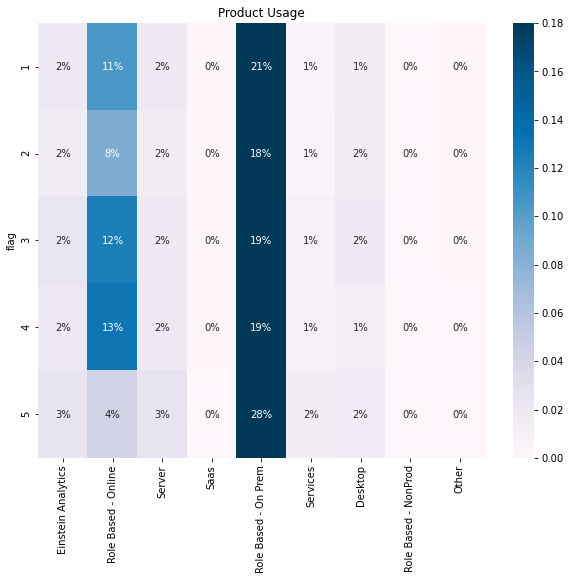

In [318]:
# display product usage 
product_use = summary.divide(cohort_size, axis=0)
product_use.round(decimals=3)
plt.figure(figsize=(10,8))
plt.title('Product Usage')
sns.heatmap(data=product_use, 
            annot= True,
            fmt='.0%',
            vmin=0.0,
            vmax=0.18,
            cmap='PuBu')
plt.show()